## <font color = 'green' id = "section" > Projet_7: Implémenter un modèle de scoring</font>

### <font color = 'green' id = "section" > Notebook 1: Dossier Code

# <font color="blue">Sommaire</font>
1. [Importation des librairies](#section_1)    
2. [Lecture du Dataset](#section_2)     
3. [Affichage des caracteristiques du jeu de données](#section_3)          
4. [Approche de modélisation](#section_4)  
    4.1 [Prepration de données](#section_4_1)   
    4.2 [Creation du preprocessor](#section_4_2)     
    4.3 [Séparation de données](#section_4_3)   
5. [Prediction de target](#section_5)  
    5.1 [Dummy classifier ](#section_5_1)   
    5.2 [Logistic Regression](#section_5_2)   
    5.3 [Random Forest Classifier ](#section_5_3)   
    5.4 [Gadient Boosting Classifier](#section_5_4)    
    5.3 [XGB Classifier](#section_5_5)       
    5.4 [KGBM Classifier](#section_5_6) 
6. [Choix du meilleur model](#section_6)    


# <font color ='red' id = 'section_1' > 1.Importation des librairies </font>

In [1]:
import pandas as pd
import numpy as np
import scipy.stats as st
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import ast
import scipy as sp
import time
from collections import Counter

#-------------------------------------------------------------------
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import  train_test_split
from sklearn.pipeline import make_pipeline

#-----------------------------------------------------------------
import sklearn
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.compose import TransformedTargetRegressor

#--------------------------------------------
from tqdm import tqdm
import gc
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler


#----------------------------------------------------
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

 #-----------------------------------------------------------
from sklearn.dummy import DummyClassifier

#------------------------------------------------------------
from lightgbm import LGBMClassifier

#------------------------------------------------------------
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler

#-----------------------------------------------------------
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier

#-----------------------------------------------------------
from xgboost import XGBClassifier

#-----------------------------------------------------------
from sklearn.linear_model import LogisticRegression

#-----------------------------------------------------------
from sklearn.metrics import *

#----------------------------------------------------
import lime
from lime import lime_tabular

In [2]:
import warnings
warnings.filterwarnings('ignore')
warnings.warn('DelftStack')
warnings.warn('Do not show this message')
print("No Warning Shown")

No Warning Shown


In [3]:
pd.set_option("display.max_columns", 500)
pd.set_option("display.max_rows", 500)

## Checklist
# Mission:

1. Construire un **modèle de scoring** qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique.


2. Construire un **dashboard interactif** à destination des gestionnaires de la relation client permettant **d'interpréter les prédictions** faites par le modèle, et d’améliorer la connaissance client des chargés de relation client.


# Objectifs/ Spécifications du dashboard:

**1**. Permettre de **visualiser le score et l’interprétation de ce score** pour chaque client de façon intelligible pour une personne non experte en data science.

**2.** Permettre de **visualiser des informations descriptives** relatives à un client (via un système de filtre).


**3.** Permettre de **comparer les informations descriptives** relatives à un client à l’ensemble des clients ou à un groupe de clients similaires.


# Objectifs/ Dossier:

Un dossier sur un outil de versioning de code doit contenir:


* Le **code de la modélisation** (du prétraitement à la prédiction)


* Le **code générant le dashboard**


* Le **code** permettant de **déployer le modèle sous forme d'API**.


# Objectifs/ note méthodologique :

Une note méthodologique décrivant :

* La méthodologie **d'entraînement du modèle** (2 pages maximum)


* La **fonction coût** métier, **l'algorithme d'optimisation** et la **métrique d'évaluation** (1 page maximum)


* **L’interprétabilité globale** et **locale** du modèle (1 page maximum)


* Les **limites** et les **améliorations possibles** (1 page maximum)


# Informations supplémentaires

* Sélectionner un kernel Kaggle pour nous faciliter la préparation des données nécessaires à l’élaboration du modèle de scoring.

* Analyser ce kernel et l’adapter pour nous assurer qu’il répond aux besoins de notre mission.


On peut  ainsi nous  focaliser sur:


* **L’élaboration du modèle**, 


* Son **optimisation**,


* Sa **compréhension**.

# Description des données

lien vers les données: https://www.kaggle.com/c/home-credit-default-risk/data

![title](home_credit.png)

# <font color="red" id="section_2"> 2. Chargement, lecture  et apercu  des données</font>

In [4]:
data_model = pd.read_csv("data_model.csv")

In [5]:
data_model.head(4)

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
0,100002,1.0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,1.0,3.0,0.0,351000.0,10.0,6.0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0.077212,0.498036,202500.0,0.121975,0.060748
1,100003,0.0,1,0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,2.0,1.0,1129500.0,3.0,1.0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0.065359,0.208736,135000.0,0.132215,0.027598
2,100004,0.0,0,1,0,0,0,0,0,0,0,0,0.0,1.0,0.0,2.0,1.0,135000.0,12.0,7.0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0.019177,0.500000,67500.0,0.100000,0.050000
3,100006,0.0,1,0,0,0,0,0,0,0,0,0,1.0,1.0,2.0,2.0,1.0,297000.0,27.0,7.0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0.153749,0.431748,67500.0,0.219896,0.094940


# <font color="red" id="section_3"> 3. Affichage des  caracteristiques du jeu de données

### Information

In [6]:
data_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307506 entries, 0 to 307505
Data columns (total 52 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   SK_ID_CURR                                         307506 non-null  int64  
 1   TARGET                                             307506 non-null  float64
 2   CODE_GENDER                                        307506 non-null  int64  
 3   FLAG_OWN_CAR                                       307506 non-null  int64  
 4   FLAG_OWN_REALTY                                    307506 non-null  int64  
 5   CNT_CHILDREN                                       307506 non-null  int64  
 6   REG_CITY_NOT_LIVE_CITY                             307506 non-null  int64  
 7   REG_REGION_NOT_LIVE_REGION                         307506 non-null  int64  
 8   REG_REGION_NOT_WORK_REGION                         307506 non-null  int64 

### Duplicité

In [7]:
data_model.duplicated().sum()

0

### Types de variables

In [8]:
data_model.dtypes.value_counts()

int64      38
float64    14
dtype: int64

### Valeurs manquantes

In [9]:
data_model.isna().sum().sum()

0

### Valeurs uniques

In [10]:
for col in data_model.columns:
    print("Nombre de  valeurs uniques de", col, "est : ", data_model[col].nunique())
    print("-"*70)

Nombre de  valeurs uniques de SK_ID_CURR est :  307506
----------------------------------------------------------------------
Nombre de  valeurs uniques de TARGET est :  2
----------------------------------------------------------------------
Nombre de  valeurs uniques de CODE_GENDER est :  2
----------------------------------------------------------------------
Nombre de  valeurs uniques de FLAG_OWN_CAR est :  2
----------------------------------------------------------------------
Nombre de  valeurs uniques de FLAG_OWN_REALTY est :  2
----------------------------------------------------------------------
Nombre de  valeurs uniques de CNT_CHILDREN est :  15
----------------------------------------------------------------------
Nombre de  valeurs uniques de REG_CITY_NOT_LIVE_CITY est :  2
----------------------------------------------------------------------
Nombre de  valeurs uniques de REG_REGION_NOT_LIVE_REGION est :  2
---------------------------------------------------------------

In [11]:
del data_model["SK_ID_CURR"]

# <font color="red" id="section_4"> 4. Approche de modélisation
### <font color="red" id="section_4_1"> 4.1 Preparation de données

In [12]:
data = data_model.copy()
data = data.sample(frac =0.3)
data.shape

(92252, 51)

In [13]:
data = data.astype(np.float64)

In [14]:
Y= data['TARGET']
Y.head(5)

268989    0.0
199539    0.0
283775    0.0
150580    0.0
73632     0.0
Name: TARGET, dtype: float64

In [15]:
X = data.drop(['TARGET'], axis =1)

In [16]:
X.head(2)

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
268989,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,225000.0,17.0,12.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.033841,0.152755,54900.0,0.067432,0.010301
199539,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,3.0,1.0,720000.0,19.0,12.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.142314,0.222919,121500.0,0.316774,0.070615


### <font color="red" id="section_4_2"> 4.2 Création de preprocessor

In [17]:
num_feature = X.columns.to_list()

In [18]:
numeric_pipeline = Pipeline( [
                             ('scaler', StandardScaler())
                                     ])
preprocessor = ColumnTransformer( [ 
                    ('num', numeric_pipeline, num_feature)
                ])

#### Fonction de récupération des noms des features aprés transformation

In [19]:
def get_feature_names(column_transformer):
    """Obetenir la liste des colonnes après transformation
    -------
    feature_names : liste des noms de caractères des 
    varaibles après transforamtion.
    """
    # Supprimer la fonction d'assistance interne
    #check_is_fitted(column_transformer)
    
    # Transformez loopkup en fonction pour une meilleure gestion avec le pipeline plus tard
    def get_names(trans):
        # >> Original get_feature_names() method
        if trans == 'drop' or (
                hasattr(column, '__len__') and not len(column)):
            return []
        if trans == 'passthrough':
            if hasattr(column_transformer, '_df_columns'):
                if ((not isinstance(column, slice))
                        and all(isinstance(col, str) for col in column)):
                    return column
                else:
                    return column_transformer._df_columns[column]
            else:
                indices = np.arange(column_transformer._n_features)
                return ['x%d' % i for i in indices[column]]
        if not hasattr(trans, 'get_feature_names'):
        # >>> Change: Return input column names if no method avaiable
            # Turn error into a warning
            warnings.warn("Transformer %s (type %s) does not "
                                 "provide get_feature_names. "
                                 "Will return input column names if available"
                                 % (str(name), type(trans).__name__))
            # For transformers without a get_features_names method, use the input
            # names to the column transformer
            if column is None:
                return []
            else:
                return [name + "__" + f for f in column]

        return [name + "__" + f for f in trans.get_feature_names()]
    
    ### Start of processing
    feature_names = []
    
    # Allow transformers to be pipelines. Pipeline steps are named differently, so preprocessing is needed
    if type(column_transformer) == sklearn.pipeline.Pipeline:
        l_transformers = [(name, trans, None, None) for step, name, trans in column_transformer._iter()]
    else:
        # For column transformers, follow the original method
        l_transformers = list(column_transformer._iter(fitted=True))
    
    
    for name, trans, column, _ in l_transformers: 
        if type(trans) == sklearn.pipeline.Pipeline:
            # Recursive call on pipeline
            _names = get_feature_names(trans)
            # if pipeline has no transformer that returns names
            if len(_names)==0:
                _names = [name + "__" + f for f in column]
            feature_names.extend(_names)
        else:
            feature_names.extend(get_names(trans))
    
    return feature_names

### <font color="red" id="section_4_3"> 4.3. Séparation des données

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size= 0.3, stratify =Y,  random_state =5)

In [21]:
X_train.shape

(64576, 50)

In [22]:
X_test.shape

(27676, 50)

In [23]:
X_train.dtypes.value_counts()

float64    50
dtype: int64

In [24]:
data['TARGET'].value_counts()

0.0    84935
1.0     7317
Name: TARGET, dtype: int64

# <font color="red" id="section_5"> 5. Prédiction de _TARGET_
    
Dans cette partie, nous prédire l'état de capacité de remboursement d'un client potentiel à travers les modèles suivants:
    
* **DummyClassifier**
    
* **LogisticRegression**
    
* **RandomForestClassifier**
    
* **GradientBoostingClassifer**
    
* **XBGClassifier**
    
* **LGBM**
    
 
## <font color="red" id="section_5_1"> 5.1 DummyClassifier
  
DummyClassifier effectue des prédictions qui ignorent les entités d'entrée.

Ce classificateur sert de référence simple à comparer avec d'autres classificateurs plus complexes

In [25]:
data.shape
#92251
#123002
#215253

(92252, 51)

### <font color="red" id="section_5_1_1"> 5.1.1 Entrainement du model

In [26]:
oversampler = SMOTE(sampling_strategy =1)   
undersampler = RandomUnderSampler(sampling_strategy = 1) 

In [27]:
model_dummy = Pipeline(steps = [
                ("preprocessor",  preprocessor),     
                ('oversampler', oversampler),
                ('undersampler', undersampler),
                ('classifier' , DummyClassifier(random_state =5)) 
                        ])

model_dummy.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['CODE_GENDER',
                                                   'FLAG_OWN_CAR',
                                                   'FLAG_OWN_REALTY',
                                                   'CNT_CHILDREN',
                                                   'REG_CITY_NOT_LIVE_CITY',
                                                   'REG_REGION_NOT_LIVE_REGION',
                                                   'REG_REGION_NOT_WORK_REGION',
                                                   'LIVE_REGION_NOT_WORK_REGION',
                                                   'REG_CITY_NOT_WORK_CITY',
                                                   'LIVE_CITY_NOT_WORK_CITY',

### <font color="red" id="section_5_1_2"> 5.1.2 Prediction

In [28]:
y_pred_proba = model_dummy.predict_proba(X_test)[:,1]

In [29]:
#on creé un vecteur de prediction a partir d'un de proba
#y__pred_proba = np.where(y_pred_proba >0.5, 1,0)

In [30]:
np.unique(y_pred_proba)

array([0.5])

### <font color="red" id="section_5_1_3"> 5.1.3 Evaluation du score ROC AUC

In [31]:
fpr_dym, tpr_dym, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc_score_dym = auc(fpr_dym, tpr_dym)

In [32]:
print(roc_auc_score_dym)

0.5


In [33]:
list_fpr = []
list_tpr = []
list_score = []
list_fpr.append(fpr_dym)
list_tpr.append(tpr_dym)
list_score.append(roc_auc_score_dym)

### <font color="red" id="section_5_1_4"> 5.1.4 Visualisation

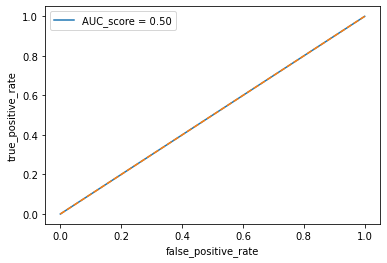

In [34]:
plt.plot(fpr_dym,tpr_dym, label = 'AUC_score = %0.2f'% roc_auc_score_dym )
plt.xlabel("false_positive_rate")
plt.ylabel("true_positive_rate")
plt.plot([0,1], [0,1], linestyle ='--')
plt.legend(loc = 'best')
plt.show()


## Conclusion:

Sur la courbe du score, on remarque la prédiction du modèle est très médiocre.

In [35]:
fpr_com = []
tpr_com = []
score_auc_com = []
fpr_com.append(fpr_dym)
tpr_com.append(tpr_dym)
score_auc_com.append(roc_auc_score_dym)

## <font color="red" id="section_5_2"> 5.2 LogisticRegression
Lien pour la documentation:
    
    
https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

In [36]:
oversampler = SMOTE(sampling_strategy =1)    
undersampler = RandomUnderSampler(sampling_strategy = 1)

### <font color="red" id="section_5_2_1"> 5.2.1 Optimisation des hyper params

In [37]:
params_log = {"classifier__C": [1, 5, 10], 
              'classifier__penalty':['l1', "l2"]}
            
pipe = Pipeline([
        ('preprocessor', preprocessor),
        ('oversampler', oversampler),
         ('undersampler', undersampler),
            ('classifier',LogisticRegression(solver = 'liblinear', random_state = 42) )])
    
search = GridSearchCV(pipe,
                      params_log,
                      cv=5,
                
                      verbose =10,
                            n_jobs = 1) 

In [38]:
t0 = time.time()
log_model_opt = search.fit(X_train, y_train)

t1  = time.time()
print("Le temps d'éxécution est", t1-t0)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5; 1/6] START classifier__C=1, classifier__penalty=l1.....................
[CV 1/5; 1/6] END classifier__C=1, classifier__penalty=l1;, score=0.585 total time=   6.4s
[CV 2/5; 1/6] START classifier__C=1, classifier__penalty=l1.....................
[CV 2/5; 1/6] END classifier__C=1, classifier__penalty=l1;, score=0.574 total time=   7.9s
[CV 3/5; 1/6] START classifier__C=1, classifier__penalty=l1.....................
[CV 3/5; 1/6] END classifier__C=1, classifier__penalty=l1;, score=0.575 total time=  21.6s
[CV 4/5; 1/6] START classifier__C=1, classifier__penalty=l1.....................
[CV 4/5; 1/6] END classifier__C=1, classifier__penalty=l1;, score=0.574 total time=   7.8s
[CV 5/5; 1/6] START classifier__C=1, classifier__penalty=l1.....................
[CV 5/5; 1/6] END classifier__C=1, classifier__penalty=l1;, score=0.575 total time=   9.8s
[CV 1/5; 2/6] START classifier__C=1, classifier__penalty=l2.....................

### Affichage des résulats

In [39]:
print("Best parameter (CV score=%0.3f):" % search.best_score_)
print(search.best_params_)

Best parameter (CV score=0.578):
{'classifier__C': 5, 'classifier__penalty': 'l2'}


In [40]:
df_result = pd.DataFrame.from_dict(log_model_opt.cv_results_).sort_values(by = ["rank_test_score"], ascending = True)
df_result.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__C,param_classifier__penalty,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
3,4.328338,0.893804,0.017602,0.003203,5,l2,"{'classifier__C': 5, 'classifier__penalty': 'l2'}",0.585398,0.575842,0.574913,0.575068,0.576849,0.577614,0.003952,1
1,3.827984,0.279806,0.022956,0.007056,1,l2,"{'classifier__C': 1, 'classifier__penalty': 'l2'}",0.585166,0.576229,0.573751,0.576461,0.576074,0.577536,0.003938,2
4,3.251325,0.511121,0.023866,0.007317,10,l1,"{'classifier__C': 10, 'classifier__penalty': '...",0.587179,0.576694,0.572358,0.573674,0.576384,0.577258,0.005222,3


In [41]:
np.mean(df_result[df_result.rank_test_score == 1]["mean_test_score"])

0.5776138536901894

In [42]:
np.mean(df_result[df_result.rank_test_score == 1]["std_test_score"])

0.0039520872181838035

#### Commentaire: 

### <font color="red" id="section_5_2_2"> 5.2.2 Entrainement du model

In [43]:
t0 = time.time()
model_log = Pipeline(steps = [
                ("preprocessor",  preprocessor),    
            ('oversampler', oversampler),
             ('undersampler', undersampler),
                ('classifier' , LogisticRegression(solver = 'liblinear',
                                                   C = 5, 
                                                   penalty = 'l2',
                                                   random_state =5
                                                              )) 
                        ])

model_log.fit(X_train, y_train)
t1 =time.time()
print("le temps d'éxécution est:", t1 -t0)

le temps d'éxécution est: 6.666046857833862


### <font color="red" id="section_5_2_3"> 5.2.3 Prediction

In [44]:
y_pred_proba_log = model_log.predict_proba(X_test)[:,1]

In [45]:
np.unique(y_pred_proba_log)

array([1.69866033e-05, 2.64493103e-05, 4.49080686e-05, ...,
       8.38632897e-01, 8.65774694e-01, 1.00000000e+00])

###  <font color= "red"  id= "section_5_2_4">   5.2.4 Matrice de confusion et les mesures  de performances
    
![title](tp_fn.png)
    

### <font color = 'red' >  a. Matrice de confusion

#### Explication du threshold :
    
Le seuil de décision est une valeur que nous fixons et qui va limiter qu’une valeur
appartient à la classe 0 ou à la classe 1.

Text(0.5, 1.0, 'Matrice de confusion')

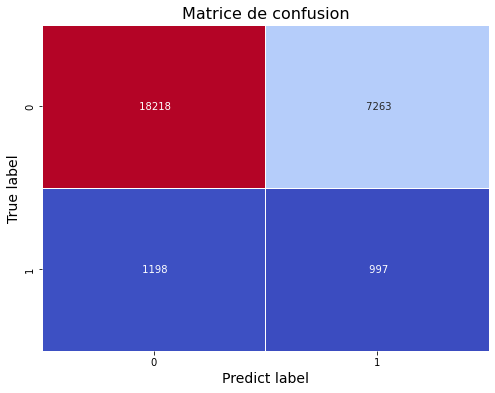

In [46]:
threshold = 0.55
y_pred_proba = model_log.predict_proba(X_test)[:, 1]
y_pred = np.where(y_pred_proba > threshold, 1, 0)


plt.figure(figsize = (8,6))
sns.heatmap(confusion_matrix(y_test, y_pred), annot = True ,fmt = " ", cmap = 'coolwarm', cbar = False, linewidth =0.6)
plt.ylabel("True label", fontsize = 14)
plt.xlabel("Predict label", fontsize = 14)
plt.title("Matrice de confusion", fontsize = 16)

### Commentaire: 

## <font color = 'red' >  b. Mesures de performance
    
### <font color = 'blue'>  Rappel
    
* **Rappel élevé**  : Un rappel élevé signifie que la plupart des cas positifs (TP+FN) seront étiquetés comme positifs (TP). Cela conduira probablement à un nombre plus élevé de mesures FP et à une précision globale inférieure.
    Un cas où ou  un rappel est élevé se trouve dans les modèles médicaux : 
    **Par exemple**, dans un modèle de détection de tumeur, si on veut modéliser pour étiqueter tout ce qui pourrait potentiellement être une tumeur à étiqueter comme une tumeur, car un médecin interprétera ensuite ces résultats.
    
    
    
* **Rappel faible** : Un rappel faible signifie qu'on un nombre élevé de FN (qui aurait dû être positif mais étiqueté négatif). Cela signifie qu'on a plus de certitude que si  on a  trouvé un cas positif, il s'agira probablement d'un vrai positif.   
 
        
## <font color = 'red' > Formule: $recall = \dfrac{True \ Positif}{True\  Positif \ + \ False\  Negatif}$
    
    
### <font color = 'blue' > Précision
    
La **précision** est assez similaire au recall. Elle permet de connaître le nombre de prédictions positifs bien effectuées.
Elle  minimise le nombre de faux positif (en bas à gauche de la matrice de confusion) et maximise vrai possitif.
    
        
## <font color = 'red' > Formule: $Precision = \dfrac{True \ Positif}{True\  Positif \ + \ False\  Positif}$
    

### <font color = 'blue' > Score F1 et fbeta score
   
Le **F1-score** est une métrique de classification qui mesure la capacité d’un modèle à bien prédire les individus positifs, tant en termes de **precision** (taux de prédictions positives correctes) qu’en termes de **recall** (taux de positifs correctement prédits)
    
**β < 1** : évaluation orientée vers la précision
     
**β > 1** : évaluation orientée rappel
    
## <font color = 'red' > Formule: $F1-score = 2*\dfrac{recall * precision}{recall\ + precision}$    
 
### Aide memoire: 
    
* Plus le recall est haut, plus le modèle repère de positif
    
* Plus la precision est haute, moins le modèle se trompe sur les positifs
    
* F1 Score est élevé, le plus votre modèle est performant.

In [47]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.94      0.71      0.81     25481
         1.0       0.12      0.45      0.19      2195

    accuracy                           0.69     27676
   macro avg       0.53      0.58      0.50     27676
weighted avg       0.87      0.69      0.76     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.4421188970846505


### <font color="red" id="section_5_2_5"> 5.2.5 Evaluation du score ROC_AUC ( Air sous la courbe)

In [48]:
fpr_log, tpr_log, thresholds = roc_curve(y_test, y_pred)
score_log =  roc_auc_score(y_test, y_pred)

In [49]:
print(score_log)

0.584589106949043


In [50]:
fpr = pd.DataFrame(fpr_log)
tpr = pd.DataFrame(tpr_log)

In [51]:
fpr.columns =["Taux"]
fpr.head()

,Taux
0,0.000000
1,0.285036
2,1.000000


In [52]:
tpr.columns =["Taux"]
tpr.head()

,Taux
0,0.000000
1,0.454214
2,1.000000


In [53]:
list_fpr.append(fpr_log)
list_tpr.append(tpr_log)
list_score.append(score_log)

### <font color="red" > Visualisation

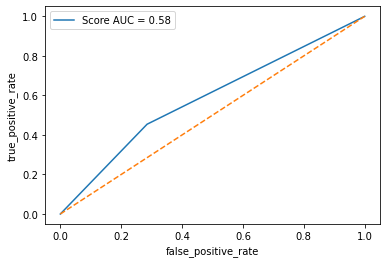

In [54]:
plt.plot(fpr['Taux'],tpr['Taux'], label = 'Score AUC = %0.2f'% score_log )
plt.xlabel("false_positive_rate")
plt.ylabel("true_positive_rate")
plt.plot([0,1], [0,1], linestyle ='--')
plt.legend(loc = 'best')
plt.show()


## Conclusion:

Sur la courbe du score, on remarque que le model a mieux appris sur les données  test.

### <font color = 'red' id = 'section_5_2_6'> 5.2.6 Optimisation du seuil de probabilité: Threshold

In [55]:
def threshold_from_optimal_tpr_minus_fpr(model, X_train, y_train, X_test, y_test):
            
            y_pred_proba = model.predict_proba(X_test)[:, 1]
        
            fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba) 

            optimal_idx = np.argmax(tpr - fpr)
            
    
            #y_pred_with_threshold = (y_pred_proba >= threshold).astype(int)
            y_pred_with_threshold = np.where(y_pred_proba > threshold,1,0 )

            return  thresholds[optimal_idx], tpr[optimal_idx] - fpr[optimal_idx], y_pred_with_threshold,


In [56]:
threshold, optimal_tpr_minus_fpr, y_pred_with_threshold = threshold_from_optimal_tpr_minus_fpr(model_log,
                                                                                    X_train, y_train, X_test, y_test)

#### Affichage du seuil optimale et les taux de faux et vrai posotif

In [57]:
print(" Le seuil optimal threshold correspondant au  taux TPR - FPR optimal est:", threshold)
print(" Et la valeur du  point optimum (TPR - FPR) corespondante :", optimal_tpr_minus_fpr)

 Le seuil optimal threshold correspondant au  taux TPR - FPR optimal est: 0.49307398312568235
 Et la valeur du  point optimum (TPR - FPR) corespondante : 0.1930607101150627


#### Affichage de la probabilté correspondante

In [58]:
y_pred_with_threshold

array([0, 0, 0, ..., 0, 1, 0])

### <font color ='red' > a. Visualisation matrice de confusion

In [59]:
cf_matrix = confusion_matrix(y_test,y_pred_with_threshold )

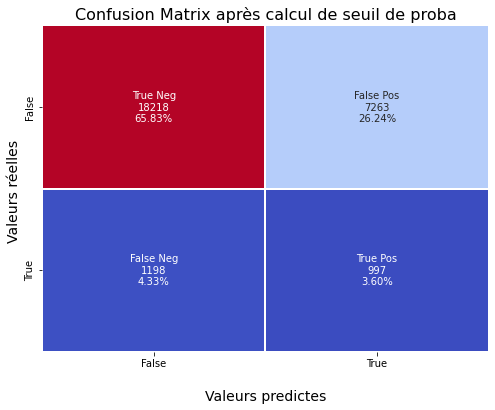

In [60]:
group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix.flatten()/np.sum(cf_matrix)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='coolwarm', cbar = False, linewidth =1.6)

ax.set_title('Confusion Matrix après calcul de seuil de proba', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color ='red' > b. Les mesures de performances correspondantes

In [61]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_with_threshold))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_with_threshold,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.94      0.71      0.81     25481
         1.0       0.12      0.45      0.19      2195

    accuracy                           0.69     27676
   macro avg       0.53      0.58      0.50     27676
weighted avg       0.87      0.69      0.76     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.4421188970846505


### commentaire:

Nous alons à présent contruire une fonction qui définira que le **coût** que les clients **classés dans la mauvaise  ou bonne catégorie** peut **coûter ou rapporter** à la banque.

### <font color = 'red' id =  "section_5_2_7" > 5.2.7 Fonction de coût métier
    
Concernant la fonction **cout** qui sera définie par rapport au **gain** et **perte** que cela rapporte à la banque après ses décisions de prêt.   
    
On remarque également que dans notre cas, les **bons client** prédits **mauvais** coûtent **plus** chers que les **mauvais clients** prédits **bons**.
    
Du coup, nous allons pénaliser dans la **fonction coût**, ces **Faux positifs* et **Faux Négatifs**.
    
Par conséquent nous théorisons les poids des variable ainsi: 
    
*  **tn_value  = 0**
    
* **fn_value =  10**
 
* **fp_value = 1** 
    
* **tp_value = 0**
    
##### On suppose que:
    
* Chaque **vrai négatif** (TN, **bons client classé bons**) signifie que nous pouvons vendre **X dollar** de produits de crédit supplémentaires à des clients qui ne feront pas défaut équivalent à un poids de négatif de **0** car ils ne générent pas de perte à la banque.
    
    
* Chaque **faux positif** (TP, **Mauvais classé bon**) nous coûte **Y dollars** car nous aurions pu engager ces clients, mais au lieu de cela, nous les avons évités, équivalent à un poids dpositif de **1** car ils engendre une perte.
    
    
* Chaque **faux négatif** (FP, **bons classé mauvais**) nous coûte **Z dollers**  parce que nous n'avons pas réussi à intervenir et à empêcher ces clients de faire défaut équivalent à un poids positif de **10**, car ils peuvent génèrer un gros manque à gagner.
    
    
* **Chaque vrai positif** (TP, **mauvais classé mauvais**) nous aide à prévenir les défaillances de crédit et chacun génère **B_dollars** de nouveaux revenu équivalent à un poids négatif de **0**, ils n'engendre pas de perte.
 
    

#### Construction de la fonction coût

In [62]:
def default_cost_function(tn , fp, fn,  tp):
    tn_value= 0
    fp_value= 1
    fn_value= 10  # 10 fois poids  fp_value
    tp_value= 0 
    # Cout total
    cost_total =  tn*tn_value + fp*fp_value  + fn*fn_value + tp*tp_value
    
    
    return cost_total

## Commentaire: 

Il nous faut à présent **optimiser cette fonction cout** et calculer les mesures de performances optimales associées.

Puis calculer la matrice de confusion correspondante à ces éléments optimaux.

### <font color="red" >  a. Optimisation de la fonction coût
    
#### <font color="red" > Etape 1: 
    
Dans cette $1^{iére}$ étape, nous allons stocker dans _threshold_ tous les seuils de probabilté qui permetront d'optimiser les paraméres et la **fonction coût**.

In [63]:
y_pred_proba = model_log.predict_proba(X_test)[:, 1]
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)

In [64]:
df_precisions = pd.DataFrame(precisions)
df_precisions.columns = ['Values']
df_precisions.head(3)

,Values
0,0.079336
1,0.079303
2,0.079306


#### <font color="red" > Etape 2:  
  
Pour chaque valeur du seuil de probabilté, on va calculer la probabilité correspondante et les éléments de la matrice de confusion.

In [65]:
costs = []
tns = []
fps = []
fns = []
tps = []
accuracies = []
        
for threshold in tqdm(thresholds):
        y_pred_with_threshold = np.where(y_pred_proba > threshold, 1,0 )
            
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred_with_threshold).ravel()
        
        accuracies.append((tp+tn)/(tn+fp+fn+tp))
        
        cout = default_cost_function(tn, fp, fn, tp)
        costs.append(cout)
        tns.append(tn)
        fps.append(fp)
        fns.append(fn)
        tps.append(tp)

100%|██████████| 27667/27667 [16:40<00:00, 27.66it/s]


#### <font color="red" > Etape 3: Dataframe Fonction coût
  
Nous allons construire un dataframe sur lequel, on pourra extraire les paramétres optimaux pour la fonction coût.

In [66]:
df_cost_accy = pd.DataFrame({'precision':precisions[:-1],
                              "accuracy": accuracies,
                                'recall':recalls[:-1], 
                                'threshold':thresholds, 
                                'cost':costs,
                                'tn':tns, 
                                'fp':fps,
                                'fn':fns,
                                'tp':tps})

In [67]:
df_cost_accy.head()

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079336,0.079600,1.000000,0.000067,25482,9,25472,1,2194
1,0.079303,0.079636,0.999544,0.000067,25481,10,25471,1,2194
2,0.079306,0.079672,0.999544,0.000077,25480,11,25470,1,2194
3,0.079309,0.079708,0.999544,0.000088,25479,12,25469,1,2194
4,0.079312,0.079744,0.999544,0.000088,25478,13,25468,1,2194


#### <font color="red" > Etape 4:  Récupération  de la valeur minimale de la fonction cout

In [68]:
min_cost = df_cost_accy['cost'].min()
min_cost

19039

In [69]:
threshold_opt_cost = df_cost_accy[df_cost_accy['cost']==min_cost].iloc[0]['threshold']

In [70]:
print("Le seuil de probabilité optimal pour minimiser la fonction cout est:", threshold_opt_cost)

Le seuil de probabilité optimal pour minimiser la fonction cout est: 0.5382577289616433


#### <font color="red" > Etape 5:  Prediction des client avec ce seuil optimal

In [71]:
y_pred_thresthold_opt = np.where(y_pred_proba > threshold_opt_cost,1,0 )

##  <font color="red" > b. Matrice de confusion optimale 

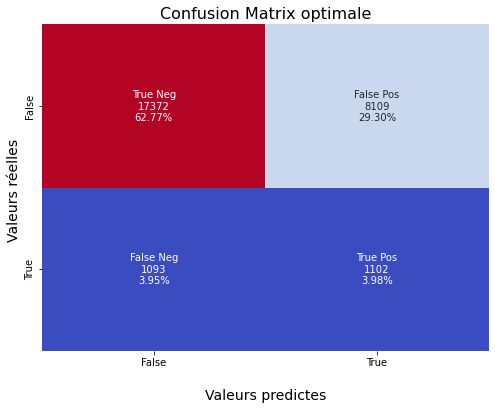

In [72]:
cf_matrix_opt = confusion_matrix(y_test, y_pred_thresthold_opt)

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_opt.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_opt.flatten()/np.sum(cf_matrix_opt)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_opt, annot=labels, fmt='', cmap='coolwarm', cbar = False)

ax.set_title('Confusion Matrix optimale', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color = 'red' > C. Les mesure de performances correspondantes

In [73]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_thresthold_opt))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_thresthold_opt,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.94      0.68      0.79     25481
         1.0       0.12      0.50      0.19      2195

    accuracy                           0.67     27676
   macro avg       0.53      0.59      0.49     27676
weighted avg       0.88      0.67      0.74     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.4866490898994802


### <font color="red" > Visualisation

In [74]:
df_cost_accy.head(2)

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079336,0.079600,1.000000,0.000067,25482,9,25472,1,2194
1,0.079303,0.079636,0.999544,0.000067,25481,10,25471,1,2194


In [75]:
df_mesure_cost = df_cost_accy[df_cost_accy["threshold"]==threshold_opt_cost][["precision","recall", "accuracy", "threshold" ]].T
df_mesure_cost.columns = ["Values"]
df_mesure_cost

,Values
precision,0.119627
recall,0.502050
accuracy,0.667510
threshold,0.538258


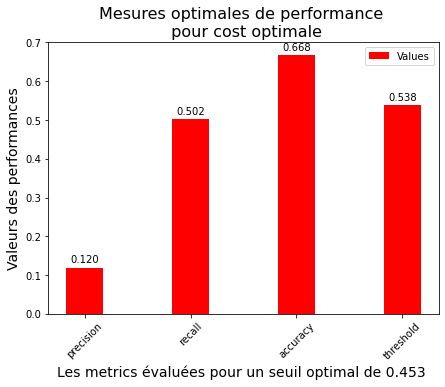

In [76]:
width = 0.35
fig, ax = plt.subplots(figsize = (7,5))
perf_values_cost = ax.bar(df_mesure_cost.index,  df_mesure_cost['Values'],
                 width, label='Values', color = 'red')
ax.set_ylabel("Valeurs des performances", fontsize = 14)
ax.set_title("Mesures optimales de performance \n pour cost optimale", fontsize = 16)

ax.tick_params(axis='x', labelrotation=45)
plt.xlabel("Les metrics évaluées pour un seuil optimal de 0.453 ", fontsize = 14)
ax.legend()
ax.bar_label(perf_values_cost, padding=3, fmt='%.3f')
plt.draw()

#### <font color="red" > Etape 7:  Visualisation de la fonction cout par rapport au seuil optimal

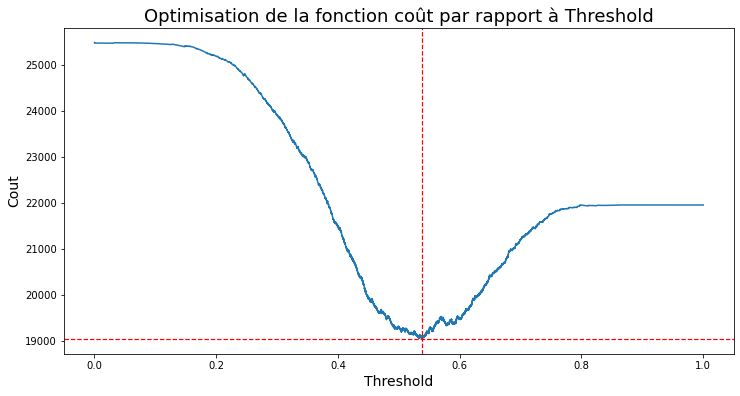

In [77]:
plt.figure(figsize = (12,6))
plt.plot(df_cost_accy["threshold"], df_cost_accy["cost"] )
plt.axvline(x = threshold_opt_cost, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.axhline(y = min_cost, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.xlabel("Threshold", fontsize = 14)
plt.ylabel("Cout", fontsize = 14)
plt.title("Optimisation de la fonction coût par rapport à Threshold", fontsize = 18)
plt.show()

### <font color="red" > Etape 8:  Evaluation du score ROC_AUC ( Air sous la courbe)

In [78]:
fpr_log, tpr_log, thresholds = roc_curve(y_test, y_pred_thresthold_opt)
score_log =  roc_auc_score(y_test, y_pred_thresthold_opt)

In [79]:
print(score_log)

0.5919064980213493


In [80]:
fpr = pd.DataFrame(fpr_log)
tpr = pd.DataFrame(tpr_log)

In [81]:
fpr.columns =["Taux"]
fpr.head()

,Taux
0,0.000000
1,0.318237
2,1.000000


In [82]:
tpr.columns =["Taux"]
tpr.head()

,Taux
0,0.00000
1,0.50205
2,1.00000


### <font color="red" > Visualisation

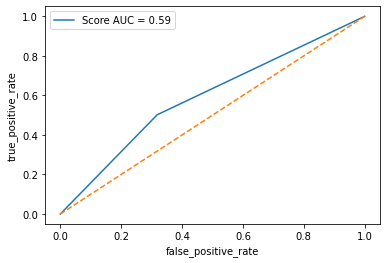

In [83]:
plt.plot(fpr['Taux'],tpr['Taux'], label = 'Score AUC = %0.2f'% score_log )
plt.xlabel("false_positive_rate")
plt.ylabel("true_positive_rate")
plt.plot([0,1], [0,1], linestyle ='--')
plt.legend(loc = 'best')
plt.show()


## Conclusion:

Sur la courbe du score, on remarque le model de classification est mauvais.

In [84]:
fpr_com.append(fpr_log)
tpr_com.append(tpr_log)
score_auc_com.append(score_log)

### <font color = 'red' id =  "section_5_2_8" > 5.2.8 Accuracy moyenne vs threshold
    
 On va maintenant chercher à maximiser  le **metric accuracy** en fonctio du seuil de décision **_Threshold**_ optimal.
    
 Contruire la matrice de confusion correspondante et le grahe

In [85]:
max_accuracy = df_cost_accy["accuracy"].max()
max_accuracy

0.9206894059835237

In [86]:
threshold_max_accu = df_cost_accy[df_cost_accy["accuracy"]==max_accuracy].iloc[0]["threshold"]

In [87]:
print("L seuil de probabilté optimale pour maximer la mesure accuracy est:", threshold_max_accu)

L seuil de probabilté optimale pour maximer la mesure accuracy est: 0.8386328965040177


In [88]:
y_pred_thresthold_opt_accu = np.where(y_pred_proba > threshold_max_accu,1,0 )

### <font color="red" > a. Matrice de confusion correspondante

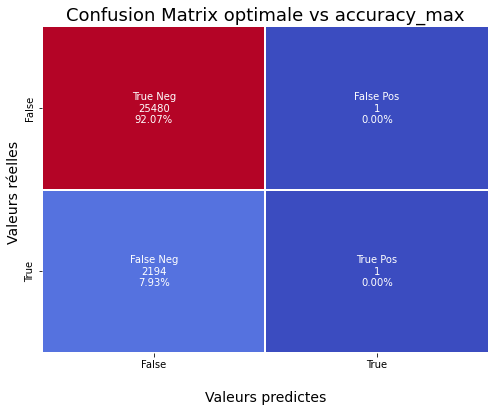

In [89]:
cf_matrix_opt_accu = confusion_matrix(y_test, y_pred_thresthold_opt_accu)

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_opt_accu.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_opt_accu.flatten()/np.sum(cf_matrix_opt_accu)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_opt_accu, annot=labels, fmt='', cmap='coolwarm', cbar = False, linewidth =1.6)

ax.set_title('Confusion Matrix optimale vs accuracy_max', fontsize = 18);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color = 'red' > b. Mesure de performances correspondantes

In [90]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_thresthold_opt_accu))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_thresthold_opt_accu,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     25481
         1.0       0.50      0.00      0.00      2195

    accuracy                           0.92     27676
   macro avg       0.71      0.50      0.48     27676
weighted avg       0.89      0.92      0.88     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.0004601324817085949


### <font color = 'red' > C.  Visualisation 

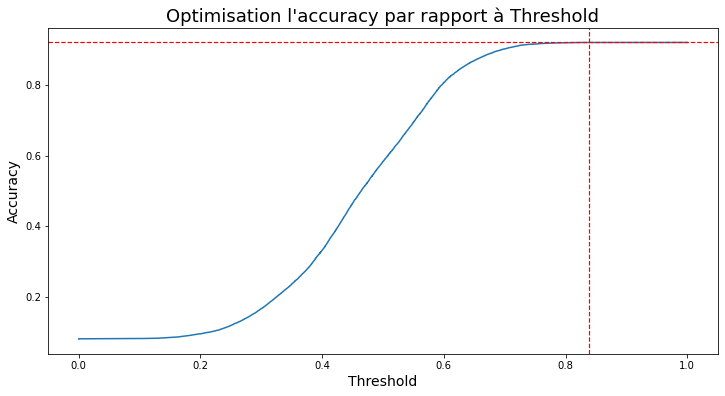

In [91]:
plt.figure(figsize = (12,6))
plt.plot(df_cost_accy["threshold"], df_cost_accy["accuracy"] )
plt.axvline(x = threshold_max_accu, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.axhline(y = max_accuracy, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.xlabel("Threshold", fontsize = 14)
plt.ylabel("Accuracy", fontsize = 14)
plt.title("Optimisation l'accuracy par rapport à Threshold", fontsize = 18)
plt.show()

### <font color="red" > D. Visualisation 

In [92]:
df_cost_accy.head(2)

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079336,0.079600,1.000000,0.000067,25482,9,25472,1,2194
1,0.079303,0.079636,0.999544,0.000067,25481,10,25471,1,2194


In [93]:
df_mesure = df_cost_accy[df_cost_accy["threshold"]==threshold_max_accu][["precision","recall", "accuracy", "threshold" ]].T
df_mesure.columns = ["Values"]
df_mesure

,Values
precision,0.333333
recall,0.000456
accuracy,0.920689
threshold,0.838633


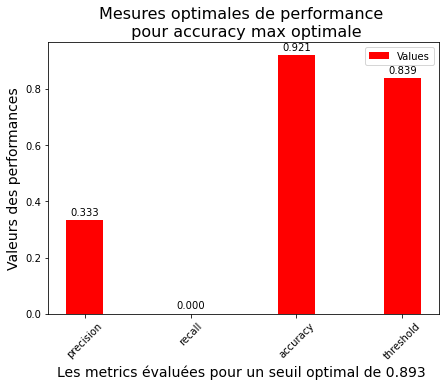

In [94]:
width = 0.35
fig, ax = plt.subplots(figsize = (7,5))
perf_values = ax.bar(df_mesure.index,  df_mesure['Values'],
                 width, label='Values', color = 'red')
ax.set_ylabel("Valeurs des performances", fontsize = 14)
ax.set_title("Mesures optimales de performance \n pour accuracy max optimale", fontsize = 16)

ax.tick_params(axis='x', labelrotation=45)
plt.xlabel("Les metrics évaluées pour un seuil optimal de 0.893 ", fontsize = 14)
ax.legend()
ax.bar_label(perf_values, padding=3, fmt='%.3f')
plt.draw()

## <font color="red" id="section_5_2_9"> 5.2.9 Coeficients  importances

In [95]:
coef_importances_values = model_log.named_steps['classifier'].coef_

In [96]:
coef_importances_values

array([[-0.22056379, -0.19144871, -0.05986291,  0.01276595,  0.0485091 ,
        -0.03582406,  0.08601671, -0.07553114,  0.10314865, -0.06541163,
        -0.03313974,  0.0283079 , -0.02484917, -0.0295956 , -0.02793204,
        -0.05502432, -0.00204989, -0.00617669,  0.07848974, -0.07848974,
        -0.03163393,  0.01003692,  0.34231421, -0.12232242, -0.0671882 ,
        -0.05374653,  0.02378932,  0.11734012,  0.03817023, -0.04172756,
        -0.00789767,  0.0429925 , -0.03268722, -0.01957169, -0.21977607,
        -0.12289112,  0.0207084 ,  0.0398731 ,  0.11004702, -0.00773178,
        -0.02773777,  0.01218415, -0.03075841,  0.01289476,  0.03798138,
         0.0184436 , -0.11515068, -0.14984533, -0.01448034, -0.05705163]])

### Visualisation

In [97]:
df_coef_log = pd.DataFrame(model_log.named_steps['classifier'].coef_.flatten(),
                          index=get_feature_names(preprocessor),
                          columns=["coef_Importance"]).sort_values(by = "coef_Importance", ascending =False)
df_coef_log.head(15)

,coef_Importance
num__NAME_INCOME_TYPE_Maternity leave,0.342314
num__NAME_INCOME_TYPE_Working,0.117340
num__NAME_EDUCATION_TYPE_Secondary / secondary special,0.110047
num__REG_CITY_NOT_WORK_CITY,0.103149
num__REG_REGION_NOT_WORK_REGION,0.086017
num__NAME_CONTRACT_TYPE_Cash loans,0.078490
num__REG_CITY_NOT_LIVE_CITY,0.048509
num__NAME_FAMILY_STATUS_Single / not married,0.042992
num__NAME_EDUCATION_TYPE_Lower secondary,0.039873
num__NAME_FAMILY_STATUS_Civil marriage,0.038170


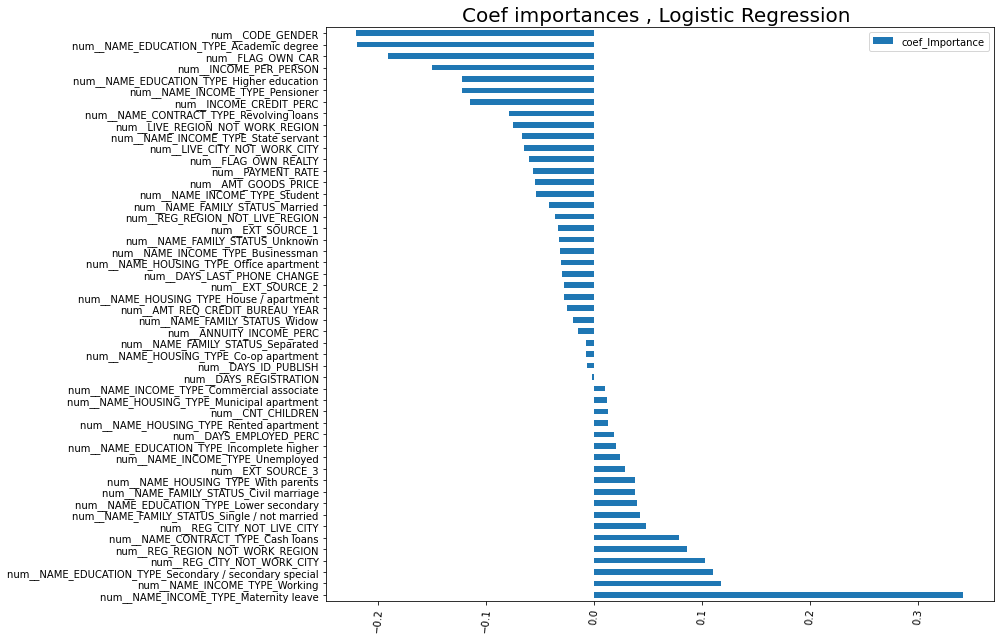

In [98]:
fig, ax = plt.subplots(figsize =(14,9))
df_coef_log.plot.barh(ax=ax)
ax.set_title("Coef importances , Logistic Regression ", Fontsize =20)
#ax.set_ylabel("Diminution moyenne des impuretés", fontsize =14)
plt.xticks(rotation =85)
fig.tight_layout()

### Mise à l'echelle des données pour une meilleure interpretation

En effet, d'après le graphique ci-dessus, le facteur le plus important dans la détermination la **faillibilté du client** semble être la variable **_CODE_GENDER_**, le genre du client même si notre intuition pourrait nous dire que des variables liés à aux revenus comme **_INCOME_CREDIT_PERC_**  devrait avoir plus d'impact.


Regarder le graphique des coefficients pour évaluer l'importance des caractéristiques peut être trompeur car certains d'entre eux varient à petite échelle, nous devons donc **comparer les écarts-types** de différentes caractéristiques.

In [99]:
X_train_transformed = pd.DataFrame(model_log[0].transform(X_train),
                          columns=X_train.columns,
                          index=X_train.index)

In [100]:
X_train_transformed.head(2)

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
284662,0.719504,1.390997,-0.669248,-0.576904,-0.289732,-0.124265,-0.229722,-0.205108,-0.547384,-0.469979,0.939833,-1.088279,-0.524895,0.008653,0.783811,2.823439,-0.175456,0.917089,0.326535,-0.326535,-0.003935,-0.553594,-0.003935,-0.463779,-0.279913,-0.005565,-0.013053,0.969434,-0.326012,-1.324967,3.769439,-0.417238,-0.003935,-0.236078,-0.023944,-0.570078,-0.186117,-0.111502,0.641601,-0.060949,0.359427,-0.196001,-0.092853,-0.127439,-0.227434,-0.090348,-0.312634,-0.565512,0.853914,0.289212
226950,-1.389847,-0.718909,1.494215,-0.576904,-0.289732,-0.124265,-0.229722,-0.205108,-0.547384,-0.469979,0.939833,0.918882,0.622903,-0.958971,0.783811,0.864500,-1.213393,0.675400,0.326535,-0.326535,-0.003935,-0.553594,-0.003935,-0.463779,-0.279913,-0.005565,-0.013053,0.969434,-0.326012,-1.324967,-0.265291,2.396712,-0.003935,-0.236078,-0.023944,1.754145,-0.186117,-0.111502,-1.558602,-0.060949,-2.782204,-0.196001,-0.092853,-0.127439,4.396873,-0.095066,1.374859,-0.151896,0.255884,1.694490


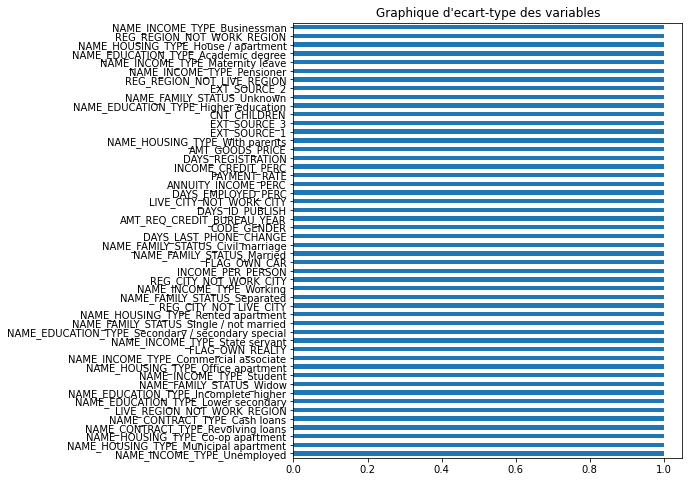

In [101]:
X_train_transformed.std(axis=0).sort_values(ascending =True).plot(kind="barh", figsize=(9, 8))
plt.title("Graphique d'ecart-type des variables")
plt.subplots_adjust(left=0.3)

### Commentaire: 

**1.** Les écart-types sont tous égaux, donc la normalisation par l'ecart-types reste sans effet.


**2.** Ainsi, les variables qui ont plus d'impact sur la faillibilté ou non de remboursement de crédit sont:

* **CODE_GENDER** : Le genre des clients

* **NAME_INCOME_TYPE_Working** : Le type de contrat de travail du client

* **FLAG OWN CAR** : Capacité de remboursement

## <font color="red" id="section_5_2_10"> 5.2.10 coef des features pour un client spécifique

Documentation : https://lime-ml.readthedocs.io/en/latest/lime.html
    
    
Ressource utile: https://coderzcolumn.com/tutorials/machine-learning/how-to-use-lime-to-understand-sklearn-models-predictions#lime_tabular_ex2

In [102]:
X_test_transformed = pd.DataFrame(model_log[0].transform(X_test),
                          columns=X_test.columns,
                          index=X_test.index)

In [103]:
X_test_transformed.head(2)

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
195935,0.719504,-0.718909,-0.669248,-0.576904,-0.289732,-0.124265,-0.229722,-0.205108,-0.547384,-0.469979,0.939833,0.918882,-0.524895,-1.442783,0.783811,-0.665920,0.758688,0.675400,0.326535,-0.326535,-0.003935,-0.553594,-0.003935,2.156200,-0.279913,-0.005565,-0.013053,-1.031530,-0.326012,-1.324967,-0.265291,2.396712,-0.003935,-0.236078,-0.023944,-0.570078,-0.186117,-0.111502,0.641601,-0.060949,0.359427,-0.196001,-0.092853,-0.127439,-0.227434,-0.139612,-0.381257,-0.636311,0.602679,0.064162
179340,0.719504,-0.718909,-0.669248,-0.576904,-0.289732,-0.124265,-0.229722,-0.205108,-0.547384,-0.469979,0.939833,0.918882,0.049004,0.492466,0.783811,0.007465,-0.486837,1.158778,-3.062459,3.062459,-0.003935,-0.553594,-0.003935,-0.463779,-0.279913,-0.005565,-0.013053,0.969434,-0.326012,0.754736,-0.265291,-0.417238,-0.003935,-0.236078,-0.023944,-0.570078,-0.186117,-0.111502,0.641601,-0.060949,0.359427,-0.196001,-0.092853,-0.127439,-0.227434,-0.024510,-0.187956,-0.040107,-0.278380,-0.251631


### Client spécifique

In [104]:
idx = X_test_transformed.index[100]
idx

232531

In [111]:
data.loc[data.index== 232531, :]

,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
232531,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,1.0,252000.0,10.0,14.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.155326,0.402491,119250.0,0.082247,0.033104


In [106]:
explainer_log = lime_tabular.LimeTabularExplainer(
                X_test_transformed, mode='classification',
                                 feature_names=X_test_transformed.columns,
                             class_names=["0", "1"],
                        discretize_continuous=False)

exp_log = explainer_log.explain_instance(
    data_row=X_test_transformed.iloc[100], 
    predict_fn=model_log[-1].predict_proba
)

### Visualisation

In [107]:
exp_log.show_in_notebook(show_table=False)

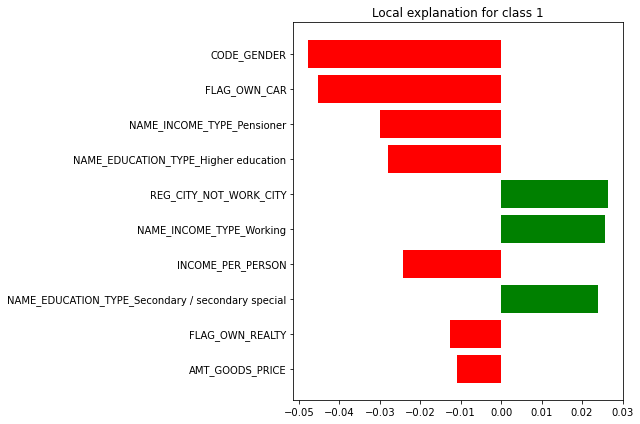

In [110]:
plt.rcParams['figure.figsize'] =[9,6]
exp_log.as_pyplot_figure()
plt.tight_layout()

## Commentaire : 

Ce client **"232531"** sera considéré comme étant **non en faillite** au regard des information sur le graphique: Ainsi :

Les variables qui jouent plus  en sa défaveur sont:
*  **REG CITY NOT WORK CITY**: Ne pas travailler dans la ville qu'il habite

*  **NAME INCOME TYPE Working**: Type de contrat de travail.

* **NAME EDUCATION TYPE SECONDARY / secondary special**: Niveau d'education spécial

Et les variables qui jouent plus  en sa faveur son entre autres: 

*  **CODE GENDER**: Un homme

*  **FLAG OWN CAR**

* **NAME INCOME TYPE PENSIONER** :Revenu de pension



## <font color="red" id="section_5_3"> 5.3 Random Forest Classifier
lien pour la documentation:
    
    
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

### <font color="red" id="section_5_3_1"> 5.3.1 Optimisation des hyper params

In [112]:
param_rfr = {'classifier__max_features' : ['sqrt', 'log2'], # Si "sqrt", alors max_features=sqrt(n_features), sinon log2
             'classifier__max_depth': [5, 8], # La profondeur maximale de l'arbre
             'classifier__n_estimators': [300,500,1000]}, # Le nombre d'arbres dans la forêt
            
pipe = Pipeline([
    ('preprocessor', preprocessor),
                    ('oversampler', oversampler),
                ('undersampler', undersampler),
    ('classifier',RandomForestClassifier(min_samples_leaf= 300,
                                         max_samples = 0.2,
                                         random_state = 5) )])
    
search_rfr = GridSearchCV(pipe,
                      param_rfr,
                      cv=5,
                
                      verbose =10,
                            n_jobs = 1) 

In [113]:
t0 = time.time()
rfr_model_opt = search_rfr.fit(X_train, y_train)

t1  = time.time()
print("Le temps d'éxécution est", t1-t0)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300
[CV 1/5; 1/12] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300;, score=0.774 total time=  15.4s
[CV 2/5; 1/12] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300
[CV 2/5; 1/12] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300;, score=0.743 total time=  11.9s
[CV 3/5; 1/12] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300
[CV 3/5; 1/12] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300;, score=0.751 total time=  13.9s
[CV 4/5; 1/12] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300
[CV 4/5; 1/12] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300;

[CV 4/5; 7/12] END classifier__max_depth=8, classifier__max_features=sqrt, classifier__n_estimators=300;, score=0.800 total time=  12.8s
[CV 5/5; 7/12] START classifier__max_depth=8, classifier__max_features=sqrt, classifier__n_estimators=300
[CV 5/5; 7/12] END classifier__max_depth=8, classifier__max_features=sqrt, classifier__n_estimators=300;, score=0.797 total time=  13.0s
[CV 1/5; 8/12] START classifier__max_depth=8, classifier__max_features=sqrt, classifier__n_estimators=500
[CV 1/5; 8/12] END classifier__max_depth=8, classifier__max_features=sqrt, classifier__n_estimators=500;, score=0.824 total time=  23.0s
[CV 2/5; 8/12] START classifier__max_depth=8, classifier__max_features=sqrt, classifier__n_estimators=500
[CV 2/5; 8/12] END classifier__max_depth=8, classifier__max_features=sqrt, classifier__n_estimators=500;, score=0.792 total time=  20.8s
[CV 3/5; 8/12] START classifier__max_depth=8, classifier__max_features=sqrt, classifier__n_estimators=500
[CV 3/5; 8/12] END classifie

### Affichage des résulats

In [114]:
print("Best parameter (CV score=%0.3f):" % search_rfr.best_score_)
print(search_rfr.best_params_)

Best parameter (CV score=0.803):
{'classifier__max_depth': 8, 'classifier__max_features': 'sqrt', 'classifier__n_estimators': 1000}


In [115]:
df_result_rfr = pd.DataFrame.from_dict(rfr_model_opt.cv_results_).sort_values(by = ["rank_test_score"], ascending = True)
df_result_rfr.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__max_depth,param_classifier__max_features,param_classifier__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
8,44.155271,2.771749,1.295831,0.077715,8,sqrt,1000,"{'classifier__max_depth': 8, 'classifier__max_...",0.816507,0.794038,0.800852,0.803871,0.797677,0.802589,0.007689,1
7,22.362356,2.902616,0.656209,0.111602,8,sqrt,500,"{'classifier__max_depth': 8, 'classifier__max_...",0.823630,0.791792,0.803562,0.800232,0.793419,0.802527,0.011400,2
6,12.751739,1.113308,0.393933,0.051276,8,sqrt,300,"{'classifier__max_depth': 8, 'classifier__max_...",0.816894,0.797832,0.797909,0.799535,0.797058,0.801846,0.007567,3


In [116]:
np.mean(df_result_rfr[df_result_rfr.rank_test_score == 1]["mean_test_score"])

0.8025889817009926

In [117]:
np.mean(df_result_rfr[df_result_rfr.rank_test_score == 1]["std_test_score"])

0.007689099549164801

#### Commentaire: 

### <font color="red" id="section_5_3_2"> 5.3.2 Entrainement du model

In [118]:
t0 = time.time()
model_rfr = Pipeline(steps = [
                ("preprocessor",  preprocessor), 
                    ('oversampler', oversampler),
                ('undersampler', undersampler),
                ('classifier' , RandomForestClassifier(n_estimators = 1000, 
                                                       max_depth = 8,
                                                       max_features = "sqrt" ,
                                                       min_samples_leaf= 300,
                                                        max_samples = 0.2,
                                                       random_state =5)) 
                            ])

model_rfr.fit(X_train, y_train)
t1 =time.time()
print("le temps d'éxécution est:", t1 -t0)

le temps d'éxécution est: 54.45773458480835


### <font color="red" id="section_5_3_3"> 5.3.3 Prediction

In [120]:
y_pred_proba_rfr = model_rfr.predict_proba(X_test)[:,1]

In [121]:
np.unique(y_pred_proba_rfr)

array([0.20305712, 0.20682541, 0.21055399, ..., 0.65227455, 0.65260619,
       0.65279139])

##  <font color= "red"  id= "section_5_3_4">   5.3.4 Matrice de confusion et les mesures  de performances

### <font color = 'red' >  a. Matrice de confusion

#### Explication du threshold :
    
Le seuil de décision est une valeur que nous fixons et qui va limiter qu’une valeur
appartient à la classe 0 ou à la classe 1.

Text(0.5, 1.0, 'Matrice de confusion')

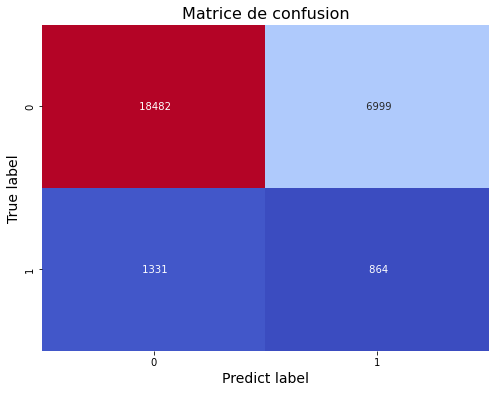

In [122]:
threshold = 0.46
y_pred_proba = model_rfr.predict_proba(X_test)[:, 1]
y_pred_rfr = np.where(y_pred_proba > threshold, 1, 0)


plt.figure(figsize = (8,6))
sns.heatmap(confusion_matrix(y_test, y_pred_rfr), annot = True ,fmt = " ", cmap = 'coolwarm', cbar = False)
plt.ylabel("True label", fontsize = 14)
plt.xlabel("Predict label", fontsize = 14)
plt.title("Matrice de confusion", fontsize = 16)

### Commentaire: 

## <font color = 'red' >  b. Mesures de performance 

In [123]:
print('Les metriques sur le training test cas random Forest Classifier:')
print("-"*75)
print(classification_report(y_test, y_pred_rfr))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_rfr,beta=10))


Les metriques sur le training test cas random Forest Classifier:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.93      0.73      0.82     25481
         1.0       0.11      0.39      0.17      2195

    accuracy                           0.70     27676
   macro avg       0.52      0.56      0.49     27676
weighted avg       0.87      0.70      0.76     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.3838091510052206


### <font color="red" id="section_5_3_5"> 5.3.5 Evaluation du score ROC_AUC ( Air sous la courbe)

In [124]:
fpr_rfr, tpr_rfr, thresholds = roc_curve(y_test, y_pred_rfr)
score_rfr =  roc_auc_score(y_test, y_pred_rfr)

In [125]:
print(score_rfr)

0.559473309828691


In [126]:
fpr = pd.DataFrame(fpr_rfr)
tpr = pd.DataFrame(tpr_rfr)

In [127]:
fpr.columns =["Taux"]
fpr.head()

,Taux
0,0.000000
1,0.274675
2,1.000000


In [128]:
tpr.columns =["Taux"]
tpr.head()

,Taux
0,0.000000
1,0.393622
2,1.000000


In [129]:
list_fpr.append(fpr_rfr)
list_tpr.append(tpr_rfr)
list_score.append(score_rfr)

### <font color="red" > Visualisation

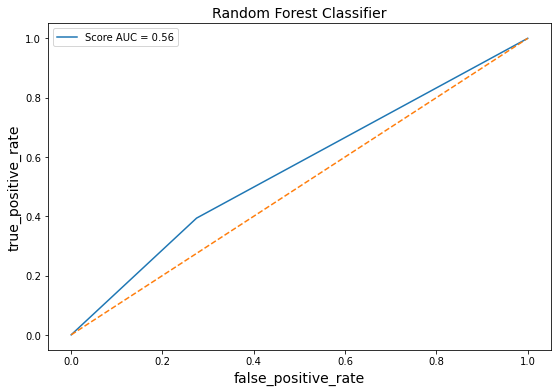

In [130]:
plt.plot(fpr['Taux'],tpr['Taux'], label = 'Score AUC = %0.2f'% score_rfr )
plt.xlabel("false_positive_rate", fontsize = 14)
plt.ylabel("true_positive_rate", fontsize = 14)
plt.plot([0,1], [0,1], linestyle ='--')
plt.title('Random Forest Classifier', fontsize = 14)
plt.legend(loc = 'best')
plt.show()


## Conclusion:

Sur la courbe du score, on remarque que le model a mieux appris sur les données  test.

## <font color = 'red' id = 'section_5_3_6'> 5.3.6 Optimisation du seuil de probabilité: Threshold

In [131]:
def threshold_from_optimal_tpr_minus_fpr(model, X_train, y_train, X_test, y_test):
            
            y_pred_proba = model.predict_proba(X_test)[:, 1]
        
            fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba) 

            optimal_idx = np.argmax(tpr - fpr)
            

            return  thresholds[optimal_idx], tpr[optimal_idx] - fpr[optimal_idx], y_pred_proba


In [132]:
threshold_rfr, optimal_tpr_minus_fpr, y_pred_proba_rfr = threshold_from_optimal_tpr_minus_fpr(model_rfr,
                                                                                    X_train, y_train, X_test, y_test)

#### Affichage du seuil optimale et les taux de faux et vrai positif

In [133]:
print(" Le seuil optimal threshold correspondant au  taux TPR - FPR optimal est:", threshold_rfr)
print(" Et la valeur du point optimum (TPR - FPR) corespondante :", optimal_tpr_minus_fpr)

 Le seuil optimal threshold correspondant au  taux TPR - FPR optimal est: 0.42878286606025534
 Et la valeur du point optimum (TPR - FPR) corespondante : 0.13412371485154106


#### Affichage de la probabilté correspondante

In [134]:
#y_pred_with_threshold = (y_pred_proba >= threshold).astype(int)
y_pred_with_threshold_rfr_optimum = np.where(y_pred_proba_rfr > threshold_rfr,1,0 )
y_pred_with_threshold_rfr_optimum

array([0, 1, 0, ..., 0, 0, 0])

### <font color ='red' > a. Visualisation matrice de confusion

In [135]:
cf_matrix_rfr = confusion_matrix(y_test,y_pred_with_threshold_rfr_optimum )

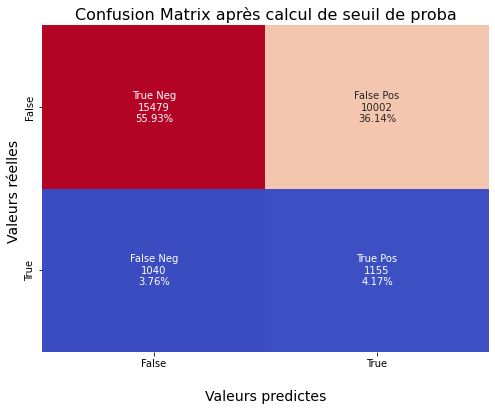

In [136]:
group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_rfr.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_rfr.flatten()/np.sum(cf_matrix_rfr)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_rfr, annot=labels, fmt='', cmap='coolwarm', cbar = False)

ax.set_title('Confusion Matrix après calcul de seuil de proba', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color ='red' > b. Les mesures de performances correspondantes

In [137]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_with_threshold_rfr_optimum))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_with_threshold_rfr_optimum,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.94      0.61      0.74     25481
         1.0       0.10      0.53      0.17      2195

    accuracy                           0.60     27676
   macro avg       0.52      0.57      0.46     27676
weighted avg       0.87      0.60      0.69     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.5057509635519408


### commentaire:

Nous alons à présent contruire une fonction qui définira que le **coût** que les clients **classés dans la mauvaise  ou bonne catégorie** peut **coûter ou rapporter** à la banque.

## <font color = 'red' id =  "section_5_3_7" > 5.3.7 Fonction de coût métier

### <font color="red" >  a. Optimisation de la fonction coût
    
#### <font color="red" > Etape 1: 
    
Dans cette $1^{iére}$ étape, nous allons stocker dans _threshold_ tous les seuils de probabilté qui permetront d'optimiser les paraméres et la **fonction coût**.

In [138]:
y_pred_proba_rfr = model_rfr.predict_proba(X_test)[:, 1]
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba_rfr)

In [139]:
df_precisions = pd.DataFrame(precisions)
df_precisions.columns = ['Values']
df_precisions.head(3)

,Values
0,0.079428
1,0.079395
2,0.079398


#### <font color="red" > Etape 2:  
  
Pour chaque valeur du seuil de probabilté, on va calculer la probabilité correspondante et les éléments de la matrice de confusion.

In [140]:
costs = []
tns = []
fps = []
fns = []
tps = []
accuracies = []
        
for threshold in tqdm(thresholds):
        y_pred_with_threshold_rfr = np.where(y_pred_proba_rfr > threshold, 1,0 )
            
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred_with_threshold_rfr).ravel()
      
        accuracies.append((tp+tn)/(tn+fp+fn+tp))
        cout = default_cost_function(tn, fp, fn, tp)
        costs.append(cout)
        tns.append(tn)
        fps.append(fp)
        fns.append(fn)
        tps.append(tp)

100%|██████████| 27635/27635 [13:10<00:00, 34.95it/s]


#### <font color="red" > Etape 3: Dataframe Fonction coût
  
Nous allons construire un dataframe sur lequel, on pourra extraire les paramétres optimaux pour la fonction coût.

In [141]:
df_cost_accu_rfr = pd.DataFrame({'precision':precisions[:-1],
                              "accuracy": accuracies,
                                'recall':recalls[:-1], 
                                'threshold':thresholds, 
                                'cost':costs,
                                'tn':tns, 
                                'fp':fps,
                                'fn':fns,
                                'tp':tps})

In [142]:
df_cost_accu_rfr.head()

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079428,0.080756,1.000000,0.229262,25450,41,25440,1,2194
1,0.079395,0.080792,0.999544,0.229341,25449,42,25439,1,2194
2,0.079398,0.080828,0.999544,0.229701,25448,43,25438,1,2194
3,0.079401,0.080864,0.999544,0.229772,25447,44,25437,1,2194
4,0.079404,0.080900,0.999544,0.229905,25446,45,25436,1,2194


#### <font color="red" > Etape 4:  Récupération  de la valeur minimale de la fonction cout

In [143]:
min_cost_rfr = df_cost_accu_rfr['cost'].min()
min_cost_rfr

20247

In [144]:
threshold_opt_cost_rfr = df_cost_accu_rfr[df_cost_accu_rfr['cost']==min_cost_rfr].iloc[0]['threshold']

In [145]:
print("Le seuil de probabilité optimal pour minimiser la fonction cout est:", threshold_opt_cost_rfr)

Le seuil de probabilité optimal pour minimiser la fonction cout est: 0.4587128495410496


#### <font color="red" > Etape 5:  Prediction des client avec ce seuil optimal

In [146]:
y_pred_thresthold_opt_rfr = np.where(y_pred_proba_rfr > threshold_opt_cost_rfr,1,0 )

##  <font color="red" > b. Matrice de confusion optimale 

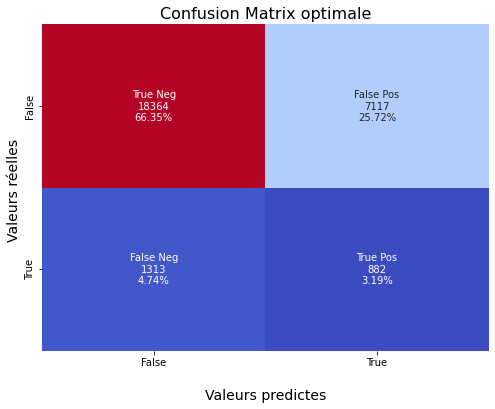

In [147]:
cf_matrix_opt_rfr = confusion_matrix(y_test, y_pred_thresthold_opt_rfr)

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_opt_rfr.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_opt_rfr.flatten()/np.sum(cf_matrix_opt_rfr)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_opt_rfr, annot=labels, fmt='', cmap='coolwarm', cbar = False)

ax.set_title('Confusion Matrix optimale', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color = 'red' > C. Les mesure de performances correspondantes

In [148]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_thresthold_opt_rfr))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_thresthold_opt_rfr,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.93      0.72      0.81     25481
         1.0       0.11      0.40      0.17      2195

    accuracy                           0.70     27676
   macro avg       0.52      0.56      0.49     27676
weighted avg       0.87      0.70      0.76     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.39157095196022834


### <font color="red" > Visualisation

In [149]:
df_cost_accu_rfr.head(2)

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079428,0.080756,1.000000,0.229262,25450,41,25440,1,2194
1,0.079395,0.080792,0.999544,0.229341,25449,42,25439,1,2194


In [150]:
df_mesure_cost = df_cost_accu_rfr[df_cost_accu_rfr["threshold"]==threshold_opt_cost_rfr][["precision","recall", 
                                                                                          "accuracy", "threshold" ]].T
df_mesure_cost.columns = ["Values"]
df_mesure_cost

,Values
precision,0.110250
recall,0.401822
accuracy,0.695404
threshold,0.458713


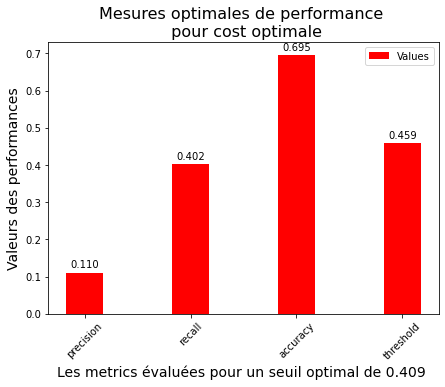

In [151]:
width = 0.35
fig, ax = plt.subplots(figsize = (7,5))
perf_values_cost = ax.bar(df_mesure_cost.index,  df_mesure_cost['Values'],
                 width, label='Values', color = 'red')
ax.set_ylabel("Valeurs des performances", fontsize = 14)
ax.set_title("Mesures optimales de performance \n pour cost optimale", fontsize = 16)

ax.tick_params(axis='x', labelrotation=45)
plt.xlabel("Les metrics évaluées pour un seuil optimal de 0.409 ", fontsize = 14)
ax.legend()
ax.bar_label(perf_values_cost, padding=3, fmt='%.3f')
plt.draw()

#### <font color="red" > Visualisation de la fonction cout par rapport au seuil optimal

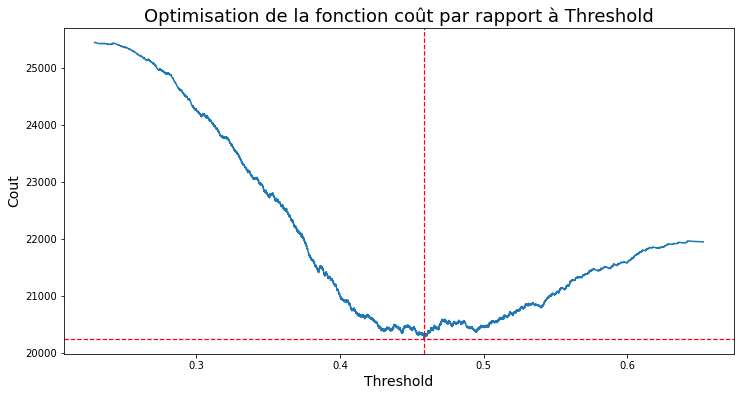

In [152]:
plt.figure(figsize = (12,6))
plt.plot(df_cost_accu_rfr["threshold"], df_cost_accu_rfr["cost"] )
plt.axvline(x = threshold_opt_cost_rfr, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.axhline(y = min_cost_rfr, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.xlabel("Threshold", fontsize = 14)
plt.ylabel("Cout", fontsize = 14)
plt.title("Optimisation de la fonction coût par rapport à Threshold", fontsize = 18)
plt.show()

### <font color="red" > Etape 8:  Evaluation du score ROC_AUC ( Air sous la courbe)

In [153]:
fpr_rfr, tpr_rfr, thresholds = roc_curve(y_test, y_pred_thresthold_opt_rfr)
score_rfr =  roc_auc_score(y_test, y_pred_thresthold_opt_rfr)

In [154]:
print(score_rfr)

0.5612580868911303


In [155]:
fpr = pd.DataFrame(fpr_rfr)
tpr = pd.DataFrame(tpr_rfr)

In [156]:
fpr.columns =["Taux"]
fpr

,Taux
0,0.000000
1,0.279306
2,1.000000


In [157]:
tpr.columns =["Taux"]
tpr.head()

,Taux
0,0.000000
1,0.401822
2,1.000000


### <font color="red" > Visualisation

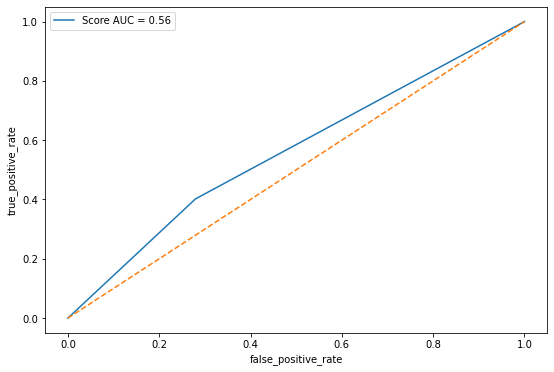

In [158]:
plt.plot(fpr['Taux'],tpr['Taux'], label = 'Score AUC = %0.2f'% score_rfr)
plt.xlabel("false_positive_rate")
plt.ylabel("true_positive_rate")
plt.plot([0,1], [0,1], linestyle ='--')
plt.legend(loc = 'best')
plt.show()


## Conclusion:

Sur la courbe du score, on remarque le model de classification est mauvais.

In [159]:
fpr_com.append(fpr_rfr)
tpr_com.append(tpr_rfr)
score_auc_com.append(score_rfr)

### <font color = 'red' id =  "section_5_3_8" > 5.3.8 Maximisation de  l'accuracy
    
 On va maintenant chercher à maximiser  le **metric accuracy** en fonctio du seuil de décision **_Threshold**_ optimal.
    
 Contruire la matrice de confusion correspondante et le grahe

In [160]:
max_accuracy = df_cost_accu_rfr["accuracy"].max()
max_accuracy

0.9206894059835237

In [161]:
max_precision = df_cost_accu_rfr["precision"].max()
max_precision

0.1830601092896175

In [162]:
threshold_max_accu = df_cost_accu_rfr[df_cost_accu_rfr["accuracy"]==max_accuracy].iloc[0]["threshold"]

In [163]:
print("L seuil de probabilté optimale pour maximer la mesure accuracy est:", threshold_max_accu)

L seuil de probabilté optimale pour maximer la mesure accuracy est: 0.6527913873977739


In [164]:
y_pred_thresthold_opt_accu = np.where(y_pred_proba_rfr > threshold_max_accu,1,0 )

### <font color="red" > a. Matrice de confusion correspondante

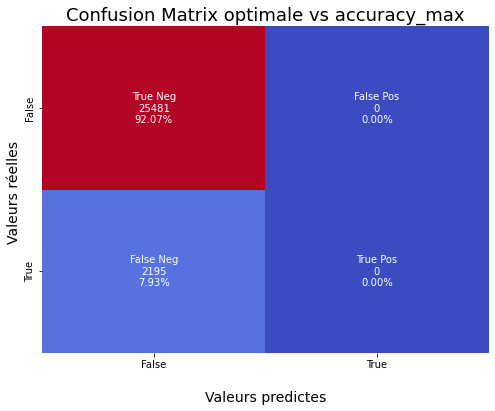

In [165]:
cf_matrix_opt_accu = confusion_matrix(y_test, y_pred_thresthold_opt_accu)

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_opt_accu.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_opt_accu.flatten()/np.sum(cf_matrix_opt_accu)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_opt_accu, annot=labels, fmt='', cmap='coolwarm', cbar = False)

ax.set_title('Confusion Matrix optimale vs accuracy_max', fontsize = 18);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color = 'red' > b. Mesure de performances correspondantes

In [166]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_thresthold_opt_accu))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_thresthold_opt_accu,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     25481
         1.0       0.00      0.00      0.00      2195

    accuracy                           0.92     27676
   macro avg       0.46      0.50      0.48     27676
weighted avg       0.85      0.92      0.88     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.0


### <font color = 'red' > C.  Visualisation 

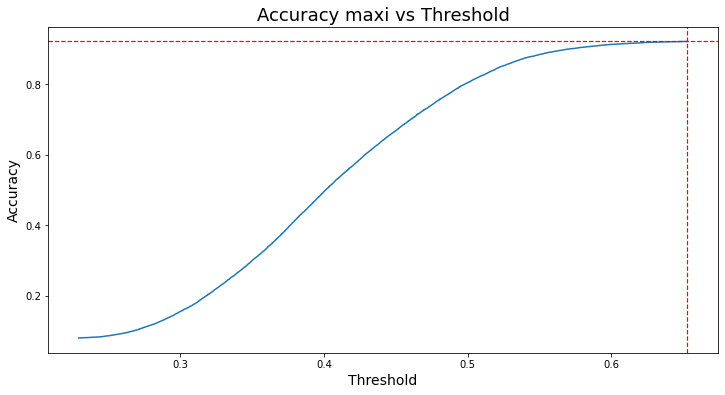

In [167]:
plt.figure(figsize = (12,6))
plt.plot(df_cost_accu_rfr["threshold"], df_cost_accu_rfr["accuracy"] )
plt.axvline(x = threshold_max_accu, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.axhline(y = max_accuracy, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.xlabel("Threshold", fontsize = 14)
plt.ylabel("Accuracy", fontsize = 14)
plt.title("Accuracy maxi vs Threshold", fontsize = 18)
plt.show()

### <font color="red" > D. Visualisation 

In [168]:
df_cost_accu_rfr.head(2)

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079428,0.080756,1.000000,0.229262,25450,41,25440,1,2194
1,0.079395,0.080792,0.999544,0.229341,25449,42,25439,1,2194


In [169]:
df_mesure = df_cost_accu_rfr[df_cost_accu_rfr["threshold"]==threshold_max_accu][["precision",
                                                                                 "recall", "accuracy", "threshold" ]].T
df_mesure.columns = ["Values"]
df_mesure

,Values
precision,0.000000
recall,0.000000
accuracy,0.920689
threshold,0.652791


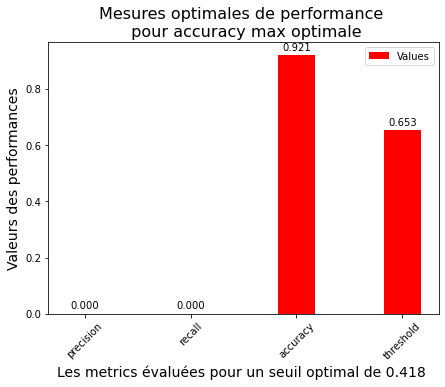

In [170]:
width = 0.35
fig, ax = plt.subplots(figsize = (7,5))
perf_values = ax.bar(df_mesure.index,  df_mesure['Values'],
                 width, label='Values', color = 'red')
ax.set_ylabel("Valeurs des performances", fontsize = 14)
ax.set_title("Mesures optimales de performance \n pour accuracy max optimale", fontsize = 16)

ax.tick_params(axis='x', labelrotation=45)
plt.xlabel("Les metrics évaluées pour un seuil optimal de 0.418 ", fontsize = 14)
ax.legend()
ax.bar_label(perf_values, padding=3, fmt='%.3f')
plt.draw()

## <font color="red" id="section_5_3_9"> 5.3.9 Features importances

In [171]:
feature_importances_values = model_rfr.named_steps['classifier'].feature_importances_

In [172]:
feature_importances_values

array([1.25019735e-01, 9.38677199e-02, 1.73993743e-02, 9.05344182e-02,
       2.90625630e-04, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       3.45770572e-03, 5.82547393e-04, 2.51166811e-02, 2.69362718e-02,
       1.88502652e-01, 1.20749671e-01, 3.38256022e-02, 1.66093166e-02,
       2.45845152e-02, 4.27923415e-02, 1.22151721e-03, 1.13384690e-03,
       0.00000000e+00, 3.31280761e-03, 0.00000000e+00, 4.37243391e-03,
       3.97213989e-04, 0.00000000e+00, 0.00000000e+00, 4.06474602e-02,
       6.34389699e-05, 3.51016634e-03, 8.31063430e-06, 1.32392587e-03,
       0.00000000e+00, 5.86426820e-06, 0.00000000e+00, 4.33532492e-02,
       9.72650787e-05, 0.00000000e+00, 2.84466333e-02, 0.00000000e+00,
       3.51745304e-04, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       6.82550877e-05, 1.18767325e-02, 1.32058703e-02, 2.14242616e-02,
       6.95368907e-03, 7.95613505e-03])

In [173]:
#Stockage dans un dataframe à la sortie et trie par ordre decroissant sur les importances
model_rfr_import= pd.DataFrame(model_rfr.named_steps['classifier'].feature_importances_.flatten(),
                          index=get_feature_names(preprocessor),
                          columns=["importances"]).sort_values(by = "importances", ascending =False)
model_rfr_import.head()

,importances
num__AMT_REQ_CREDIT_BUREAU_YEAR,0.188503
num__CODE_GENDER,0.125020
num__DAYS_LAST_PHONE_CHANGE,0.120750
num__FLAG_OWN_CAR,0.093868
num__CNT_CHILDREN,0.090534


### Visualisation

In [174]:
#On calcules les inportancs des features
feature_importances = model_rfr.named_steps['classifier'].feature_importances_
#on recupere les noms des features
features_names = get_feature_names(preprocessor)
#On calucle l'ecart types des feeatures et stocker le resulats sur une liste
std = np.std([tree.feature_importances_ for tree in model_rfr.named_steps['classifier']])
              
#On convertit les resulats en Series
df_feature_importance = pd.Series(feature_importances, index=features_names)
# On trie  dans l'odres decroissant
df_feature_importance= df_feature_importance.sort_values(ascending =False)
# On affiches les resulats
df_feature_importance= df_feature_importance.head(15)

In [175]:
df_feature_importance

num__AMT_REQ_CREDIT_BUREAU_YEAR                           0.188503
num__CODE_GENDER                                          0.125020
num__DAYS_LAST_PHONE_CHANGE                               0.120750
num__FLAG_OWN_CAR                                         0.093868
num__CNT_CHILDREN                                         0.090534
num__NAME_EDUCATION_TYPE_Higher education                 0.043353
num__DAYS_ID_PUBLISH                                      0.042792
num__NAME_INCOME_TYPE_Working                             0.040647
num__EXT_SOURCE_2                                         0.033826
num__NAME_EDUCATION_TYPE_Secondary / secondary special    0.028447
num__EXT_SOURCE_3                                         0.026936
num__EXT_SOURCE_1                                         0.025117
num__DAYS_REGISTRATION                                    0.024585
num__INCOME_PER_PERSON                                    0.021424
num__FLAG_OWN_REALTY                                      0.01

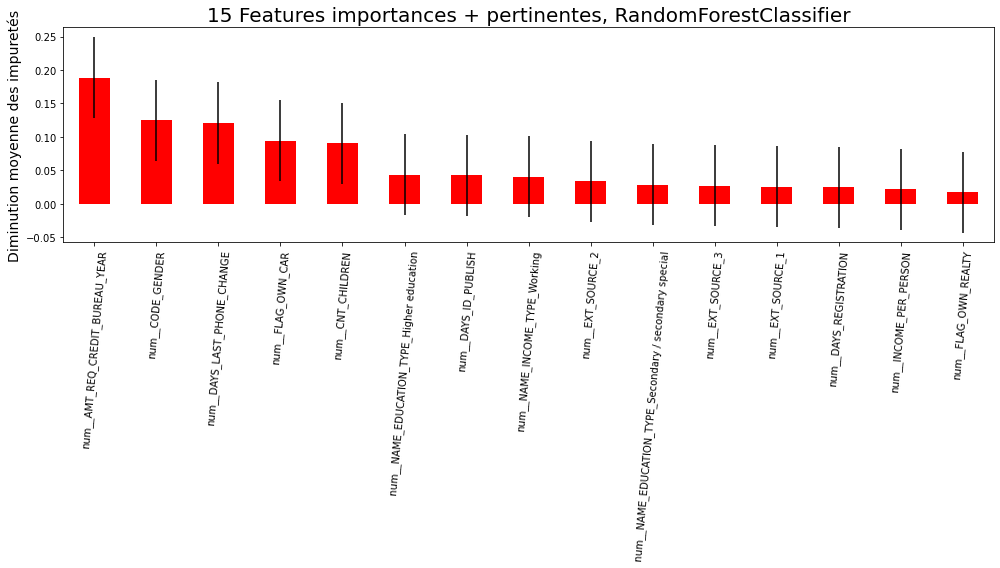

In [176]:
fig, ax = plt.subplots(figsize =(14,8))
df_feature_importance.plot.bar(yerr=std, ax=ax, color ='red')
ax.set_title("15 Features importances + pertinentes, RandomForestClassifier", Fontsize =20)
ax.set_ylabel("Diminution moyenne des impuretés", fontsize =14)
plt.xticks(rotation =85)
fig.tight_layout()

### Commentaire: 

Ainsi, les variables qui ont plus d'impact sur la faillibilté ou non de remboursement de crédit sont:

* **AMT REQ CRDIT BUREAU YEARS** 

* **CODE GENDER**: Le genre du client

* **FLAG OWN CAR**:

## <font color="red" id="section_5_3_10"> 5.3.10 Importance des features pour un client spécifique

In [177]:
X_test_transformed = pd.DataFrame(model_rfr[0].transform(X_test),
                          columns=X_test.columns,
                          index=X_test.index)

In [178]:
X_test_transformed.head(2)

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
195935,0.719504,-0.718909,-0.669248,-0.576904,-0.289732,-0.124265,-0.229722,-0.205108,-0.547384,-0.469979,0.939833,0.918882,-0.524895,-1.442783,0.783811,-0.665920,0.758688,0.675400,0.326535,-0.326535,-0.003935,-0.553594,-0.003935,2.156200,-0.279913,-0.005565,-0.013053,-1.031530,-0.326012,-1.324967,-0.265291,2.396712,-0.003935,-0.236078,-0.023944,-0.570078,-0.186117,-0.111502,0.641601,-0.060949,0.359427,-0.196001,-0.092853,-0.127439,-0.227434,-0.139612,-0.381257,-0.636311,0.602679,0.064162
179340,0.719504,-0.718909,-0.669248,-0.576904,-0.289732,-0.124265,-0.229722,-0.205108,-0.547384,-0.469979,0.939833,0.918882,0.049004,0.492466,0.783811,0.007465,-0.486837,1.158778,-3.062459,3.062459,-0.003935,-0.553594,-0.003935,-0.463779,-0.279913,-0.005565,-0.013053,0.969434,-0.326012,0.754736,-0.265291,-0.417238,-0.003935,-0.236078,-0.023944,-0.570078,-0.186117,-0.111502,0.641601,-0.060949,0.359427,-0.196001,-0.092853,-0.127439,-0.227434,-0.024510,-0.187956,-0.040107,-0.278380,-0.251631


### Client spécifique

In [179]:
idx = X_test_transformed.index[3]
idx

98785

In [180]:
data.loc[data.index== 98785, :]

,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
98785,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,4.0,0.0,675000.0,13.0,5.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.040005,0.675676,56250.0,0.21552,0.145622


In [181]:
explainer_rfr = lime_tabular.LimeTabularExplainer(
                X_test_transformed, mode='classification',
                                 feature_names=X_test_transformed.columns,
                             class_names=["0", "1"],
                        discretize_continuous=False)

exp_rfr = explainer_rfr.explain_instance(
    data_row=X_test_transformed.iloc[3], 
    predict_fn=model_rfr[-1].predict_proba
)

### Visualisation

In [182]:
exp_rfr.show_in_notebook(show_table=False)

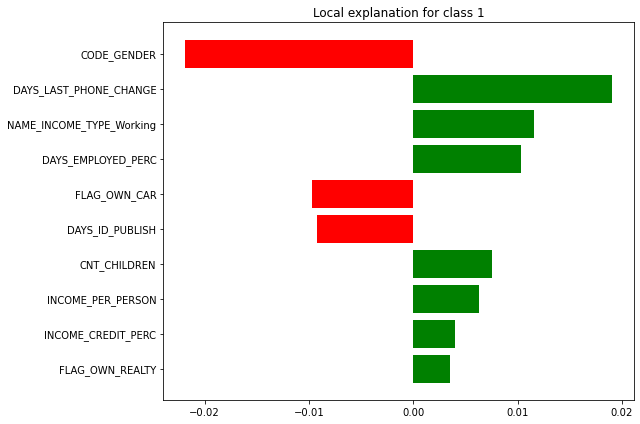

In [184]:
plt.rcParams['figure.figsize'] =[9,6]
exp_rfr.as_pyplot_figure()
plt.tight_layout()

## Commentaire : 

Ce client **"98785"**  sera considéré comme étant **non en faillite** au regard des information sur le graphique, ansi:

Les variables qui jouent plus  en sa défaveur sont:

*  **LAST DAYS PHONE CHANGE***

* **NAME INCOME TYPE WORKING**

* **DAYS EMPLOYED PERC**

Et les variables qui jouent plus  en sa faveur sont:

*  **CODE GENDER**

* **FLAG OWN CAR** 

* **DAYS ID PUBLISH**: Date de publication de la demande

## <font color="red" id="section_5_4"> 5.4 Gradient  Boosting Classifier
lien pour la documentation:
    
    
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html

### <font color="red" id="section_5_4_1"> 5.4.1 Optimisation des hyper params

In [185]:
param_gbc = {'classifier__max_features' : ['sqrt', 'log2'], # Si "sqrt", alors max_features=sqrt(n_features), sinon log2
             'classifier__min_samples_split': [100, 300, 500], # Le nombre min d'échantillons  pour diviser un nœud interne
             'classifier__n_estimators': [100,300]}, # Le nombre d'étapes de boosting à effectuer
            
pipe = Pipeline([
    ('preprocessor', preprocessor),
                    ('oversampler', oversampler),
                ('undersampler', undersampler),
    ('classifier',GradientBoostingClassifier(max_depth = 8, 
                                         random_state = 5))
                ])
    
search_gbc = GridSearchCV(pipe,
                      param_gbc,
                      cv=5,
                
                      verbose =10,
                            n_jobs = 1) 

In [186]:
t0 = time.time()
gbc_model_opt = search_gbc.fit(X_train, y_train)

t1  = time.time()
print("Le temps d'éxécution est", t1-t0)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START classifier__max_features=sqrt, classifier__min_samples_split=100, classifier__n_estimators=100
[CV 1/5; 1/12] END classifier__max_features=sqrt, classifier__min_samples_split=100, classifier__n_estimators=100;, score=0.920 total time=  28.8s
[CV 2/5; 1/12] START classifier__max_features=sqrt, classifier__min_samples_split=100, classifier__n_estimators=100
[CV 2/5; 1/12] END classifier__max_features=sqrt, classifier__min_samples_split=100, classifier__n_estimators=100;, score=0.920 total time=  32.3s
[CV 3/5; 1/12] START classifier__max_features=sqrt, classifier__min_samples_split=100, classifier__n_estimators=100
[CV 3/5; 1/12] END classifier__max_features=sqrt, classifier__min_samples_split=100, classifier__n_estimators=100;, score=0.921 total time=  33.4s
[CV 4/5; 1/12] START classifier__max_features=sqrt, classifier__min_samples_split=100, classifier__n_estimators=100
[CV 4/5; 1/12] END classifier__max

[CV 2/5; 7/12] END classifier__max_features=log2, classifier__min_samples_split=100, classifier__n_estimators=100;, score=0.919 total time=  21.5s
[CV 3/5; 7/12] START classifier__max_features=log2, classifier__min_samples_split=100, classifier__n_estimators=100
[CV 3/5; 7/12] END classifier__max_features=log2, classifier__min_samples_split=100, classifier__n_estimators=100;, score=0.918 total time=  21.6s
[CV 4/5; 7/12] START classifier__max_features=log2, classifier__min_samples_split=100, classifier__n_estimators=100
[CV 4/5; 7/12] END classifier__max_features=log2, classifier__min_samples_split=100, classifier__n_estimators=100;, score=0.917 total time=  20.8s
[CV 5/5; 7/12] START classifier__max_features=log2, classifier__min_samples_split=100, classifier__n_estimators=100
[CV 5/5; 7/12] END classifier__max_features=log2, classifier__min_samples_split=100, classifier__n_estimators=100;, score=0.918 total time=  21.4s
[CV 1/5; 8/12] START classifier__max_features=log2, classifier__

### Affichage des résultats

In [187]:
print("Best parameter (CV score=%0.3f):" % search_gbc.best_score_)
print(search_gbc.best_params_)

Best parameter (CV score=0.920):
{'classifier__max_features': 'sqrt', 'classifier__min_samples_split': 300, 'classifier__n_estimators': 300}


In [188]:
df_result_gbc = pd.DataFrame.from_dict(gbc_model_opt.cv_results_).sort_values(by = ["rank_test_score"], ascending = True)
df_result_gbc.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__max_features,param_classifier__min_samples_split,param_classifier__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
3,77.597566,0.993042,0.197172,0.007851,sqrt,300,300,"{'classifier__max_features': 'sqrt', 'classifi...",0.920331,0.920170,0.920635,0.920557,0.920325,0.920404,0.000169,1
5,80.184845,7.029869,0.235500,0.029201,sqrt,500,300,"{'classifier__max_features': 'sqrt', 'classifi...",0.920331,0.920170,0.920480,0.920480,0.920403,0.920373,0.000115,2
1,84.914442,7.425751,0.229917,0.016967,sqrt,100,300,"{'classifier__max_features': 'sqrt', 'classifi...",0.920331,0.920325,0.920635,0.920325,0.920170,0.920357,0.000151,3


In [189]:
np.mean(df_result_gbc[df_result_gbc.rank_test_score == 1]["mean_test_score"])

0.9204038663357036

In [190]:
np.mean(df_result_gbc[df_result_gbc.rank_test_score == 1]["std_test_score"])

0.00016909314170555743

#### Commentaire: 

### <font color="red" id="section_5_4_2"> 5.4.2 Entrainement du model

In [191]:
t0 = time.time()
model_gbc = Pipeline(steps = [
                ("preprocessor",  preprocessor),
                    ('oversampler', oversampler),
                ('undersampler', undersampler),
                ('classifier' , GradientBoostingClassifier(n_estimators = 300, 
                                                       max_depth = 8,
                                                       max_features = "sqrt" ,
                                                       min_samples_split=300,
                                                       random_state =5)) 
                        ])

model_gbc.fit(X_train, y_train)
t1 =time.time()
print("le temps d'éxécution est:", t1 -t0)

le temps d'éxécution est: 124.501779794693


### <font color="red" id="section_5_4_3"> 5.4.3 Prediction

In [192]:
y_pred_proba_gbc = model_gbc.predict_proba(X_test)[:,1]

In [193]:
np.unique(y_pred_proba_gbc)

array([0.00199686, 0.00208837, 0.00223808, ..., 0.57179605, 0.59159433,
       0.65555106])

###  <font color= "red"  id= "section_5_4_4">   5.4.4 Matrice de confusion et les mesures  de performances    

### <font color = 'red' >  a. Matrice de confusion

#### Explication du threshold :
    
Le seuil de décision est une valeur que nous fixons et qui va limiter qu’une valeur
appartient à la classe 0 ou à la classe 1.

Text(0.5, 1.0, 'Matrice de confusion')

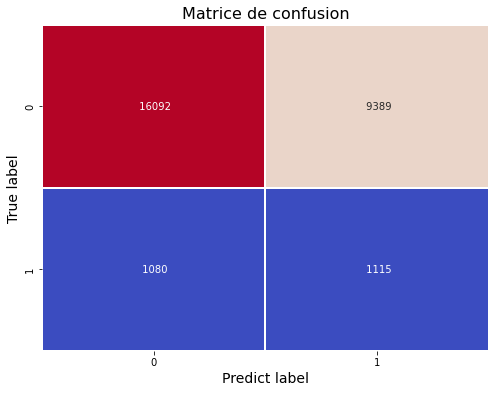

In [194]:
threshold = 0.09
y_pred_proba = model_gbc.predict_proba(X_test)[:, 1]
y_pred_gbc = np.where(y_pred_proba > threshold, 1, 0)


plt.figure(figsize = (8,6))
sns.heatmap(confusion_matrix(y_test, y_pred_gbc), annot = True ,fmt = " ", cmap = 'coolwarm', cbar = False, linewidth =1.6)
plt.ylabel("True label", fontsize = 14)
plt.xlabel("Predict label", fontsize = 14)
plt.title("Matrice de confusion", fontsize = 16)

### Commentaire: 

## <font color = 'red' >  b. Mesures de performance

In [195]:
print('Les metriques sur le training test cas random Forest Classifier:')
print("-"*75)
print(classification_report(y_test, y_pred_gbc))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_gbc,beta=10))


Les metriques sur le training test cas random Forest Classifier:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.94      0.63      0.75     25481
         1.0       0.11      0.51      0.18      2195

    accuracy                           0.62     27676
   macro avg       0.52      0.57      0.47     27676
weighted avg       0.87      0.62      0.71     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.4896219196187893


### <font color="red" id="section_5_4_5"> 5.4.5 Evaluation du score ROC_AUC ( Air sous la courbe)

In [196]:
fpr_gbc, tpr_gbc, thresholds = roc_curve(y_test, y_pred_gbc)
score_gbc =  roc_auc_score(y_test, y_pred_gbc)

In [197]:
print(score_gbc)

0.5697510199881837


In [198]:
fpr = pd.DataFrame(fpr_gbc)
tpr = pd.DataFrame(tpr_gbc)

In [199]:
fpr.columns =["Taux"]
fpr.head()

,Taux
0,0.000000
1,0.368471
2,1.000000


In [200]:
tpr.columns =["Taux"]
tpr.head()

,Taux
0,0.000000
1,0.507973
2,1.000000


In [201]:
list_fpr.append(fpr_gbc)
list_tpr.append(tpr_gbc)
list_score.append(score_gbc)

### <font color="red" > Visualisation

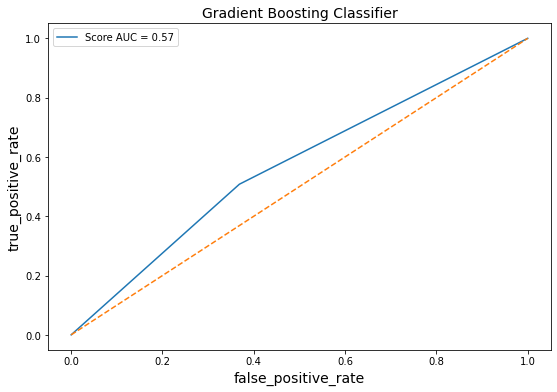

In [202]:
plt.plot(fpr['Taux'],tpr['Taux'], label = 'Score AUC = %0.2f'% score_gbc )
plt.xlabel("false_positive_rate", fontsize = 14)
plt.ylabel("true_positive_rate", fontsize = 14)
plt.plot([0,1], [0,1], linestyle ='--')
plt.title('Gradient Boosting Classifier', fontsize = 14)
plt.legend(loc = 'best')
plt.show()


## Conclusion:

Sur la courbe du score, on remarque que le model a mieux appris sur les données  test.

### <font color = 'red' id = 'section_5_4_6'> 5.4.6 Optimisation du seuil de probabilité: Threshold

In [203]:
threshold_gbc, optimal_tpr_minus_fpr, y_pred_proba_gbc = threshold_from_optimal_tpr_minus_fpr(model_gbc,
                                                                                    X_train, y_train, X_test, y_test)

#### Affichage du seuil optimale et les taux de faux et vrai posotif

In [204]:
print(" Le seuil optimal threshold correspondant au  taux TPR - FPR optimal est:", threshold_gbc)
print(" Et la valeur du point optimum (TPR - FPR) corespondante :", optimal_tpr_minus_fpr)

 Le seuil optimal threshold correspondant au  taux TPR - FPR optimal est: 0.09746242403849137
 Et la valeur du point optimum (TPR - FPR) corespondante : 0.14561243050451905


#### Affichage de la probabilté correspondante

In [205]:
#y_pred_with_threshold = (y_pred_proba >= threshold).astype(int)
y_pred_with_threshold_gbc = np.where(y_pred_proba_gbc> threshold_gbc,1,0 )
y_pred_with_threshold_gbc

array([0, 0, 0, ..., 0, 1, 0])

### <font color ='red' > a. Visualisation matrice de confusion

In [206]:
cf_matrix_gbc = confusion_matrix(y_test,y_pred_with_threshold_gbc )

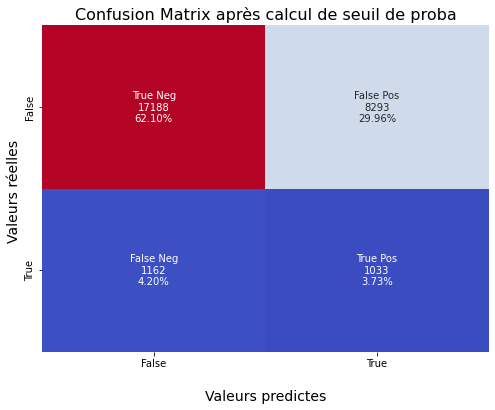

In [207]:
group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_gbc.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_gbc.flatten()/np.sum(cf_matrix_gbc)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_gbc, annot=labels, fmt='', cmap='coolwarm', cbar = False)

ax.set_title('Confusion Matrix après calcul de seuil de proba', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color ='red' > b. Les mesures de performances correspondantes

In [208]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_with_threshold_gbc))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_with_threshold_gbc,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.94      0.67      0.78     25481
         1.0       0.11      0.47      0.18      2195

    accuracy                           0.66     27676
   macro avg       0.52      0.57      0.48     27676
weighted avg       0.87      0.66      0.74     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.4559490617324954


### commentaire:

Nous alons à présent contruire une fonction qui définira que le **coût** que les clients **classés dans la mauvaise  ou bonne catégorie** peut **coûter ou rapporter** à la banque.

### <font color = 'red' id =  "section_5_4_7" > 5.4.7 Fonction de coût métier

### <font color="red" >  a. Optimisation de la fonction coût
    
#### <font color="red" > Etape 1: 
    
Dans cette $1^{iére}$ étape, nous allons stocker dans _threshold_ tous les seuils de probabilté qui permetront d'optimiser les paraméres et la **fonction coût**.

In [209]:
y_pred_proba_gbc = model_gbc.predict_proba(X_test)[:, 1]
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba_gbc)

In [210]:
df_precisions = pd.DataFrame(precisions)
df_precisions.columns = ['Values']
df_precisions.head(3)

,Values
0,0.079342
1,0.079309
2,0.079312


#### <font color="red" > Etape 2:  
  
Pour chaque valeur du seuil de probabilté, on va calculer la probabilité correspondante et les éléments de la matrice de confusion.

In [211]:
costs = []
tns = []
fps = []
fns = []
tps = []
accuracies = []
        
for threshold in tqdm(thresholds):
        y_pred_with_threshold_gbc = np.where(y_pred_proba_gbc > threshold, 1,0 )
            
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred_with_threshold_gbc).ravel()
      
        accuracies.append((tp+tn)/(tn+fp+fn+tp))
        cout = default_cost_function(tn, fp, fn, tp)
        costs.append(cout)
        tns.append(tn)
        fps.append(fp)
        fns.append(fn)
        tps.append(tp)

100%|██████████| 27665/27665 [12:55<00:00, 35.67it/s]


#### <font color="red" > Etape 3: Dataframe Fonction coût
  
Nous allons construire un dataframe sur lequel, on pourra extraire les paramétres optimaux pour la fonction coût.

In [212]:
df_cost_accu_gbc = pd.DataFrame({'precision':precisions[:-1],
                              "accuracy": accuracies,
                                'recall':recalls[:-1], 
                                'threshold':thresholds, 
                                'cost':costs,
                                'tn':tns, 
                                'fp':fps,
                                'fn':fns,
                                'tp':tps})

In [213]:
df_cost_accu_gbc.head()

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079342,0.079672,1.000000,0.003250,25480,11,25470,1,2194
1,0.079309,0.079708,0.999544,0.003276,25479,12,25469,1,2194
2,0.079312,0.079744,0.999544,0.003331,25478,13,25468,1,2194
3,0.079315,0.079780,0.999544,0.003358,25477,14,25467,1,2194
4,0.079317,0.079816,0.999544,0.003422,25476,15,25466,1,2194


#### <font color="red" > Etape 4:  Récupération  de la valeur minimale de la fonction cout

In [214]:
min_cost_gbc = df_cost_accu_gbc['cost'].min()
min_cost_gbc

19887

In [215]:
threshold_opt_cost_gbc = df_cost_accu_gbc[df_cost_accu_gbc['cost']==min_cost_gbc].iloc[0]['threshold']

In [216]:
print("Le seuil de probabilité optimal pour minimiser la fonction cout est:", threshold_opt_cost_gbc)

Le seuil de probabilité optimal pour minimiser la fonction cout est: 0.12007766814867707


#### <font color="red" > Etape 5:  Prediction des client avec ce seuil optimal

In [217]:
y_pred_thresthold_opt_gbc = np.where(y_pred_proba_gbc> threshold_opt_cost_gbc,1,0 )

##  <font color="red" > b. Matrice de confusion optimale 

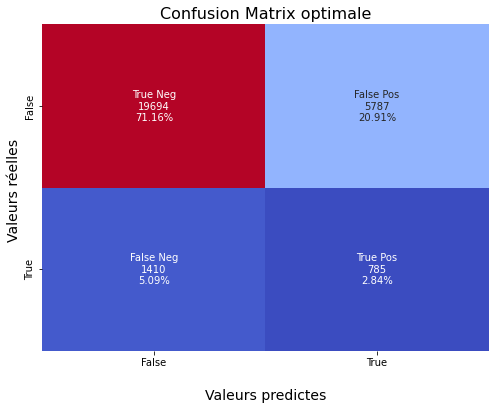

In [218]:
cf_matrix_opt_gbc = confusion_matrix(y_test, y_pred_thresthold_opt_gbc)

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_opt_gbc.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_opt_gbc.flatten()/np.sum(cf_matrix_opt_gbc)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_opt_gbc, annot=labels, fmt='', cmap='coolwarm', cbar = False)

ax.set_title('Confusion Matrix optimale', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color = 'red' > C. Les mesure de performances correspondantes

In [219]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_thresthold_opt_gbc))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_thresthold_opt_gbc,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.93      0.77      0.85     25481
         1.0       0.12      0.36      0.18      2195

    accuracy                           0.74     27676
   macro avg       0.53      0.57      0.51     27676
weighted avg       0.87      0.74      0.79     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.35070685445344835


### <font color="red" > Visualisation

In [220]:
df_cost_accu_gbc.head(2)

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079342,0.079672,1.000000,0.003250,25480,11,25470,1,2194
1,0.079309,0.079708,0.999544,0.003276,25479,12,25469,1,2194


In [221]:
df_mesure_cost = df_cost_accu_gbc[df_cost_accu_gbc["threshold"]==threshold_opt_cost_gbc][["precision","recall", 
                                                                                          "accuracy", "threshold" ]].T
df_mesure_cost.columns = ["Values"]
df_mesure_cost

,Values
precision,0.119428
recall,0.357631
accuracy,0.739955
threshold,0.120078


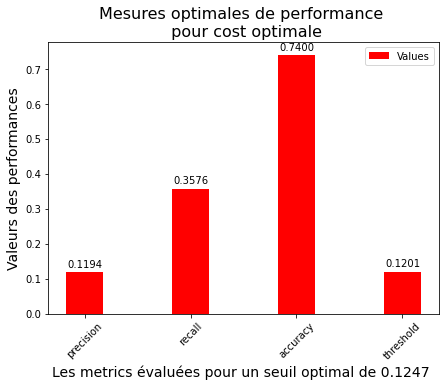

In [222]:
width = 0.35
fig, ax = plt.subplots(figsize = (7,5))
perf_values_cost = ax.bar(df_mesure_cost.index,  df_mesure_cost['Values'],
                 width, label='Values', color = 'red')
ax.set_ylabel("Valeurs des performances", fontsize = 14)
ax.set_title("Mesures optimales de performance \n pour cost optimale", fontsize = 16)

ax.tick_params(axis='x', labelrotation=45)
plt.xlabel("Les metrics évaluées pour un seuil optimal de 0.1247 ", fontsize = 14)
ax.legend()
ax.bar_label(perf_values_cost, padding=3, fmt='%.4f')
plt.draw()

#### <font color="red" > Visualisation de la fonction cout par rapport au seuil optimal

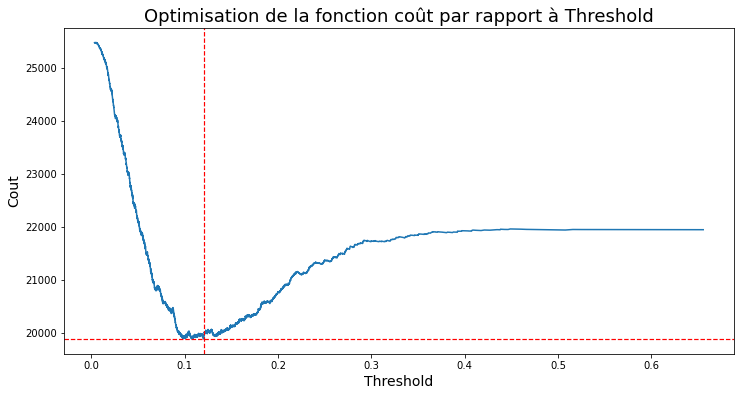

In [223]:
plt.figure(figsize = (12,6))
plt.plot(df_cost_accu_gbc["threshold"], df_cost_accu_gbc["cost"] )
plt.axvline(x = threshold_opt_cost_gbc, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.axhline(y = min_cost_gbc, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.xlabel("Threshold", fontsize = 14)
plt.ylabel("Cout", fontsize = 14)
plt.title("Optimisation de la fonction coût par rapport à Threshold", fontsize = 18)
plt.show()

### <font color="red" > Etape 8:  Evaluation du score ROC_AUC ( Air sous la courbe)

In [224]:
fpr_gbc, tpr_gbc, thresholds = roc_curve(y_test, y_pred_thresthold_opt_gbc)
score_gbc =  roc_auc_score(y_test, y_pred_thresthold_opt_gbc)

In [225]:
print(score_gbc)

0.5652602917587708


In [226]:
fpr = pd.DataFrame(fpr_gbc)
tpr = pd.DataFrame(tpr_gbc)

In [227]:
fpr.columns =["Taux"]
fpr.head()

,Taux
0,0.00000
1,0.22711
2,1.00000


In [228]:
tpr.columns =["Taux"]
tpr.head()

,Taux
0,0.000000
1,0.357631
2,1.000000


### <font color="red" > Visualisation

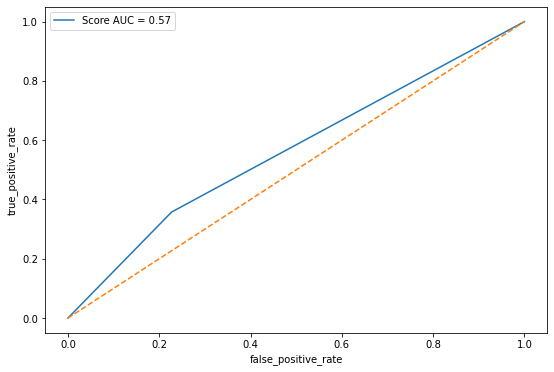

In [229]:
plt.plot(fpr['Taux'],tpr['Taux'], label = 'Score AUC = %0.2f'% score_gbc)
plt.xlabel("false_positive_rate")
plt.ylabel("true_positive_rate")
plt.plot([0,1], [0,1], linestyle ='--')
plt.legend(loc = 'best')
plt.show()


## Conclusion:

Sur la courbe du score, on remarque le model de classification est mauvais.

In [230]:
fpr_com.append(fpr_gbc)
tpr_com.append(tpr_gbc)
score_auc_com.append(score_gbc)

### <font color = 'red' id =  "section_5_4_8" > 5.4.8 Accuracy max vs Threshold
    
 On va maintenant chercher à maximiser  le **metric accuracy** en fonctio du seuil de décision **_Threshold**_ optimal.
    
 Contruire la matrice de confusion correspondante et le grahe

In [231]:
max_accuracy = df_cost_accu_gbc["accuracy"].max()
max_accuracy

0.9206894059835237

In [232]:
threshold_max_accu = df_cost_accu_gbc[df_cost_accu_gbc["accuracy"]==max_accuracy].iloc[0]["threshold"]

In [233]:
print("Le seuil de probabilté optimale pour maximiser la mesure accuracy est:", threshold_max_accu)

Le seuil de probabilté optimale pour maximiser la mesure accuracy est: 0.6555510644168947


In [234]:
y_pred_thresthold_opt_accu = np.where(y_pred_proba_gbc > threshold_max_accu,1,0 )

### <font color = 'red' > C.  Visualisation 

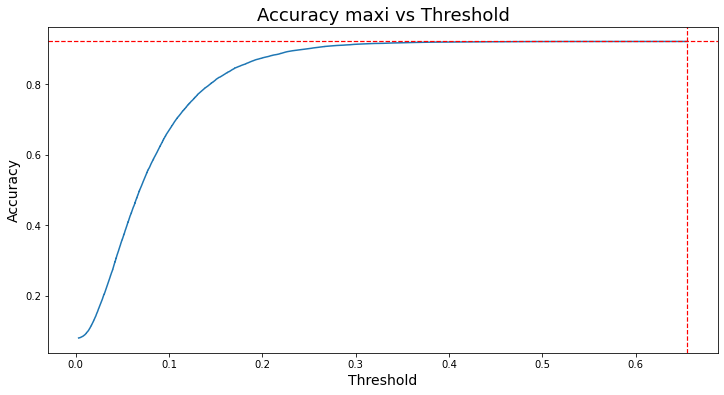

In [235]:
plt.figure(figsize = (12,6))
plt.plot(df_cost_accu_gbc["threshold"], df_cost_accu_gbc["accuracy"] )
plt.axvline(x = threshold_max_accu, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.axhline(y = max_accuracy, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.xlabel("Threshold", fontsize = 14)
plt.ylabel("Accuracy", fontsize = 14)
plt.title("Accuracy maxi vs Threshold", fontsize = 18)
plt.show()

### <font color="red" id="section_5_4_9"> 5.4.9 Features importances

In [236]:
feature_importances_values = model_gbc.named_steps['classifier'].feature_importances_

In [237]:
feature_importances_values

array([5.83869204e-02, 5.35415168e-02, 3.46292073e-02, 6.94312393e-02,
       2.02309987e-03, 4.04364627e-04, 5.33380694e-04, 4.36608787e-04,
       2.04300595e-03, 1.71482532e-03, 4.24052834e-02, 4.72405815e-02,
       1.84967656e-01, 1.41200511e-01, 5.68630962e-02, 3.14434558e-02,
       3.36411102e-02, 7.16375341e-02, 5.25497507e-03, 1.98694162e-03,
       0.00000000e+00, 6.54863441e-03, 4.22345677e-05, 5.21489897e-03,
       1.36956762e-03, 1.06891938e-06, 1.24756364e-04, 1.65541940e-02,
       1.07390545e-03, 3.60852483e-03, 9.12052642e-04, 1.74410949e-03,
       0.00000000e+00, 9.63849195e-04, 8.76767930e-06, 1.73002601e-02,
       3.08272519e-04, 2.88544896e-04, 1.46957915e-02, 1.61032141e-04,
       1.58906091e-03, 6.06612135e-04, 1.71271539e-04, 5.96166737e-04,
       6.44931865e-04, 1.47572674e-02, 1.67590836e-02, 3.33842968e-02,
       9.45864928e-03, 1.13268800e-02])

### Visualisation

In [238]:
#On calcules les inportancs des features
feature_importances_gbc = model_gbc.named_steps['classifier'].feature_importances_
#on recupere les noms des features
features_names = get_feature_names(preprocessor)

#On convertit les resulats en Series
df_feature_importance = pd.Series(feature_importances_gbc, index=features_names)
# On trie  dans l'odres decroissant
df_feature_importance= df_feature_importance.sort_values(ascending =False)
# On affiches les resulats
df_feature_importance= df_feature_importance.head(7)

In [239]:
df_feature_importance

num__AMT_REQ_CREDIT_BUREAU_YEAR    0.184968
num__DAYS_LAST_PHONE_CHANGE        0.141201
num__DAYS_ID_PUBLISH               0.071638
num__CNT_CHILDREN                  0.069431
num__CODE_GENDER                   0.058387
num__EXT_SOURCE_2                  0.056863
num__FLAG_OWN_CAR                  0.053542
dtype: float64

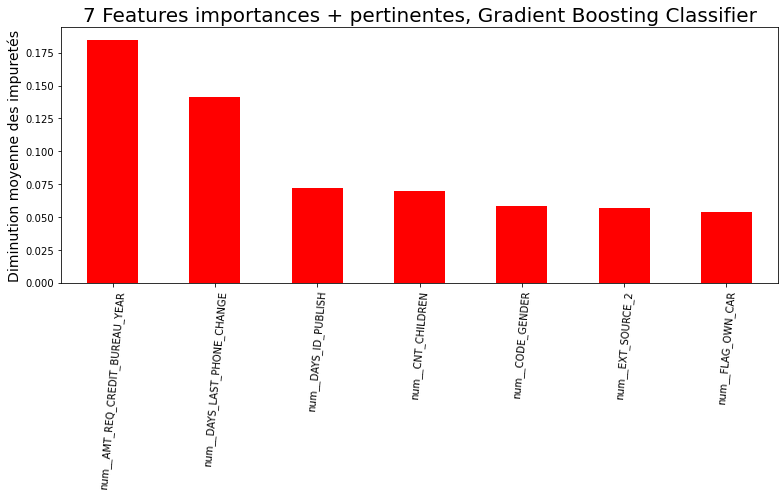

In [240]:
fig, ax = plt.subplots(figsize =(11,7))
df_feature_importance.plot.bar(ax=ax, color ='red')
ax.set_title("7 Features importances + pertinentes, Gradient Boosting Classifier", Fontsize =20)
ax.set_ylabel("Diminution moyenne des impuretés", fontsize =14)
plt.xticks(rotation =85)
fig.tight_layout()

### Commentaire: 

Ainsi, les variables qui ont plus d'impact sur la faillibilté ou non de remboursement de crédit sont:

* **AMT REQ CRDIT BUREAU YEARS** :

* **DAYS LAST PHONE CHANGE**: 

* **DAYS PUBLISH** : 

* **CNT CHILDREN** : 

### <font color="red" id="section_5_4_10"> 5.4.10 Importance des features pour un client spécifique

In [241]:
X_test_transformed = pd.DataFrame(model_gbc[0].transform(X_test),
                          columns=X_test.columns,
                          index=X_test.index)

In [242]:
X_test_transformed.head(2)

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
195935,0.719504,-0.718909,-0.669248,-0.576904,-0.289732,-0.124265,-0.229722,-0.205108,-0.547384,-0.469979,0.939833,0.918882,-0.524895,-1.442783,0.783811,-0.665920,0.758688,0.675400,0.326535,-0.326535,-0.003935,-0.553594,-0.003935,2.156200,-0.279913,-0.005565,-0.013053,-1.031530,-0.326012,-1.324967,-0.265291,2.396712,-0.003935,-0.236078,-0.023944,-0.570078,-0.186117,-0.111502,0.641601,-0.060949,0.359427,-0.196001,-0.092853,-0.127439,-0.227434,-0.139612,-0.381257,-0.636311,0.602679,0.064162
179340,0.719504,-0.718909,-0.669248,-0.576904,-0.289732,-0.124265,-0.229722,-0.205108,-0.547384,-0.469979,0.939833,0.918882,0.049004,0.492466,0.783811,0.007465,-0.486837,1.158778,-3.062459,3.062459,-0.003935,-0.553594,-0.003935,-0.463779,-0.279913,-0.005565,-0.013053,0.969434,-0.326012,0.754736,-0.265291,-0.417238,-0.003935,-0.236078,-0.023944,-0.570078,-0.186117,-0.111502,0.641601,-0.060949,0.359427,-0.196001,-0.092853,-0.127439,-0.227434,-0.024510,-0.187956,-0.040107,-0.278380,-0.251631


### Client spécifique

In [243]:
idx = X_test_transformed.index[200]
idx

156297

In [245]:
data.loc[data.index== 156297, :]

,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
156297,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,2.0,7.0,0.0,225000.0,21.0,11.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.216395,0.5,112500.0,0.05972,0.02986


In [246]:
explainer = lime_tabular.LimeTabularExplainer(
                X_test_transformed, mode='classification',
                                 feature_names=X_test_transformed.columns,
                             class_names=["0", "1"],
                        discretize_continuous=False)

exp_gbc = explainer.explain_instance(
    data_row=X_test_transformed.iloc[200], 
    predict_fn=model_gbc[-1].predict_proba
)

### Visualisation

In [247]:
exp_gbc.show_in_notebook(show_table=False)

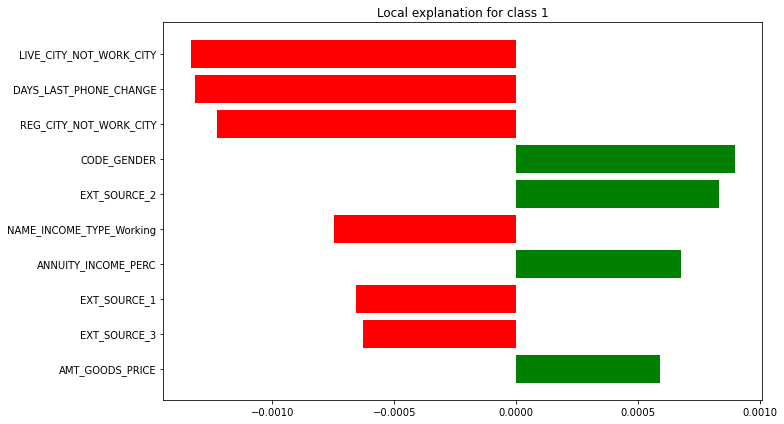

In [248]:
#exp.show_in_notebook(show_table=False)
plt.rcParams['figure.figsize'] =[11,6]
exp_gbc.as_pyplot_figure()
plt.tight_layout()

## Commentaire : 

Ce client **"156297"**  femme sera considérée comme étant **non en faillite** au regard des information sur le graphique: Ainsi :
Les variables qui jouent plus  en sa faveur sont:

*  **LIVE CITY NOT WORK CITY**

*  **DAYS LAST PHONE CHANGE**

*  **REF CITY NOT WORK CITY**

Et les variables qui jouent plus  en sa défaveur sont:

*  **EXT SOURCE 2**:

* **ANNUITY INCOM PERC**:

* **EXT SOURCE 2**:

## <font color="red" id="section_5_5"> 5.5 XGBClassifier
lien pour la documentation:
    
https://xgboost.readthedocs.io/en/stable/python/python_api.html

In [249]:
counter = Counter(Y)
weight = counter[0]/counter[1]
weight

11.607899412327457

### <font color="red" id="section_5_5_1"> 5.5.1 Optimisation des hyper params

In [250]:
param_xgb = {'classifier__learning_rate': [0.1, 0.2, 0.3], # Augmentation du taux d'apprentissage 
             'classifier__scale_pos_weight': [10, 11 ], # Équilibrage des poids positifs et négatifs.
             'classifier__n_estimators': [100,300]}, # Nombre de tours de boost.
            
pipe = Pipeline([
    ('preprocessor', preprocessor),
                    ('oversampler', oversampler),
                ('undersampler', undersampler),
    ('classifier',XGBClassifier(random_state = 5))
                ])
    
search_xgb = GridSearchCV(pipe,
                      param_xgb,
                      cv=5,
                
                      verbose =10,
                            n_jobs = 1) 

In [251]:
t0 = time.time()
xgb_model_opt = search_xgb.fit(X_train, y_train)

t1  = time.time()
print("Le temps d'éxécution est", t1-t0)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__scale_pos_weight=10
[CV 1/5; 1/12] END classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__scale_pos_weight=10;, score=0.562 total time=  20.3s
[CV 2/5; 1/12] START classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__scale_pos_weight=10
[CV 2/5; 1/12] END classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__scale_pos_weight=10;, score=0.550 total time=  17.0s
[CV 3/5; 1/12] START classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__scale_pos_weight=10
[CV 3/5; 1/12] END classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__scale_pos_weight=10;, score=0.553 total time=  20.0s
[CV 4/5; 1/12] START classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__scale_pos_weight=10
[CV 4/5; 1/12] END classifier__learning_rate=0.1

[CV 2/5; 7/12] END classifier__learning_rate=0.2, classifier__n_estimators=300, classifier__scale_pos_weight=10;, score=0.785 total time= 1.0min
[CV 3/5; 7/12] START classifier__learning_rate=0.2, classifier__n_estimators=300, classifier__scale_pos_weight=10
[CV 3/5; 7/12] END classifier__learning_rate=0.2, classifier__n_estimators=300, classifier__scale_pos_weight=10;, score=0.787 total time= 1.2min
[CV 4/5; 7/12] START classifier__learning_rate=0.2, classifier__n_estimators=300, classifier__scale_pos_weight=10
[CV 4/5; 7/12] END classifier__learning_rate=0.2, classifier__n_estimators=300, classifier__scale_pos_weight=10;, score=0.787 total time=  57.8s
[CV 5/5; 7/12] START classifier__learning_rate=0.2, classifier__n_estimators=300, classifier__scale_pos_weight=10
[CV 5/5; 7/12] END classifier__learning_rate=0.2, classifier__n_estimators=300, classifier__scale_pos_weight=10;, score=0.783 total time= 1.0min
[CV 1/5; 8/12] START classifier__learning_rate=0.2, classifier__n_estimators=3

### Affichage des résultats

In [252]:
print("Best parameter (CV score=%0.3f):" % search_xgb.best_score_)
print(search_xgb.best_params_)

Best parameter (CV score=0.816):
{'classifier__learning_rate': 0.3, 'classifier__n_estimators': 300, 'classifier__scale_pos_weight': 10}


In [253]:
df_result_gbc = pd.DataFrame.from_dict(xgb_model_opt.cv_results_).sort_values(by = ["rank_test_score"], ascending = True)
df_result_gbc.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__learning_rate,param_classifier__n_estimators,param_classifier__scale_pos_weight,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
10,59.218894,3.822865,0.123718,0.032110,0.3,300,10,"{'classifier__learning_rate': 0.3, 'classifier...",0.819139,0.814866,0.812311,0.821525,0.809756,0.815520,0.004315,1
11,59.513351,5.063234,0.151192,0.122899,0.3,300,11,"{'classifier__learning_rate': 0.3, 'classifier...",0.807835,0.804181,0.801239,0.812079,0.798839,0.804835,0.004707,2
6,62.018774,6.065799,0.164144,0.101602,0.2,300,10,"{'classifier__learning_rate': 0.2, 'classifier...",0.783447,0.784592,0.786682,0.786682,0.783120,0.784905,0.001531,3


In [254]:
np.mean(df_result_gbc[df_result_gbc.rank_test_score == 1]["mean_test_score"])

0.8155196416716632

In [255]:
np.mean(df_result_gbc[df_result_gbc.rank_test_score == 1]["std_test_score"])

0.004315264966306023

#### Commentaire: 

### <font color="red" id="section_5_5_2"> 5.5.2 Entrainement du model

In [257]:
t0 = time.time()
model_xgb = Pipeline(steps = [
                ("preprocessor",  preprocessor),
                    ('oversampler', oversampler),
                ('undersampler', undersampler),
                ('classifier' , XGBClassifier(n_estimators = 300, 
                                                       scale_pos_weight = 10,
                                                       learning_rate =0.3,
                                                       random_state =5)) 
                        ])

model_xgb.fit(X_train, y_train)
t1 =time.time()
print("le temps d'éxécution est:", t1 -t0)

le temps d'éxécution est: 78.34085702896118


### <font color="red" id="section_5_5_3"> 5.5.3 Prediction

In [258]:
y_pred_proba_xgb = model_xgb.predict_proba(X_test)[:,1]

In [259]:
np.unique(y_pred_proba_xgb)

array([3.9169521e-05, 4.5380468e-05, 4.5915902e-05, ..., 9.4925445e-01,
       9.5220566e-01, 9.5766652e-01], dtype=float32)

###  <font color= "red"  id= "section_5_5_4">   5.5.4 Matrice de confusion et les mesures  de performances    

### <font color = 'red' >  a. Matrice de confusion

#### Explication du threshold :
    
Le seuil de décision est une valeur que nous fixons et qui va limiter qu’une valeur
appartient à la classe 0 ou à la classe 1.

Text(0.5, 1.0, 'Matrice de confusion')

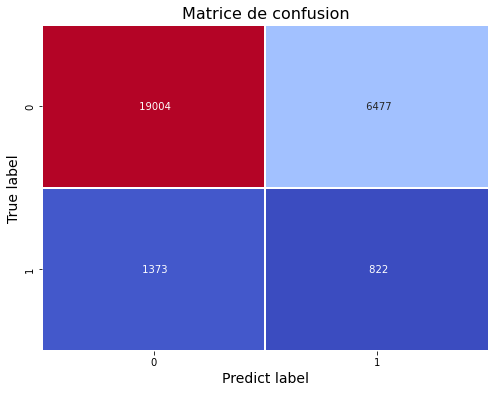

In [260]:
threshold = 0.4
y_pred_proba = model_xgb.predict_proba(X_test)[:, 1]
y_pred_xgb = np.where(y_pred_proba > threshold, 1, 0)


plt.figure(figsize = (8,6))
sns.heatmap(confusion_matrix(y_test, y_pred_xgb), annot = True ,fmt = " ", cmap = 'coolwarm', cbar = False,
            linewidth = 1.6)
plt.ylabel("True label", fontsize = 14)
plt.xlabel("Predict label", fontsize = 14)
plt.title("Matrice de confusion", fontsize = 16)

### Commentaire: 

## <font color = 'red' >  b. Mesures de performance

In [261]:
print('Les metriques sur le training test cas random Forest Classifier:')
print("-"*75)
print(classification_report(y_test, y_pred_xgb))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_xgb,beta=10))


Les metriques sur le training test cas random Forest Classifier:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.93      0.75      0.83     25481
         1.0       0.11      0.37      0.17      2195

    accuracy                           0.72     27676
   macro avg       0.52      0.56      0.50     27676
weighted avg       0.87      0.72      0.78     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.3660598150785497


### <font color="red" id="section_5_5_5"> 5.5.5 Evaluation du score ROC_AUC ( Air sous la courbe)

In [262]:
fpr_xgb, tpr_xgb, thresholds = roc_curve(y_test, y_pred_xgb)
score_xgb =  roc_auc_score(y_test, y_pred_xgb)

In [263]:
print(score_xgb)

0.5601490377528158


In [264]:
fpr = pd.DataFrame(fpr_xgb)
tpr = pd.DataFrame(tpr_xgb)

In [265]:
fpr.columns =["Taux"]
fpr.head()

,Taux
0,0.000000
1,0.254189
2,1.000000


In [266]:
tpr.columns =["Taux"]
tpr.head()

,Taux
0,0.000000
1,0.374487
2,1.000000


In [267]:
list_fpr.append(fpr_gbc)
list_tpr.append(tpr_gbc)
list_score.append(score_gbc)

### <font color="red" > Visualisation

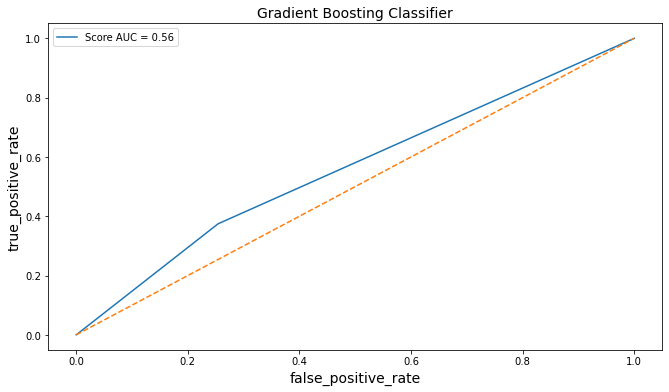

In [268]:
plt.plot(fpr['Taux'],tpr['Taux'], label = 'Score AUC = %0.2f'% score_xgb )
plt.xlabel("false_positive_rate", fontsize = 14)
plt.ylabel("true_positive_rate", fontsize = 14)
plt.plot([0,1], [0,1], linestyle ='--')
plt.title('Gradient Boosting Classifier', fontsize = 14)
plt.legend(loc = 'best')
plt.show()


## Conclusion:

Sur la courbe du score, on remarque que le model a mieux appris sur les données  test.

### <font color = 'red' id = 'section_5_5_6'> 5.5.6 Optimisation du seuil de probabilité: Threshold

In [269]:
threshold_xgb, optimal_tpr_minus_fpr, y_pred_proba_xgb = threshold_from_optimal_tpr_minus_fpr(model_xgb,
                                                                                    X_train, y_train, X_test, y_test)

#### Affichage du seuil optimale et les taux de faux et vrai posotif

In [270]:
print(" Le seuil optimal threshold correspondant au  taux TPR - FPR optimal est:", threshold_xgb)
print(" Et la valeur du point optimum (TPR - FPR) corespondante :", optimal_tpr_minus_fpr)

 Le seuil optimal threshold correspondant au  taux TPR - FPR optimal est: 0.27116585
 Et la valeur du point optimum (TPR - FPR) corespondante : 0.13021783437907508


#### Affichage de la probabilté correspondante

In [271]:
#y_pred_with_threshold = (y_pred_proba >= threshold).astype(int)
y_pred_with_threshold_xgb = np.where(y_pred_proba_xgb> threshold_xgb,1,0 )
y_pred_with_threshold_xgb

array([0, 0, 0, ..., 0, 1, 0])

### <font color ='red' > a. Visualisation matrice de confusion

In [272]:
cf_matrix_xgb = confusion_matrix(y_test,y_pred_with_threshold_xgb )

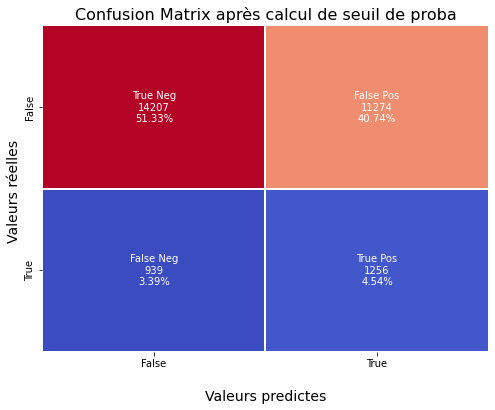

In [273]:
group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_xgb.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_xgb.flatten()/np.sum(cf_matrix_xgb)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_xgb, annot=labels, fmt='', cmap='coolwarm', cbar = False, linewidth =1.6)

ax.set_title('Confusion Matrix après calcul de seuil de proba', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color ='red' > b. Les mesures de performances correspondantes

In [274]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_with_threshold_xgb))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_with_threshold_xgb,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.94      0.56      0.70     25481
         1.0       0.10      0.57      0.17      2195

    accuracy                           0.56     27676
   macro avg       0.52      0.56      0.43     27676
weighted avg       0.87      0.56      0.66     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.5467224065853554


### commentaire:

Nous alons à présent contruire une fonction qui définira que le **coût** que les clients **classés dans la mauvaise  ou bonne catégorie** peut **coûter ou rapporter** à la banque.

## <font color = 'red' id =  "section_5_5_7" > 5.5.7 Fonction de coût métier

### <font color="red" >  a. Optimisation de la fonction coût
    
#### <font color="red" > Etape 1: 
    
Dans cette $1^{iére}$ étape, nous allons stocker dans _threshold_ tous les seuils de probabilté qui permetront d'optimiser les paraméres et la **fonction coût**.

In [275]:
y_pred_proba_xgb = model_xgb.predict_proba(X_test)[:, 1]
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba_xgb)

In [276]:
df_precisions = pd.DataFrame(precisions)
df_precisions.columns = ['Values']
df_precisions.head(3)

,Values
0,0.079339
1,0.079306
2,0.079309


#### <font color="red" > Etape 2:  
  
Pour chaque valeur du seuil de probabilté, on va calculer la probabilité correspondante et les éléments de la matrice de confusion.

In [277]:
costs = []
tns = []
fps = []
fns = []
tps = []
accuracies = []
        
for threshold in tqdm(thresholds):
        y_pred_with_threshold_xgb = np.where(y_pred_proba_xgb > threshold, 1,0 )
            
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred_with_threshold_xgb).ravel()
      
        accuracies.append((tp+tn)/(tn+fp+fn+tp))
        cout = default_cost_function(tn, fp, fn, tp)
        costs.append(cout)
        tns.append(tn)
        fps.append(fp)
        fns.append(fn)
        tps.append(tp)

100%|██████████| 27652/27652 [17:31<00:00, 26.30it/s]


#### <font color="red" > Etape 3: Dataframe Fonction coût
  
Nous allons construire un dataframe sur lequel, on pourra extraire les paramétres optimaux pour la fonction coût.

In [278]:
df_cost_accu_xgb = pd.DataFrame({'precision':precisions[:-1],
                              "accuracy": accuracies,
                                'recall':recalls[:-1], 
                                'threshold':thresholds, 
                                'cost':costs,
                                'tn':tns, 
                                'fp':fps,
                                'fn':fns,
                                'tp':tps})

In [279]:
df_cost_accu_xgb.head()

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079339,0.079636,1.000000,0.000107,25481,10,25471,1,2194
1,0.079306,0.079672,0.999544,0.000109,25480,11,25470,1,2194
2,0.079309,0.079708,0.999544,0.000122,25479,12,25469,1,2194
3,0.079312,0.079744,0.999544,0.000131,25478,13,25468,1,2194
4,0.079315,0.079780,0.999544,0.000134,25477,14,25467,1,2194


#### <font color="red" > Etape 4:  Récupération  de la valeur minimale de la fonction cout

In [280]:
min_cost_xgb = df_cost_accu_xgb['cost'].min()
min_cost_xgb

20144

In [281]:
threshold_opt_cost_xgb = df_cost_accu_xgb[df_cost_accu_xgb['cost']==min_cost_xgb].iloc[0]['threshold']

In [282]:
print("Le seuil de probabilité optimal pour minimiser la fonction cout est:", threshold_opt_cost_xgb)

Le seuil de probabilité optimal pour minimiser la fonction cout est: 0.40783068537712097


#### <font color="red" > Etape 5:  Prediction des client avec ce seuil optimal

In [283]:
y_pred_thresthold_opt_xgb = np.where(y_pred_proba_xgb> threshold_opt_cost_xgb,1,0 )

##  <font color="red" > b. Matrice de confusion optimale 

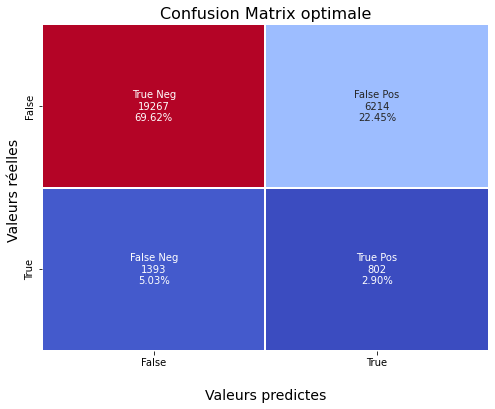

In [284]:
cf_matrix_opt_xgb = confusion_matrix(y_test, y_pred_thresthold_opt_xgb)

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_opt_xgb.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_opt_xgb.flatten()/np.sum(cf_matrix_opt_xgb)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_opt_xgb, annot=labels, fmt='', cmap='coolwarm', cbar = False, linewidth =1.6)

ax.set_title('Confusion Matrix optimale', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color = 'red' > C. Les mesure de performances correspondantes

In [285]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_thresthold_opt_xgb))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_thresthold_opt_xgb,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.93      0.76      0.84     25481
         1.0       0.11      0.37      0.17      2195

    accuracy                           0.73     27676
   macro avg       0.52      0.56      0.50     27676
weighted avg       0.87      0.73      0.78     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.3575994631725794


### <font color="red" > Visualisation

In [286]:
df_cost_accu_xgb.head(2)

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079339,0.079636,1.000000,0.000107,25481,10,25471,1,2194
1,0.079306,0.079672,0.999544,0.000109,25480,11,25470,1,2194


In [287]:
df_mesure_cost = df_cost_accu_xgb[df_cost_accu_xgb["threshold"]==threshold_opt_cost_xgb][["precision","recall", 
                                                                                          "accuracy", "threshold" ]].T
df_mesure_cost.columns = ["Values"]
df_mesure_cost

,Values
precision,0.114294
recall,0.365376
accuracy,0.725141
threshold,0.407831


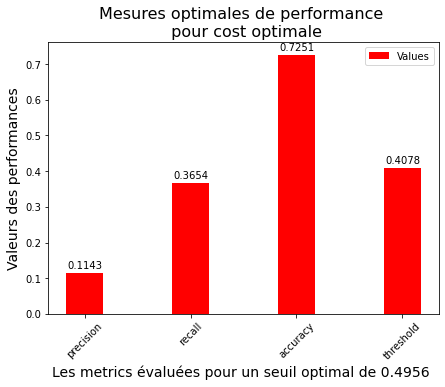

In [288]:
width = 0.35
fig, ax = plt.subplots(figsize = (7,5))
perf_values_cost = ax.bar(df_mesure_cost.index,  df_mesure_cost['Values'],
                 width, label='Values', color = 'red')
ax.set_ylabel("Valeurs des performances", fontsize = 14)
ax.set_title("Mesures optimales de performance \n pour cost optimale", fontsize = 16)

ax.tick_params(axis='x', labelrotation=45)
plt.xlabel("Les metrics évaluées pour un seuil optimal de 0.4956 ", fontsize = 14)
ax.legend()
ax.bar_label(perf_values_cost, padding=3, fmt='%.4f')
plt.draw()

#### <font color="red" > Visualisation de la fonction cout par rapport au seuil optimal

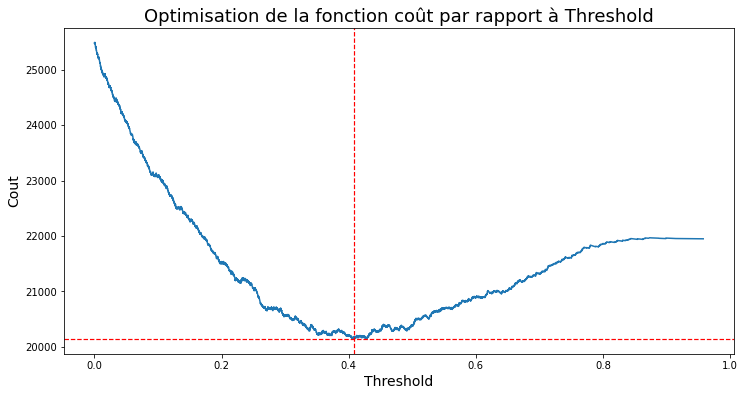

In [289]:
plt.figure(figsize = (12,6))
plt.plot(df_cost_accu_xgb["threshold"], df_cost_accu_xgb["cost"] )
plt.axvline(x = threshold_opt_cost_xgb, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.axhline(y = min_cost_xgb, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.xlabel("Threshold", fontsize = 14)
plt.ylabel("Cout", fontsize = 14)
plt.title("Optimisation de la fonction coût par rapport à Threshold", fontsize = 18)
plt.show()

### <font color="red" > Etape 8:  Evaluation du score ROC_AUC ( Air sous la courbe)

In [290]:
fpr_xgb, tpr_xgb, thresholds = roc_curve(y_test, y_pred_thresthold_opt_xgb)
score_xgb =  roc_auc_score(y_test, y_pred_thresthold_opt_xgb)

In [291]:
print(score_xgb)

0.5607539370752731


In [292]:
fpr = pd.DataFrame(fpr_xgb)
tpr = pd.DataFrame(tpr_xgb)

In [293]:
fpr.columns =["Taux"]
fpr.head()

,Taux
0,0.000000
1,0.243868
2,1.000000


In [294]:
tpr.columns =["Taux"]
tpr.head()

,Taux
0,0.000000
1,0.365376
2,1.000000


### <font color="red" > Visualisation

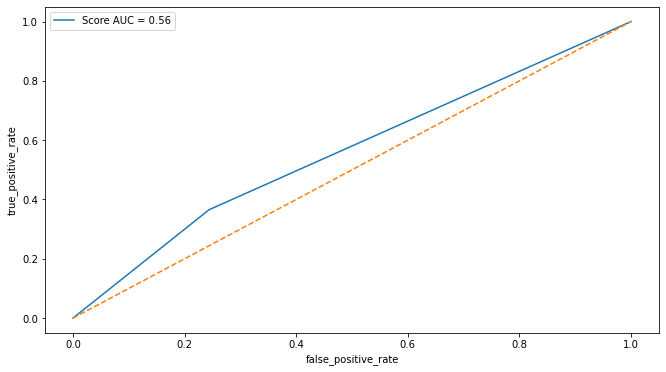

In [295]:
plt.plot(fpr['Taux'],tpr['Taux'], label = 'Score AUC = %0.2f'% score_xgb)
plt.xlabel("false_positive_rate")
plt.ylabel("true_positive_rate")
plt.plot([0,1], [0,1], linestyle ='--')
plt.legend(loc = 'best')
plt.show()


## Conclusion:

Sur la courbe du score, on remarque le model de classification est mauvais.

In [296]:
fpr_com.append(fpr_xgb)
tpr_com.append(tpr_xgb)
score_auc_com.append(score_xgb)

### <font color = 'red' id =  "section_5_5_8" > 5.5.8 Precision max vs Threshold
    
 On va maintenant chercher à maximiser  le **metric precision** en fonction du seuil de décision **_Threshold**_ optimal.
    
 Contruire la matrice de confusion correspondante et le grahe.

In [297]:
max_precision = df_cost_accu_xgb["precision"].max()
max_precision

0.16829268292682928

In [298]:
threshold_max_prec = df_cost_accu_xgb[df_cost_accu_xgb["precision"]==max_precision].iloc[0]["threshold"]

In [299]:
print("Le seuil de probabilté optimale pour maximiser la mesure accuracy est:", threshold_max_prec)

Le seuil de probabilté optimale pour maximiser la mesure accuracy est: 0.7502557635307312


In [300]:
y_pred_thresthold_opt_prec= np.where(y_pred_proba_xgb > threshold_max_prec,1,0 )

### <font color = 'red' > C.  Visualisation 

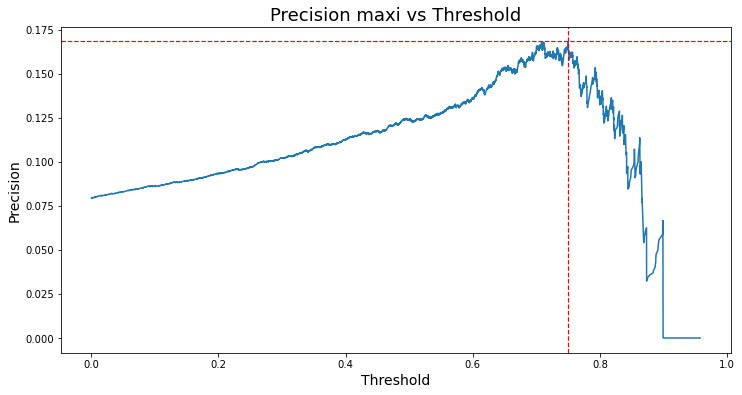

In [301]:
plt.figure(figsize = (12,6))
plt.plot(df_cost_accu_xgb["threshold"], df_cost_accu_xgb["precision"] )
plt.axvline(x = threshold_max_prec, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.axhline(y = max_precision, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.xlabel("Threshold", fontsize = 14)
plt.ylabel("Precision", fontsize = 14)
plt.title("Precision maxi vs Threshold", fontsize = 18)
plt.show()

##  <font color="red" > b. Matrice de confusion vs precision maximale

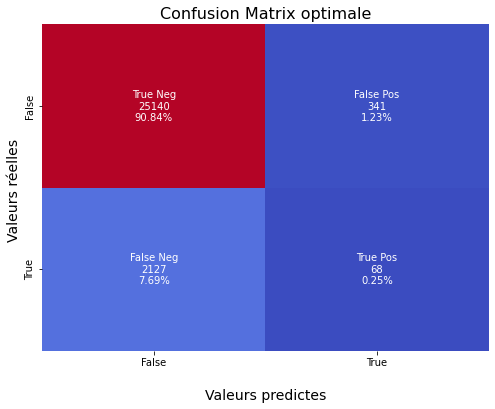

In [302]:
cf_matrix_opt_xgb = confusion_matrix(y_test, y_pred_thresthold_opt_prec)

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_opt_xgb.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_opt_xgb.flatten()/np.sum(cf_matrix_opt_xgb)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_opt_xgb, annot=labels, fmt='', cmap='coolwarm', cbar = False)

ax.set_title('Confusion Matrix optimale', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color = 'red' > C. Les mesure de performances correspondantes

In [303]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_thresthold_opt_prec))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_thresthold_opt_prec,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.92      0.99      0.95     25481
         1.0       0.17      0.03      0.05      2195

    accuracy                           0.91     27676
   macro avg       0.54      0.51      0.50     27676
weighted avg       0.86      0.91      0.88     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.031231100136874794


### <font color="red" > Visualisation

In [304]:
df_cost_accu_xgb.head(2)

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079339,0.079636,1.000000,0.000107,25481,10,25471,1,2194
1,0.079306,0.079672,0.999544,0.000109,25480,11,25470,1,2194


In [305]:
df_mesure_cost = df_cost_accu_xgb[df_cost_accu_xgb["threshold"]==threshold_max_prec][["precision","recall", 
                                                                                          "accuracy", "threshold" ]].T
df_mesure_cost.columns = ["Values"]
df_mesure_cost

,Values
precision,0.168293
recall,0.031435
accuracy,0.910825
threshold,0.750256


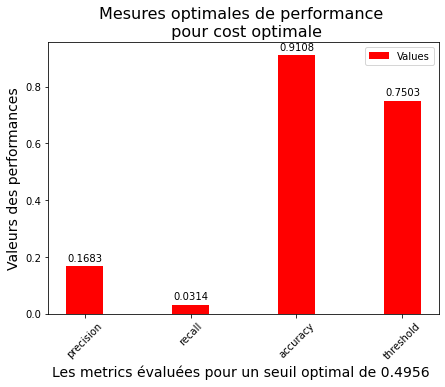

In [306]:
width = 0.35
fig, ax = plt.subplots(figsize = (7,5))
perf_values_cost = ax.bar(df_mesure_cost.index,  df_mesure_cost['Values'],
                 width, label='Values', color = 'red')
ax.set_ylabel("Valeurs des performances", fontsize = 14)
ax.set_title("Mesures optimales de performance \n pour cost optimale", fontsize = 16)

ax.tick_params(axis='x', labelrotation=45)
plt.xlabel("Les metrics évaluées pour un seuil optimal de 0.4956 ", fontsize = 14)
ax.legend()
ax.bar_label(perf_values_cost, padding=3, fmt='%.4f')
plt.draw()

### <font color="red" id="section_5_5_9"> 5.5.9 Features importances

In [307]:
feature_importances_values = model_xgb.named_steps['classifier'].feature_importances_

In [308]:
feature_importances_values

array([0.06827737, 0.05612116, 0.04667275, 0.0612268 , 0.00981095,
       0.00625909, 0.00821376, 0.00753817, 0.00939761, 0.00740138,
       0.05245202, 0.05439034, 0.10723399, 0.08740269, 0.05303609,
       0.00940451, 0.01046606, 0.03744834, 0.03315633, 0.        ,
       0.        , 0.01330145, 0.        , 0.00686957, 0.00838436,
       0.        , 0.0048431 , 0.04588798, 0.00720797, 0.007664  ,
       0.00579368, 0.00844072, 0.        , 0.00758402, 0.00420276,
       0.03926224, 0.00608688, 0.00630588, 0.02172673, 0.00692477,
       0.00714699, 0.00740532, 0.00732399, 0.00664436, 0.00590916,
       0.00722678, 0.00778364, 0.00975878, 0.00708578, 0.00731971],
      dtype=float32)

### Visualisation

In [309]:
#On calcules les inportancs des features
feature_importances_xgb = model_xgb.named_steps['classifier'].feature_importances_
#on recupere les noms des features
features_names = get_feature_names(preprocessor)

#On convertit les resulats en Series
df_feature_importance = pd.Series(feature_importances_xgb, index=features_names)
# On trie  dans l'odres decroissant
df_feature_importance= df_feature_importance.sort_values(ascending =False)
# On affiches les resulats
df_feature_importance= df_feature_importance.head(7)

In [310]:
df_feature_importance

num__AMT_REQ_CREDIT_BUREAU_YEAR    0.107234
num__DAYS_LAST_PHONE_CHANGE        0.087403
num__CODE_GENDER                   0.068277
num__CNT_CHILDREN                  0.061227
num__FLAG_OWN_CAR                  0.056121
num__EXT_SOURCE_3                  0.054390
num__EXT_SOURCE_2                  0.053036
dtype: float32

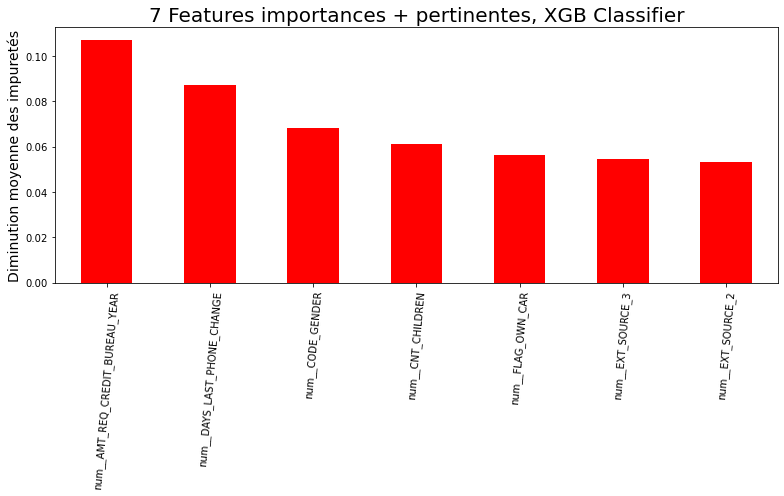

In [311]:
fig, ax = plt.subplots(figsize =(11,7))
df_feature_importance.plot.bar(ax=ax, color ='red')
ax.set_title("7 Features importances + pertinentes, XGB Classifier", Fontsize =20)
ax.set_ylabel("Diminution moyenne des impuretés", fontsize =14)
plt.xticks(rotation =85)
fig.tight_layout()

### Commentaire: 

Ainsi, les variables qui ont plus d'impact sur la faillibilté ou non de remboursement de crédit sont:

* **AMT REQ CRDIT BUREAU YEARS**:

* **CODE GENDER** :

* **DAYS LAST PHONE CHANGE** : 

* **CNT CHILDREN** : Le nombre d'enfants en charge

### <font color="red" id="section_5_5_10"> 5.5.10 Importance des features pour un client spécifique

In [312]:
X_test_transformed = pd.DataFrame(model_xgb[0].transform(X_test),
                          columns=X_test.columns,
                          index=X_test.index)

In [313]:
X_test_transformed.head(2)

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
195935,0.719504,-0.718909,-0.669248,-0.576904,-0.289732,-0.124265,-0.229722,-0.205108,-0.547384,-0.469979,0.939833,0.918882,-0.524895,-1.442783,0.783811,-0.665920,0.758688,0.675400,0.326535,-0.326535,-0.003935,-0.553594,-0.003935,2.156200,-0.279913,-0.005565,-0.013053,-1.031530,-0.326012,-1.324967,-0.265291,2.396712,-0.003935,-0.236078,-0.023944,-0.570078,-0.186117,-0.111502,0.641601,-0.060949,0.359427,-0.196001,-0.092853,-0.127439,-0.227434,-0.139612,-0.381257,-0.636311,0.602679,0.064162
179340,0.719504,-0.718909,-0.669248,-0.576904,-0.289732,-0.124265,-0.229722,-0.205108,-0.547384,-0.469979,0.939833,0.918882,0.049004,0.492466,0.783811,0.007465,-0.486837,1.158778,-3.062459,3.062459,-0.003935,-0.553594,-0.003935,-0.463779,-0.279913,-0.005565,-0.013053,0.969434,-0.326012,0.754736,-0.265291,-0.417238,-0.003935,-0.236078,-0.023944,-0.570078,-0.186117,-0.111502,0.641601,-0.060949,0.359427,-0.196001,-0.092853,-0.127439,-0.227434,-0.024510,-0.187956,-0.040107,-0.278380,-0.251631


### Client spécifique

In [314]:
idx = X_test_transformed.index[200]
idx

156297

In [316]:
data.loc[data.index== 156297, :]

,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
156297,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,2.0,7.0,0.0,225000.0,21.0,11.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.216395,0.5,112500.0,0.05972,0.02986


In [317]:
explainer = lime_tabular.LimeTabularExplainer(
                X_test_transformed, mode='classification',
                                 feature_names=X_test_transformed.columns,
                             class_names=["0", "1"],
                        discretize_continuous=False)

exp_xgb = explainer.explain_instance(
    data_row=X_test_transformed.iloc[200], 
    predict_fn=model_xgb[-1].predict_proba
)

### Visualisation

In [318]:
exp_xgb.show_in_notebook(show_table=True)

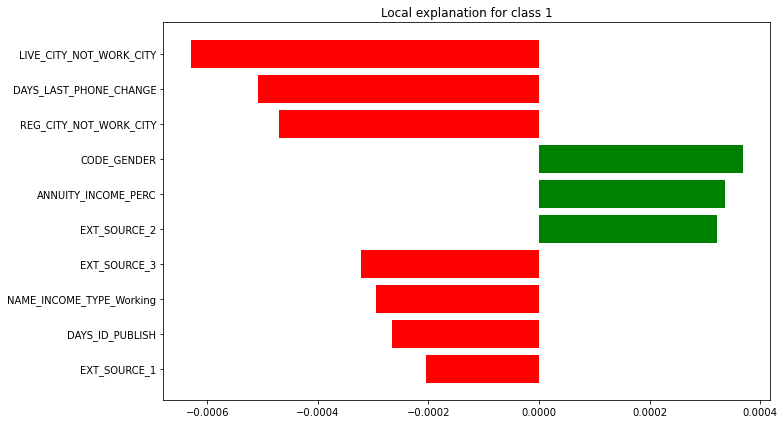

In [319]:
#exp.show_in_notebook(show_table=False)
plt.rcParams['figure.figsize'] =[11,6]
exp_xgb.as_pyplot_figure()
plt.tight_layout()

## Commentaire : 

Ce client **"156297"** sera considéré comme étant **en faillite** au regard des information sur le graghique: Ainsi :

Les variables qui jouent plus  en sa défaveur sont:

* **CODE GENDER**

* **ANNUITY INCOME PERC**

* **EXT_SOURCE_2**

Et les variables qui jouent plus  en sa faveur sont:

*  **LIVE CITY NOT WORK CITY**: Travaille hors de sa ville d'habitation

* **DAYS LAST PHONE CHANGE:

* **REG REGION NOT LIVE REGION** : Habite dans une region différente.


## <font color="red" id="section_5_6"> 5.6 LGBMClassifier
lien pour la documentation:
    
https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMClassifier.html

### <font color="red" id="section_5_6_1"> 5.6.1 Optimisation des hyper params

In [320]:
param_lgbm = {'classifier__learning_rate': [0.1, 0.01, 0.05], # Augmentation du taux d'apprentissage 
             'classifier__num_leaves': [29, 35 ], # Équilibrage des poids positifs et négatifs.
             'classifier__n_estimators': [100,300]}, # Nombre de tours de boost.
            
pipe = Pipeline([
    ('preprocessor', preprocessor),
                    ('oversampler', oversampler),
                ('undersampler', undersampler),
    ('classifier',LGBMClassifier(max_depth =8, random_state = 5))
                ])
    
search_lgbm = GridSearchCV(pipe,
                      param_lgbm,
                      cv=5,
                
                      verbose =10,
                            n_jobs = 1) 

In [321]:
t0 = time.time()
lgbm_model_opt = search_lgbm.fit(X_train, y_train)

t1  = time.time()
print("Le temps d'éxécution est", t1-t0)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__num_leaves=29
[CV 1/5; 1/12] END classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__num_leaves=29;, score=0.921 total time=   5.4s
[CV 2/5; 1/12] START classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__num_leaves=29
[CV 2/5; 1/12] END classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__num_leaves=29;, score=0.921 total time=   4.9s
[CV 3/5; 1/12] START classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__num_leaves=29
[CV 3/5; 1/12] END classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__num_leaves=29;, score=0.921 total time=   3.1s
[CV 4/5; 1/12] START classifier__learning_rate=0.1, classifier__n_estimators=100, classifier__num_leaves=29
[CV 4/5; 1/12] END classifier__learning_rate=0.1, classifier__n_estimators=100, classifier

[CV 4/5; 7/12] END classifier__learning_rate=0.01, classifier__n_estimators=300, classifier__num_leaves=29;, score=0.921 total time=   4.5s
[CV 5/5; 7/12] START classifier__learning_rate=0.01, classifier__n_estimators=300, classifier__num_leaves=29
[CV 5/5; 7/12] END classifier__learning_rate=0.01, classifier__n_estimators=300, classifier__num_leaves=29;, score=0.921 total time=   4.9s
[CV 1/5; 8/12] START classifier__learning_rate=0.01, classifier__n_estimators=300, classifier__num_leaves=35
[CV 1/5; 8/12] END classifier__learning_rate=0.01, classifier__n_estimators=300, classifier__num_leaves=35;, score=0.921 total time=   4.9s
[CV 2/5; 8/12] START classifier__learning_rate=0.01, classifier__n_estimators=300, classifier__num_leaves=35
[CV 2/5; 8/12] END classifier__learning_rate=0.01, classifier__n_estimators=300, classifier__num_leaves=35;, score=0.921 total time=   5.1s
[CV 3/5; 8/12] START classifier__learning_rate=0.01, classifier__n_estimators=300, classifier__num_leaves=35
[CV 

### Affichage des résultats

In [322]:
print("Best parameter (CV score=%0.3f):" % search_lgbm.best_score_)
print(search_lgbm.best_params_)

Best parameter (CV score=0.921):
{'classifier__learning_rate': 0.1, 'classifier__n_estimators': 100, 'classifier__num_leaves': 29}


In [323]:
df_result_lgbm = pd.DataFrame.from_dict(lgbm_model_opt.cv_results_).sort_values(by = ["rank_test_score"], ascending = True)
df_result_lgbm.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__learning_rate,param_classifier__n_estimators,param_classifier__num_leaves,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,3.940517,0.967932,0.112533,0.034809,0.1,100,29,"{'classifier__learning_rate': 0.1, 'classifier...",0.920641,0.920712,0.920712,0.920712,0.920712,0.920698,0.000029,1
1,2.720233,0.259637,0.068770,0.007658,0.1,100,35,"{'classifier__learning_rate': 0.1, 'classifier...",0.920641,0.920712,0.920712,0.920712,0.920635,0.920683,0.000036,2
4,2.683602,0.148660,0.090715,0.028727,0.01,100,29,"{'classifier__learning_rate': 0.01, 'classifie...",0.920641,0.920712,0.920712,0.920712,0.920635,0.920683,0.000036,2


In [324]:
np.mean(df_result_lgbm[df_result_lgbm.rank_test_score == 1]["mean_test_score"])

0.9206980930535756

In [325]:
np.mean(df_result_lgbm[df_result_lgbm.rank_test_score == 1]["std_test_score"])

2.8513854133827014e-05

#### Commentaire: 

### <font color="red" id="section_5_6_2"> 5.6.2 Entrainement du model

In [326]:
t0 = time.time()
model_lgbm = Pipeline(steps = [
                ("preprocessor",  preprocessor),
                    ('oversampler', oversampler),
                ('undersampler', undersampler),
                ('classifier' , LGBMClassifier(n_estimators = 100, 
                                                       num_leaves = 29,
                                                       max_depth =8,
                                                       learning_rate =0.1,
                                                       random_state =5)) 
                        ])

model_lgbm.fit(X_train, y_train)
t1 =time.time()
print("le temps d'éxécution est:", t1 -t0)

le temps d'éxécution est: 5.896620035171509


### <font color="red" id="section_5_6_3"> 5.6.3 Prediction

In [327]:
y_pred_proba_lgbm = model_lgbm.predict_proba(X_test)[:,1]

In [328]:
np.unique(y_pred_proba_lgbm)

array([0.01057567, 0.01180834, 0.01326221, ..., 0.40435082, 0.40918161,
       0.48741246])

###  <font color= "red"  id= "section_5_6_4">   5.6.4 Matrice de confusion et les mesures  de performances    

### <font color = 'red' >  a. Matrice de confusion

#### Explication du threshold :
    
Le seuil de décision est une valeur que nous fixons et qui va limiter qu’une valeur
appartient à la classe 0 ou à la classe 1.

Text(0.5, 1.0, 'Matrice de confusion')

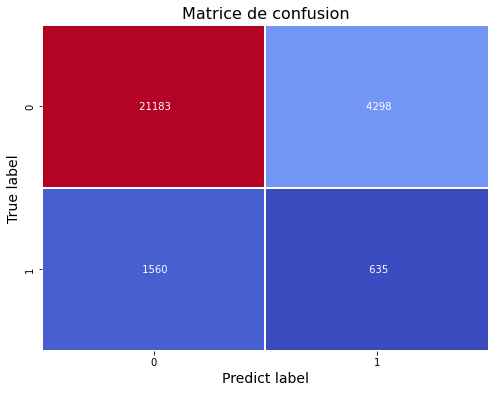

In [329]:
threshold = 0.15
y_pred_proba = model_lgbm.predict_proba(X_test)[:, 1]
y_pred_lgbm = np.where(y_pred_proba > threshold, 1, 0)


plt.figure(figsize = (8,6))
sns.heatmap(confusion_matrix(y_test, y_pred_lgbm), annot = True ,fmt = " ", cmap = 'coolwarm', cbar = False,
            linewidth = 1.6)
plt.ylabel("True label", fontsize = 14)
plt.xlabel("Predict label", fontsize = 14)
plt.title("Matrice de confusion", fontsize = 16)

### Commentaire: 

## <font color = 'red' >  b. Mesures de performance

In [330]:
print('Les metriques sur le training test cas random Forest Classifier:')
print("-"*75)
print(classification_report(y_test, y_pred_lgbm))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_lgbm,beta=10))


Les metriques sur le training test cas random Forest Classifier:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.93      0.83      0.88     25481
         1.0       0.13      0.29      0.18      2195

    accuracy                           0.79     27676
   macro avg       0.53      0.56      0.53     27676
weighted avg       0.87      0.79      0.82     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.2857645711637771


### <font color="red" id="section_5_6_5"> 5.6.5 Evaluation du score ROC_AUC ( Air sous la courbe)

In [331]:
fpr_lgbm, tpr_lgbm, thresholds = roc_curve(y_test, y_pred_lgbm)
score_lgbm=  roc_auc_score(y_test, y_pred_lgbm)

In [332]:
print(score_lgbm)

0.5603095754315669


In [333]:
fpr = pd.DataFrame(fpr_lgbm)
tpr = pd.DataFrame(tpr_lgbm)

In [334]:
fpr.columns =["Taux"]
fpr.head()

,Taux
0,0.000000
1,0.168675
2,1.000000


In [335]:
tpr.columns =["Taux"]
tpr.head()

,Taux
0,0.000000
1,0.289294
2,1.000000


In [336]:
list_fpr.append(fpr_gbc)
list_tpr.append(tpr_gbc)
list_score.append(score_gbc)

### <font color="red" > Visualisation

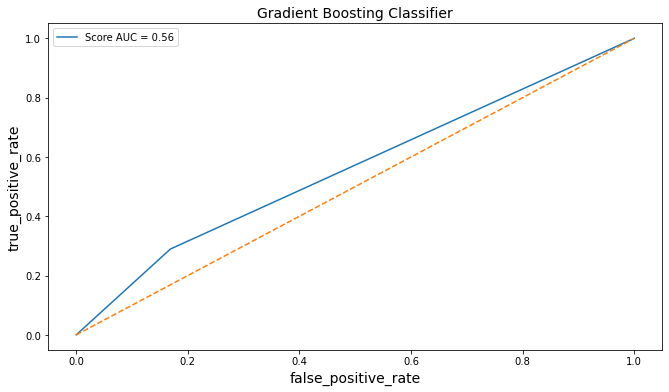

In [337]:
plt.plot(fpr['Taux'],tpr['Taux'], label = 'Score AUC = %0.2f'% score_lgbm )
plt.xlabel("false_positive_rate", fontsize = 14)
plt.ylabel("true_positive_rate", fontsize = 14)
plt.plot([0,1], [0,1], linestyle ='--')
plt.title('Gradient Boosting Classifier', fontsize = 14)
plt.legend(loc = 'best')
plt.show()


## Conclusion:

Sur la courbe du score, on remarque que le model a mieux appris sur les données  test.

### <font color = 'red' id = 'section_5_6_6'> 5.6.6 Optimisation du seuil de probabilité: Threshold

In [338]:
threshold_lgbm, optimal_tpr_minus_fpr, y_pred_proba_lgbm = threshold_from_optimal_tpr_minus_fpr(model_lgbm,
                                                                                    X_train, y_train, X_test, y_test)

#### Affichage du seuil optimale et les taux de faux et vrai posotif

In [339]:
print(" Le seuil optimal threshold correspondant au  taux TPR - FPR optimal est:", threshold_lgbm)
print(" Et la valeur du point optimum (TPR - FPR) corespondante :", optimal_tpr_minus_fpr)

 Le seuil optimal threshold correspondant au  taux TPR - FPR optimal est: 0.09045978779370134
 Et la valeur du point optimum (TPR - FPR) corespondante : 0.14976134346025305


#### Affichage de la probabilté correspondante

In [340]:
#y_pred_with_threshold = (y_pred_proba >= threshold).astype(int)
y_pred_with_threshold_lgbm = np.where(y_pred_proba_lgbm> threshold_lgbm,1,0 )
y_pred_with_threshold_lgbm

array([1, 0, 0, ..., 0, 1, 1])

### <font color ='red' > a. Visualisation matrice de confusion

In [341]:
cf_matrix_lgbm = confusion_matrix(y_test,y_pred_with_threshold_lgbm )

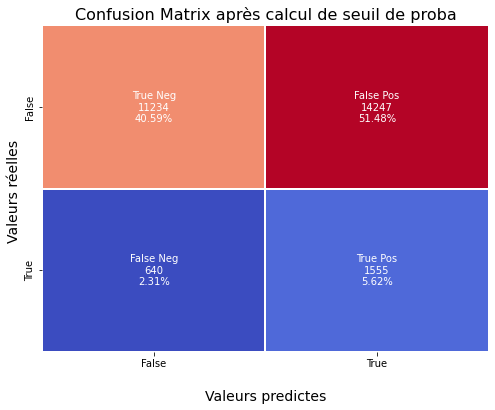

In [342]:
group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_lgbm.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_lgbm.flatten()/np.sum(cf_matrix_lgbm)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_lgbm, annot=labels, fmt='', cmap='coolwarm', cbar = False, linewidth =1.6)

ax.set_title('Confusion Matrix après calcul de seuil de proba', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color ='red' > b. Les mesures de performances correspondantes

In [343]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_with_threshold_lgbm))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_with_threshold_lgbm,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.95      0.44      0.60     25481
         1.0       0.10      0.71      0.17      2195

    accuracy                           0.46     27676
   macro avg       0.52      0.57      0.39     27676
weighted avg       0.88      0.46      0.57     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.6674613900434335


### commentaire:

Nous alons à présent contruire une fonction qui définira que le **coût** que les clients **classés dans la mauvaise  ou bonne catégorie** peut **coûter ou rapporter** à la banque.

## <font color = 'red' id =  "section_5_6_7" > 5.6.7 Fonction de coût métier

### <font color="red" >  a. Optimisation de la fonction coût
    
#### <font color="red" > Etape 1: 
    
Dans cette $1^{iére}$ étape, nous allons stocker dans _threshold_ tous les seuils de probabilté qui permetront d'optimiser les paraméres et la **fonction coût**.

In [344]:
y_pred_proba_lgbm = model_lgbm.predict_proba(X_test)[:, 1]
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba_lgbm)

In [345]:
df_precisions = pd.DataFrame(precisions)
df_precisions.columns = ['Values']
df_precisions.head(3)

,Values
0,0.079368
1,0.079335
2,0.079338


#### <font color="red" > Etape 2:  
  
Pour chaque valeur du seuil de probabilté, on va calculer la probabilité correspondante et les éléments de la matrice de confusion.

In [346]:
costs = []
tns = []
fps = []
fns = []
tps = []
accuracies = []
        
for threshold in tqdm(thresholds):
        y_pred_with_threshold_lgbm = np.where(y_pred_proba_lgbm > threshold, 1,0 )
            
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred_with_threshold_lgbm).ravel()
      
        accuracies.append((tp+tn)/(tn+fp+fn+tp))
        cout = default_cost_function(tn, fp, fn, tp)
        costs.append(cout)
        tns.append(tn)
        fps.append(fp)
        fns.append(fn)
        tps.append(tp)

100%|██████████| 27656/27656 [17:50<00:00, 25.83it/s] 


#### <font color="red" > Etape 3: Dataframe Fonction coût
  
Nous allons construire un dataframe sur lequel, on pourra extraire les paramétres optimaux pour la fonction coût.

In [347]:
df_cost_accu_lgbm = pd.DataFrame({'precision':precisions[:-1],
                              "accuracy": accuracies,
                                'recall':recalls[:-1], 
                                'threshold':thresholds, 
                                'cost':costs,
                                'tn':tns, 
                                'fp':fps,
                                'fn':fns,
                                'tp':tps})

In [348]:
df_cost_accu_lgbm.head()

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079368,0.079997,1.000000,0.017379,25471,20,25461,1,2194
1,0.079335,0.080033,0.999544,0.017468,25470,21,25460,1,2194
2,0.079338,0.079997,0.999544,0.017578,25480,21,25460,2,2193
3,0.079304,0.080033,0.999089,0.017589,25479,22,25459,2,2193
4,0.079307,0.080069,0.999089,0.017883,25478,23,25458,2,2193


#### <font color="red" > Etape 4:  Récupération  de la valeur minimale de la fonction cout

In [349]:
min_cost_lgbm = df_cost_accu_lgbm['cost'].min()
min_cost_lgbm

19846

In [350]:
threshold_opt_cost_lgbm = df_cost_accu_lgbm[df_cost_accu_lgbm['cost']==min_cost_lgbm].iloc[0]['threshold']

In [351]:
print("Le seuil de probabilité optimal pour minimiser la fonction cout est:", threshold_opt_cost_lgbm)

Le seuil de probabilité optimal pour minimiser la fonction cout est: 0.14823222365199248


#### <font color="red" > Etape 5:  Prediction des client avec ce seuil optimal

In [352]:
y_pred_thresthold_opt_lgbm = np.where(y_pred_proba_lgbm> threshold_opt_cost_lgbm,1,0 )

##  <font color="red" > b. Matrice de confusion optimale 

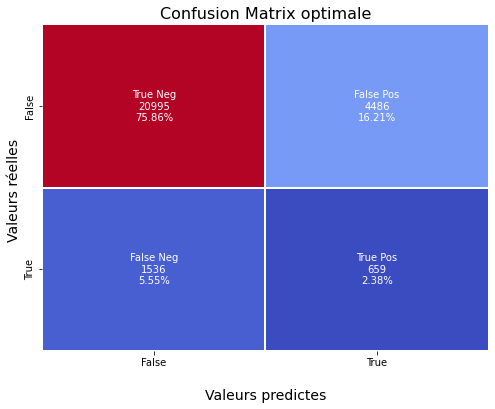

In [353]:
cf_matrix_opt_lgbm = confusion_matrix(y_test, y_pred_thresthold_opt_lgbm)

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_opt_lgbm.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_opt_lgbm.flatten()/np.sum(cf_matrix_opt_lgbm)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_opt_lgbm, annot=labels, fmt='', cmap='coolwarm', cbar = False, linewidth =1.6)

ax.set_title('Confusion Matrix optimale', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color = 'red' > C. Les mesure de performances correspondantes

In [354]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_thresthold_opt_lgbm))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_thresthold_opt_lgbm,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.93      0.82      0.87     25481
         1.0       0.13      0.30      0.18      2195

    accuracy                           0.78     27676
   macro avg       0.53      0.56      0.53     27676
weighted avg       0.87      0.78      0.82     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.29628525006120765


### <font color="red" > Visualisation

In [355]:
df_cost_accu_lgbm.head(2)

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079368,0.079997,1.000000,0.017379,25471,20,25461,1,2194
1,0.079335,0.080033,0.999544,0.017468,25470,21,25460,1,2194


In [356]:
df_mesure_cost = df_cost_accu_lgbm[df_cost_accu_lgbm["threshold"]==threshold_opt_cost_lgbm][["precision","recall", 
                                                                                          "accuracy", "threshold" ]].T
df_mesure_cost.columns = ["Values"]
df_mesure_cost

,Values
precision,0.128061
recall,0.300228
accuracy,0.782411
threshold,0.148232


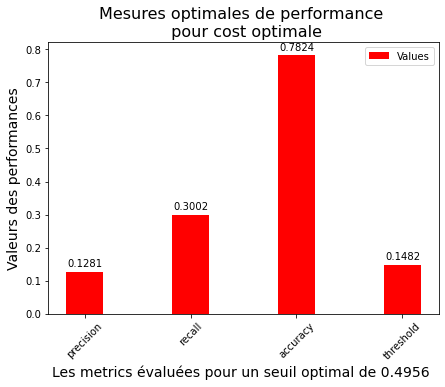

In [357]:
width = 0.35
fig, ax = plt.subplots(figsize = (7,5))
perf_values_cost = ax.bar(df_mesure_cost.index,  df_mesure_cost['Values'],
                 width, label='Values', color = 'red')
ax.set_ylabel("Valeurs des performances", fontsize = 14)
ax.set_title("Mesures optimales de performance \n pour cost optimale", fontsize = 16)

ax.tick_params(axis='x', labelrotation=45)
plt.xlabel("Les metrics évaluées pour un seuil optimal de 0.4956 ", fontsize = 14)
ax.legend()
ax.bar_label(perf_values_cost, padding=3, fmt='%.4f')
plt.draw()

#### <font color="red" > Visualisation de la fonction cout par rapport au seuil optimal

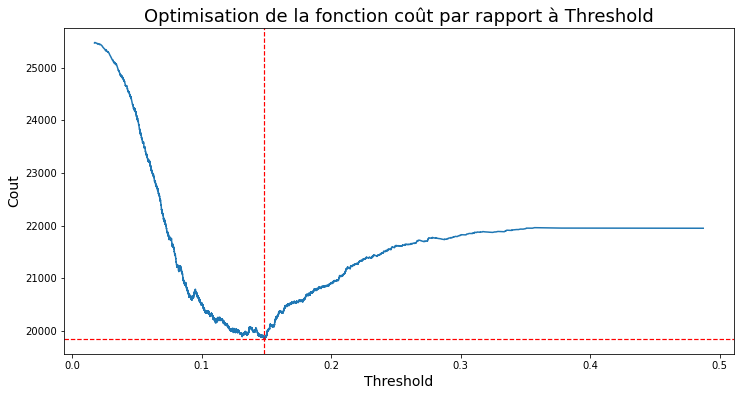

In [358]:
plt.figure(figsize = (12,6))
plt.plot(df_cost_accu_lgbm["threshold"], df_cost_accu_lgbm["cost"] )
plt.axvline(x = threshold_opt_cost_lgbm, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.axhline(y = min_cost_lgbm, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.xlabel("Threshold", fontsize = 14)
plt.ylabel("Cout", fontsize = 14)
plt.title("Optimisation de la fonction coût par rapport à Threshold", fontsize = 18)
plt.show()

### <font color="red" > Etape 8:  Evaluation du score ROC_AUC ( Air sous la courbe)

In [359]:
fpr_lgbm, tpr_lgbm, thresholds = roc_curve(y_test, y_pred_thresthold_opt_lgbm)
score_lgbm =  roc_auc_score(y_test, y_pred_thresthold_opt_lgbm)

In [360]:
print(score_lgbm)

0.5620875226250583


In [361]:
fpr = pd.DataFrame(fpr_lgbm)
tpr = pd.DataFrame(tpr_lgbm)

In [362]:
fpr.columns =["Taux"]
fpr.head()

,Taux
0,0.000000
1,0.176053
2,1.000000


In [363]:
tpr.columns =["Taux"]
tpr.head()

,Taux
0,0.000000
1,0.300228
2,1.000000


### <font color="red" > Visualisation

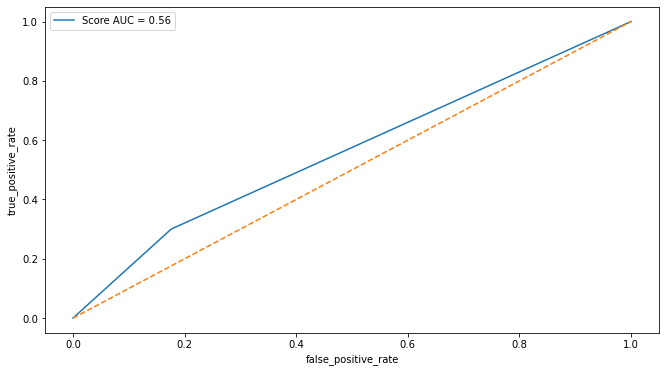

In [364]:
plt.plot(fpr['Taux'],tpr['Taux'], label = 'Score AUC = %0.2f'% score_lgbm)
plt.xlabel("false_positive_rate")
plt.ylabel("true_positive_rate")
plt.plot([0,1], [0,1], linestyle ='--')
plt.legend(loc = 'best')
plt.show()


## Conclusion:

Sur la courbe du score, on remarque le model de classification est mauvais.

In [365]:
fpr_com.append(fpr_lgbm)
tpr_com.append(tpr_lgbm)
score_auc_com.append(score_lgbm)

### <font color = 'red' id =  "section_5_6_8" > 5.6.8 Precision max vs Threshold
    
 On va maintenant chercher à maximiser  le **metric precision** en fonction du seuil de décision **_Threshold**_ optimal.
    
 Contruire la matrice de confusion correspondante et le grahe.

In [366]:
max_precision = df_cost_accu_lgbm["precision"].max()
max_precision

0.2727272727272727

In [367]:
threshold_max_prec = df_cost_accu_lgbm[df_cost_accu_lgbm["precision"]==max_precision].iloc[0]["threshold"]

In [368]:
print("Le seuil de probabilté optimale pour maximiser la mesure accuracy est:", threshold_max_prec)

Le seuil de probabilté optimale pour maximiser la mesure accuracy est: 0.3341588395308709


In [369]:
y_pred_thresthold_opt_prec= np.where(y_pred_proba_lgbm > threshold_max_prec,1,0 )

### <font color = 'red' > C.  Visualisation 

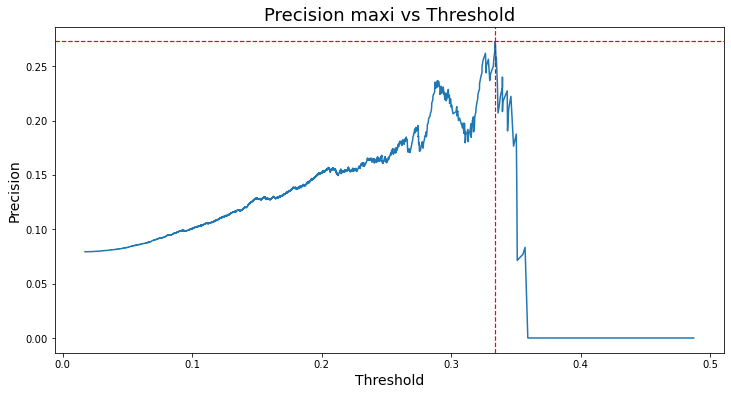

In [370]:
plt.figure(figsize = (12,6))
plt.plot(df_cost_accu_lgbm["threshold"], df_cost_accu_lgbm["precision"] )
plt.axvline(x = threshold_max_prec, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.axhline(y = max_precision, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.xlabel("Threshold", fontsize = 14)
plt.ylabel("Precision", fontsize = 14)
plt.title("Precision maxi vs Threshold", fontsize = 18)
plt.show()

##  <font color="red" > b. Matrice de confusion vs precision maximale

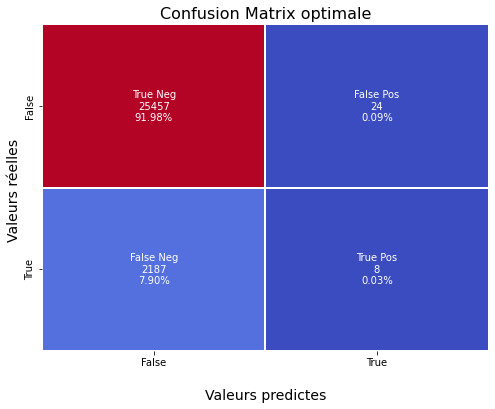

In [371]:
cf_matrix_opt_lgbm = confusion_matrix(y_test, y_pred_thresthold_opt_prec)

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_opt_lgbm.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_opt_lgbm.flatten()/np.sum(cf_matrix_opt_lgbm)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(8,6))
ax = sns.heatmap(cf_matrix_opt_lgbm, annot=labels, fmt='', cmap='coolwarm', cbar = False, linewidth = 1.6)

ax.set_title('Confusion Matrix optimale', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

### <font color = 'red' > C. Les mesure de performances correspondantes

In [372]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_thresthold_opt_prec))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_thresthold_opt_prec,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     25481
         1.0       0.25      0.00      0.01      2195

    accuracy                           0.92     27676
   macro avg       0.59      0.50      0.48     27676
weighted avg       0.87      0.92      0.88     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.0036805568208734944


### <font color="red" > Visualisation

In [373]:
df_cost_accu_lgbm.head(2)

,precision,accuracy,recall,threshold,cost,tn,fp,fn,tp
0,0.079368,0.079997,1.000000,0.017379,25471,20,25461,1,2194
1,0.079335,0.080033,0.999544,0.017468,25470,21,25460,1,2194


In [374]:
df_mesure_cost = df_cost_accu_lgbm[df_cost_accu_lgbm["threshold"]==threshold_max_prec][["precision","recall", 
                                                                                          "accuracy", "threshold" ]].T
df_mesure_cost.columns = ["Values"]
df_mesure_cost

,Values
precision,0.272727
recall,0.004100
accuracy,0.920111
threshold,0.334159


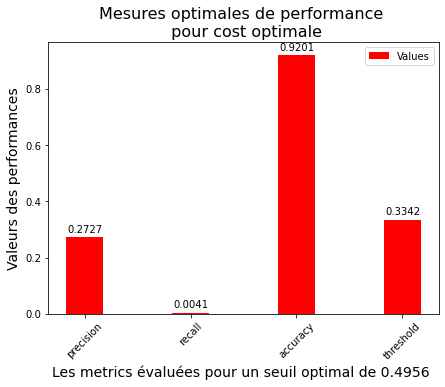

In [375]:
width = 0.35
fig, ax = plt.subplots(figsize = (7,5))
perf_values_cost = ax.bar(df_mesure_cost.index,  df_mesure_cost['Values'],
                 width, label='Values', color = 'red')
ax.set_ylabel("Valeurs des performances", fontsize = 14)
ax.set_title("Mesures optimales de performance \n pour cost optimale", fontsize = 16)

ax.tick_params(axis='x', labelrotation=45)
plt.xlabel("Les metrics évaluées pour un seuil optimal de 0.4956 ", fontsize = 14)
ax.legend()
ax.bar_label(perf_values_cost, padding=3, fmt='%.4f')
plt.draw()

### <font color="red" id="section_5_6_9"> 5.6.9 Features importances

In [376]:
feature_importances_values = model_lgbm.named_steps['classifier'].feature_importances_

In [377]:
feature_importances_values

array([ 93,  82,  76, 131,  29,   3,   1,   7,   9,  14,  66,  72, 309,
       325,  61, 176, 149, 273,  42,   7,   0,   9,   0,  23,  19,   0,
         0,  60,  14,  28,  10,   6,   0,   6,   0,  45,   0,   4,  50,
         0,   3,   4,   3,   7,   6,  89, 121, 194,  86,  88])

### Visualisation

In [378]:
#On calcules les inportancs des features
feature_importances_lgbm = model_lgbm.named_steps['classifier'].feature_importances_
#on recupere les noms des features
features_names = get_feature_names(preprocessor)

#On convertit les resulats en Series
df_feature_importance = pd.Series(feature_importances_lgbm, index=features_names)
# On trie  dans l'odres decroissant
df_feature_importance= df_feature_importance.sort_values(ascending =False)
# On affiches les resulats
df_feature_importance= df_feature_importance.head(7)

In [379]:
df_feature_importance

num__DAYS_LAST_PHONE_CHANGE        325
num__AMT_REQ_CREDIT_BUREAU_YEAR    309
num__DAYS_ID_PUBLISH               273
num__INCOME_PER_PERSON             194
num__AMT_GOODS_PRICE               176
num__DAYS_REGISTRATION             149
num__CNT_CHILDREN                  131
dtype: int32

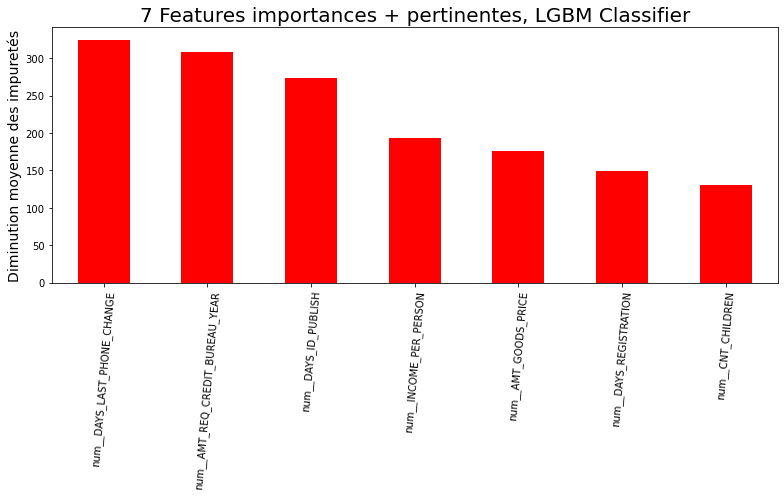

In [380]:
fig, ax = plt.subplots(figsize =(11,7))
df_feature_importance.plot.bar(ax=ax, color ='red')
ax.set_title("7 Features importances + pertinentes, LGBM Classifier", Fontsize =20)
ax.set_ylabel("Diminution moyenne des impuretés", fontsize =14)
plt.xticks(rotation =85)
fig.tight_layout()

### Commentaire: 

Ainsi, les variables qui ont plus d'impact sur la faillibilté ou non de remboursement de crédit sont:
* **DAYS LAST PHONE CHANGE**:

* **AMT REQ CRDIT BUREAU YEARS*** :

* **DAYS ID PUBLISH** :
 

### <font color="red" id="section_5_6_10"> 5.6.10 Importance des features pour un client spécifique

In [381]:
X_test_transformed = pd.DataFrame(model_lgbm[0].transform(X_test),
                          columns=X_test.columns,
                          index=X_test.index)

In [382]:
X_test_transformed.head(2)

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
195935,0.719504,-0.718909,-0.669248,-0.576904,-0.289732,-0.124265,-0.229722,-0.205108,-0.547384,-0.469979,0.939833,0.918882,-0.524895,-1.442783,0.783811,-0.665920,0.758688,0.675400,0.326535,-0.326535,-0.003935,-0.553594,-0.003935,2.156200,-0.279913,-0.005565,-0.013053,-1.031530,-0.326012,-1.324967,-0.265291,2.396712,-0.003935,-0.236078,-0.023944,-0.570078,-0.186117,-0.111502,0.641601,-0.060949,0.359427,-0.196001,-0.092853,-0.127439,-0.227434,-0.139612,-0.381257,-0.636311,0.602679,0.064162
179340,0.719504,-0.718909,-0.669248,-0.576904,-0.289732,-0.124265,-0.229722,-0.205108,-0.547384,-0.469979,0.939833,0.918882,0.049004,0.492466,0.783811,0.007465,-0.486837,1.158778,-3.062459,3.062459,-0.003935,-0.553594,-0.003935,-0.463779,-0.279913,-0.005565,-0.013053,0.969434,-0.326012,0.754736,-0.265291,-0.417238,-0.003935,-0.236078,-0.023944,-0.570078,-0.186117,-0.111502,0.641601,-0.060949,0.359427,-0.196001,-0.092853,-0.127439,-0.227434,-0.024510,-0.187956,-0.040107,-0.278380,-0.251631


### Client spécifique

In [383]:
idx = X_test_transformed.index[200]
idx

156297

In [385]:
data.loc[data.index== 156297, :]

,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
156297,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,2.0,7.0,0.0,225000.0,21.0,11.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.216395,0.5,112500.0,0.05972,0.02986


In [386]:
explainer = lime_tabular.LimeTabularExplainer(
                X_test_transformed, mode='classification',
                                 feature_names=X_test_transformed.columns,
                             class_names=["0", "1"],
                        discretize_continuous=False)

exp_lgbm = explainer.explain_instance(
    data_row=X_test_transformed.iloc[200], 
    predict_fn=model_lgbm[-1].predict_proba
)

### Visualisation

In [387]:
exp_lgbm.show_in_notebook(show_table=True)

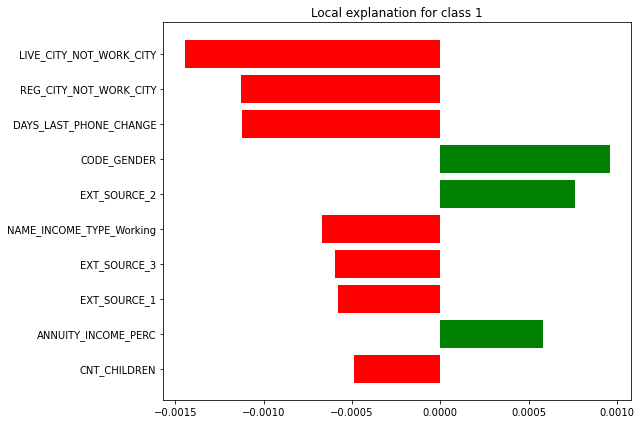

In [389]:
#exp.show_in_notebook(show_table=False)
plt.rcParams['figure.figsize'] =[9,6]
exp_lgbm.as_pyplot_figure()
plt.tight_layout()

## Commentaire : 

Ce client **"156297"** sera considéré comme étant **en faillite** au regard des information sur le graphique: Ainsi :

Les variables qui jouent plus  en sa faveur sont:

*  **NLIVE CITY NOT WORK CITY**: 

* **REG CITY NOT WORK CITY**

* **DAYS LAST PHONE CHANGE**

Et les variables qui jouent plus  en sa défaveur sont:

*  **CODE GENDER**: Une femme

* **EXT SOURCE_1**:

* **ANNUITY INCOME PERC**:

## <font color = 'red' id = section_6 > 6. Choix du meilleur model
    
 Le choix du meilleur model de classification se basera sur les **scores AUC** obtenus après optimation de la **fonction de coût.**

In [390]:
# Dictionnaire de classifieurs 
classifiers= {'Dummy Classifier': DummyClassifier(),
                  'Logistic Regression': LogisticRegression(),
                  'Random Forest': RandomForestClassifier(),
                  'Gradient boosting': GradientBoostingClassifier(),
                  'Xgboost': XGBClassifier(),
                  'LGBM': LGBMClassifier()
              }

In [391]:
df_fpr_com = pd.DataFrame(fpr_com).T
df_fpr_com.columns = ["Dummy", 'Logistic', 'Random Forest', 'Gadient Boosting', 'XGB', "LGBM"]
df_fpr_com.head(7)

,Dummy,Logistic,Random Forest,Gadient Boosting,XGB,LGBM
0,0.0,0.000000,0.000000,0.00000,0.000000,0.000000
1,1.0,0.318237,0.279306,0.22711,0.243868,0.176053
2,NaN,1.000000,1.000000,1.00000,1.000000,1.000000


In [392]:
df_tpr_com = pd.DataFrame(tpr_com).T
df_tpr_com.columns = ["Dummy", 'Logistic', 'Random Forest', 'Gadient  Boosting', 'XGB', "LGBM"]
df_tpr_com.head(6)

,Dummy,Logistic,Random Forest,Gadient Boosting,XGB,LGBM
0,0.0,0.00000,0.000000,0.000000,0.000000,0.000000
1,1.0,0.50205,0.401822,0.357631,0.365376,0.300228
2,NaN,1.00000,1.000000,1.000000,1.000000,1.000000


In [393]:
df_score_auc_com = pd.DataFrame(score_auc_com).T
df_score_auc_com.columns = ["Dummy", 'Logistic', 'Random Forest', 'Gadient  Boosting', 'XGB', "LGBM"]
df_score_auc_com = df_score_auc_com.T
df_score_auc_com.columns = ['Score AUC']
df_score_auc_com = df_score_auc_com.sort_values( by = ['Score AUC'], ascending = False)
df_score_auc_com

,Score AUC
Logistic,0.591906
Gadient Boosting,0.565260
LGBM,0.562088
Random Forest,0.561258
XGB,0.560754
Dummy,0.500000


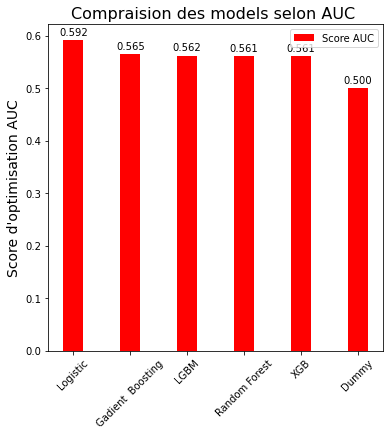

In [431]:
width = 0.35
fig, ax = plt.subplots(figsize = (6,6))
perf_values_auc = ax.bar(df_score_auc_com.index,  df_score_auc_com['Score AUC'],
                 width, label='Score AUC', color = 'red')
ax.set_ylabel("Score d'optimisation AUC", fontsize = 14)
ax.set_title("Compraision des models selon AUC ", fontsize = 16)

ax.tick_params(axis='x', labelrotation=45)
#plt.xlabel("Score AUC optimisé", fontsize = 14)
ax.legend(loc = 'best')
ax.bar_label(perf_values_auc, padding=3, fmt='%.3f')
plt.draw()

## <font color = 'red' id = section_7 > 7. Preparation pour le dashbord
    
Dans cette dernière partie, le meilleur model étant choisie selon l'AUC, nous allons à présent optimiser une nouvelle fois la fonction coût associé à ce model puis enrégister via **pickle** la **pipeline** avec des hyperparamètre optimisés,  **la matrice de confusion** correspondante en vue de l'élaboration de l'API. 
    
### <font color = 'red' id = "section_7_1" > 7.1  Rappel de la fonction coût

In [395]:
def default_cost_function(tn , fp, fn,  tp):
    tn_value= 0
    fp_value= 1
    fn_value= 10  # 10 fois poids  fp_value
    tp_value= 0 
    # Cout total
    cost_total =  tn*tn_value + fp*fp_value  + fn*fn_value + tp*tp_value
    
    
    return cost_total

### <font color = 'red' id = "section_7_2" > 7.2  Nouvelle optimisation de la fonction coût
  
#### <font color = 'red' > Etape 1: 
Dans cette $1^{iére}$ étape, nous allons stocker dans **_threshold_** tous les seuils de probabilté qui permetront d'optimiser les paraméres et la **fonction coût**.

In [396]:
y_pred_prob_opt = model_log.predict_proba(X_test)[:, 1]
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_prob_opt)

In [397]:
df_precisions = pd.DataFrame(precisions)
df_precisions.columns = ['Values']
df_precisions.head(3)

,Values
0,0.079336
1,0.079303
2,0.079306


#### <font color="red" > Etape 2:  
  
Pour chaque valeur du seuil de probabilté, on va calculer la probabilité correspondante et les éléments de la matrice de confusion.

In [398]:
costs = []
accuracies = []
        
for threshold in tqdm(thresholds):
        y_pred_with_threshold_opt = np.where(y_pred_prob_opt > threshold, 1,0 )
            
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred_with_threshold_opt).ravel()
        
        accuracies.append((tp+tn)/(tn+fp+fn+tp))
        #cout = 10*fn + fp
        cout = default_cost_function(tn, fp, fn, tp)
        costs.append(cout)

100%|██████████| 27667/27667 [18:14<00:00, 25.27it/s]


#### <font color="red" > Etape 3: Dataframe Fonction coût
  
Nous allons construire un dataframe sur lequel, on pourra extraire les paramétres optimaux pour la fonction coût.

In [399]:
df_cost = pd.DataFrame({'precision':precisions[:-1],
                              "accuracy": accuracies,
                                'recall':recalls[:-1], 
                                'threshold':thresholds, 
                                'cost':costs,
                                })

In [400]:
df_cost.head()

,precision,accuracy,recall,threshold,cost
0,0.079336,0.079600,1.000000,0.000067,25482
1,0.079303,0.079636,0.999544,0.000067,25481
2,0.079306,0.079672,0.999544,0.000077,25480
3,0.079309,0.079708,0.999544,0.000088,25479
4,0.079312,0.079744,0.999544,0.000088,25478


In [401]:
df_cost.to_csv('df_cout.csv', index = False)

#### <font color="red" > Etape 4:  Récupération  de la valeur minimale de la fonction cout

In [402]:
min_cost = df_cost['cost'].min()
min_cost

19039

In [403]:
threshold_log_cost = df_cost[df_cost['cost']==min_cost].iloc[0]['threshold']

In [404]:
print("Le seuil de probabilité optimal pour minimiser la fonction cout est:", threshold_log_cost)

Le seuil de probabilité optimal pour minimiser la fonction cout est: 0.5382577289616433


#### <font color="red" > Etape 5:  Prediction des client avec ce seuil optimal

In [405]:
y_pred_thresthold_opt = np.where(y_pred_prob_opt > threshold_log_cost,1,0 )

##  <font color="red" > a. Matrice de confusion optimale 

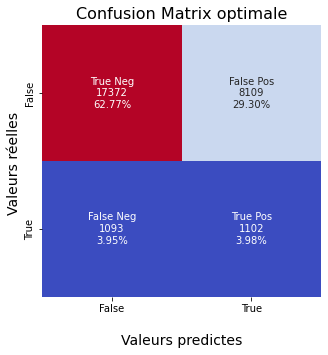

In [432]:
cf_matrix_opt_log = confusion_matrix(y_test, y_pred_thresthold_opt)

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
cf_matrix_opt_log.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
cf_matrix_opt_log.flatten()/np.sum(cf_matrix_opt_log)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

plt.figure(figsize =(5,5))
ax = sns.heatmap(cf_matrix_opt_log, annot=labels, fmt='', cmap='coolwarm', cbar = False)

ax.set_title('Confusion Matrix optimale', fontsize = 16);
ax.set_xlabel('\nValeurs predictes', fontsize = 14)
ax.set_ylabel('Valeurs réelles ', fontsize = 14);

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

## <font color = 'red' > b. Les mesure de performances correspondantes

In [407]:
print('Les scores des différents metriques sur le training test:')
print("-"*75)
print(classification_report(y_test, y_pred_thresthold_opt))
print("-"*70)
# F-beta-score
print( "Le fbeta core vaut:", fbeta_score(y_test, y_pred_thresthold_opt,beta=10))


Les scores des différents metriques sur le training test:
---------------------------------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.94      0.68      0.79     25481
         1.0       0.12      0.50      0.19      2195

    accuracy                           0.67     27676
   macro avg       0.53      0.59      0.49     27676
weighted avg       0.88      0.67      0.74     27676

----------------------------------------------------------------------
Le fbeta core vaut: 0.4866490898994802


### <font color="red" > Visualisation

In [408]:
df_cost.head(2)

,precision,accuracy,recall,threshold,cost
0,0.079336,0.079600,1.000000,0.000067,25482
1,0.079303,0.079636,0.999544,0.000067,25481


In [409]:
df_mesure_cost = df_cost[df_cost["threshold"]==threshold_log_cost][["precision","recall", "accuracy", "threshold" ]].T
df_mesure_cost.columns = ["Values"]
df_mesure_cost

,Values
precision,0.119627
recall,0.502050
accuracy,0.667510
threshold,0.538258


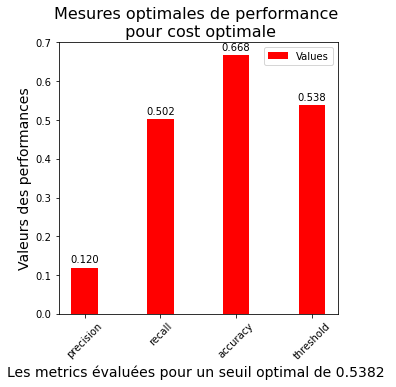

In [429]:
width = 0.35
fig, ax = plt.subplots(figsize = (5,5))
perf_values_cost = ax.bar(df_mesure_cost.index,  df_mesure_cost['Values'],
                 width, label='Values', color = 'red')
ax.set_ylabel("Valeurs des performances", fontsize = 14)
ax.set_title("Mesures optimales de performance \n pour cost optimale", fontsize = 16)

ax.tick_params(axis='x', labelrotation=45)
plt.xlabel("Les metrics évaluées pour un seuil optimal de 0.5382 ", fontsize = 14)
ax.legend()
ax.bar_label(perf_values_cost, padding=3, fmt='%.3f')
plt.draw()

#### <font color="red" > Etape 7:  Visualisation de la fonction cout par rapport au seuil optimal

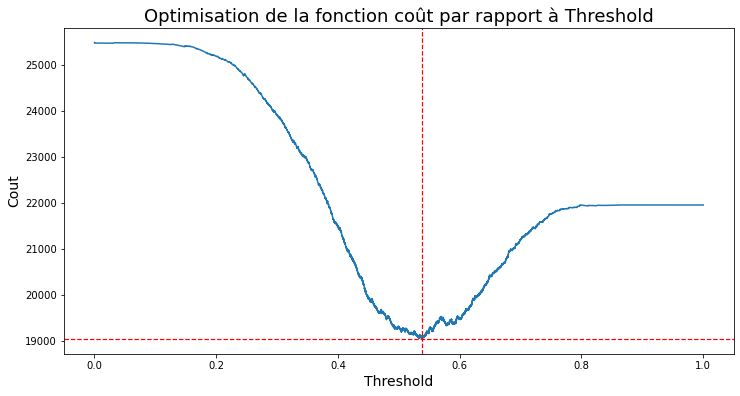

In [411]:
plt.figure(figsize = (12,6))
plt.plot(df_cost["threshold"], df_cost["cost"] )
plt.axvline(x = threshold_opt_cost, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.axhline(y = min_cost, linewidth = 1.2, color = 'red', linestyle ='--' )
plt.xlabel("Threshold", fontsize = 14)
plt.ylabel("Cout", fontsize = 14)
plt.title("Optimisation de la fonction coût par rapport à Threshold", fontsize = 18)
plt.show()

### <font color="red" > C. Evaluation du score ROC_AUC ( Air sous la courbe)

In [412]:
fpr_log_opt, tpr_log_opt, thresholds = roc_curve(y_test, y_pred_thresthold_opt)
score_log_opt =  roc_auc_score(y_test, y_pred_thresthold_opt)

In [413]:
print(score_log_opt)

0.5919064980213493


### <font color="red" > Visualisation

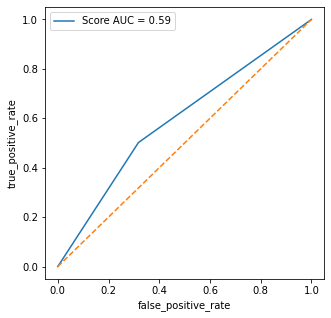

In [440]:
plt.figure(figsize =(5,5))
plt.plot(fpr_log_opt,tpr_log_opt, label = 'Score AUC = %0.2f'% score_log_opt )
plt.xlabel("false_positive_rate")
plt.ylabel("true_positive_rate")
plt.plot([0,1], [0,1], linestyle ='--')
plt.legend(loc = 'best')
plt.show()


## Conclusion:

Sur la courbe du score, on remarque le model de classification n

## <font color="red" > d. Numérisation des données

In [415]:
import pickle

In [416]:
##Le pipeline avec le model
pickle.dump(model_log, open("Model_choice.md", "wb"))

In [417]:
##la matrice de confusion oprimale
pickle.dump(cf_matrix_opt_log, open("conf_mx_opt", "wb"))

## <font color = 'red' id = "section_7_3" > 7.3  Importance features
### <font color = 'red' id = "section_7_3_1" > 7.3.1   Cas global

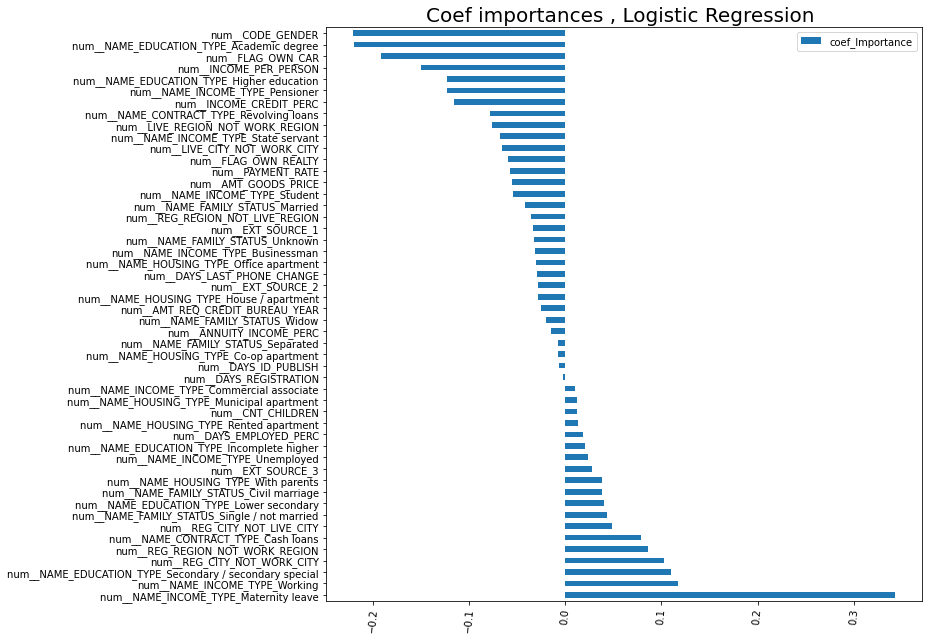

In [434]:
#Calcul du coef importance
coef_importances_values = model_log.named_steps['classifier'].coef_
df_coef_log = pd.DataFrame(model_log.named_steps['classifier'].coef_.flatten(),
                          index=get_feature_names(preprocessor),
                          columns=["coef_Importance"]).sort_values(by = "coef_Importance", ascending =False)
#GRAPHIQUE
fig, ax = plt.subplots(figsize =(13,9))
df_coef_log.plot.barh(ax=ax)
ax.set_title("Coef importances , Logistic Regression ", Fontsize =20)
#ax.set_ylabel("Diminution moyenne des impuretés", fontsize =14)
plt.xticks(rotation =85)
fig.tight_layout()

### Commentaire: 

**1.** Les écart-types sont tous égaux, donc la normalisation par l'ecart-types reste sans effet.


**2.** Ainsi, les variables qui ont plus d'impact sur la faillibilté ou non de remboursement de crédit sont:

* **CODE_GENDER** : Le genre des clients

* **NAME_INCOME_TYPE_Working** : Le type de contrat de travail du client

* **FLAG OWN CAR** : Capacité de remboursement

### <font color="red" id="section_7_3_2"> 7.3.2 Cas local avec LIME

In [419]:
X_test_transformed = pd.DataFrame(model_log[0].transform(X_test),
                          columns=X_test.columns,
                          index=X_test.index)

### Client spécifique

In [420]:
idx = X_test_transformed.index[2700]
idx

273146

In [421]:
data.loc[data.index== 273146, :]

,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,REG_CITY_NOT_LIVE_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE_2,AMT_GOODS_PRICE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE
273146,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,297000.0,17.0,11.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.041532,0.19856,16875.0,0.205067,0.040718


In [422]:
explainer_log_opt = lime_tabular.LimeTabularExplainer(
                X_test_transformed, mode='classification',
                                 feature_names=X_test_transformed.columns,
                             class_names=["Solvable", "Non solvable"],
                        discretize_continuous=False)

exp_log_opt = explainer_log.explain_instance(
    data_row=X_test_transformed.iloc[2700], 
    predict_fn=model_log[-1].predict_proba
)

### Visualisation

In [423]:
exp_log_opt.show_in_notebook(show_table=False)

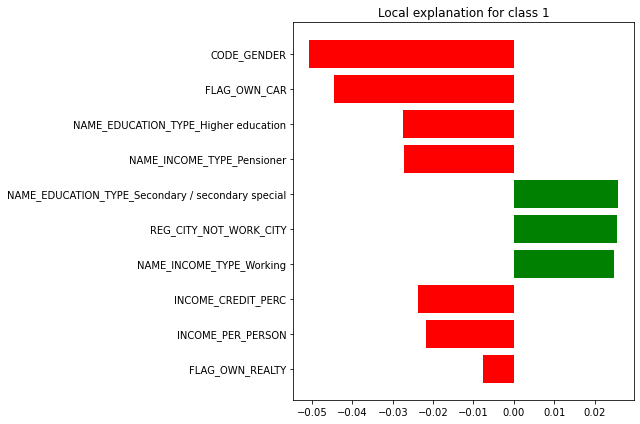

In [425]:
plt.rcParams['figure.figsize'] =[9,6]
exp_log_opt.as_pyplot_figure()
plt.tight_layout()

## Commentaire : 

Pour ce  client femme **"273146"**, le modèle predicte  **Non Solvable**, mais : 

Les variables qui jouent plus  en sa défaveur pour être en faillite sont:

*  **NAME EDUCATION TYPE SECONDARY/ secondary special**: Niveau d'éducation secondaire

*  **REG CIY NOT WORK CTY**:

*  **NAME INCOME TYPE Working**:

Et les variables qui jouent plus  en sa faveur son entre autres: 

*  **CODE GENDER**

* **FLAG OWN CAR** :Revenu par personne

* **NAME EDUCATION TYPE higher education**: